# PROJET N°2: Analysez des données de systèmes éducatifs

![ACADEMY](https://user.oc-static.com/upload/2023/03/21/16794159547105_Data%20Scientist-P2-01-banner.png)

## Table of Contents
* [STEP 0. IMPORT LIBRARIES + DATA](#chapter1)
* [STEP I. GENERAL DATA ANALYSIS](#chapter2)
    * [I.1. Dataset Quality Validation](#section_2_1)
    * [I.2. Data Description](#section_2_2)
* [STEP II. SELECT RELEVANT DATA](#chapter3)
    * [II.1. Detect the rows with only Nan Value](#section_3_1)
    * [II.2. Get the Frequency of Rows with Missing Numerical Values for each "Indicator Code"](#section_3_2)
    * [II.3. Select a Filtering Threshold AND Choice of the Indicators Among 15 Categories](#section_3_3)
* [STEP III. CREATE ONE OR MULTIPLE DATAFRAME FOR ANALYSIS](#chapter4)
    * [III.1. Create a Copy of df_data and Filter It](#section_4_1)
    * [III.2. Data Imputation (replacement or removal)](#section_4_2)
    * [III.3. Search and Removal of Outliers](#section_4_3)
    * [III.4. Reshape the Data](#section_4_4)
* [STEP IV. DATA ANALYSIS](#chapter5)
    * [IV.1. Univariate Analysis](#section_5_1)
    * [IV.2. Bivariate Analysis](#section_5_2)
    * [IV.3. Correlation Between Parameters](#section_5_3)
* [STEP V. SCORING](#chapter6)
    * [V.1. Verification of Some Hypothesis](#section_6_1)
    * [V.2. Visual Inspection of The TOP 10 Chosen Countries For Our Indicators](#section_6_2)

# STEP 0. IMPORT LIBRARIES + DATA <a class="anchor" id="chapter1"></a>

In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import missingno as msno
import imageio
import random 

from tabulate import tabulate
from collections import Counter
from scipy.stats import zscore

from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D


from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score


# Setting display precision for pandas
pd.set_option("display.precision", 2)

In [2]:
# ==================================================================================================
# READ DATA
# ==================================================================================================
# Define the file path for the Excel data
url_data = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET2_Analyser_des_donnees_de_systemes_educatifs\DATA\EdStatsEXCEL.xlsx"

# Read the 'Data' sheet into a DataFrame
df_data = pd.read_excel(url_data, sheet_name='Data')

# Read other sheets into separate DataFrames
df_country = pd.read_excel(url_data, sheet_name='Country')
df_series = pd.read_excel(url_data, sheet_name='Series')
df_country_series = pd.read_excel(url_data, sheet_name='Country-Series')
df_footnote = pd.read_excel(url_data, sheet_name='FootNote')

# Display the first 5 rows of the 'Data' DataFrame
df_data.head(5)


,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.82,54.89,56.21,57.27,57.99,59.37,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# STEP I. GENERAL DATA ANALYSIS <a class="anchor" id="chapter2"></a>

## I.1. Dataset Quality Validation
Checking for missing or duplicated data

91.18445562870717

Number of Duplicated Rows in Data: 0





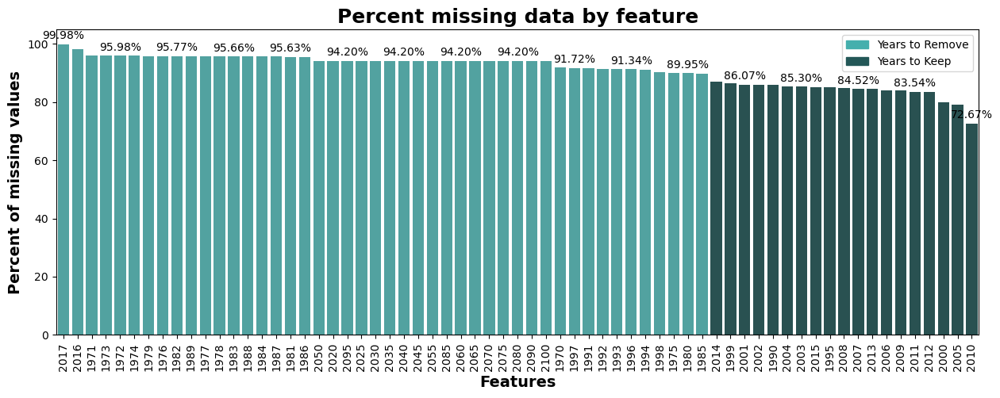

In [3]:
# # ==================================================================================================
# # VALIDATE DATA QUALITY
# # ==================================================================================================
# Set a threshold for the condition
threshold = 87.7

# Compute the missing ratio for all features in the 'Data' DataFrame
df_data_na = (df_data.isnull().sum() / len(df_data)) * 100

# Drop features with no missing values, then sort the remaining by their missing ratio in descending order
df_data_na = df_data_na.drop(df_data_na[df_data_na == 0].index).sort_values(ascending=False)

# Create a DataFrame to store the missing ratio information
df_missing_data = pd.DataFrame({'Missing Ratio': df_data_na})

# Plot the missing ratio for each feature
f, ax = plt.subplots(figsize=(15, 5))
plt.xticks(rotation=90)

# Color the bars based on the condition
bar_colors = [(69/255, 175/255, 173/255) if ratio >= threshold else (35/255, 87/255, 87/255) for ratio in df_missing_data['Missing Ratio']]

bars = sns.barplot(x=df_data_na.index, y=df_data_na, palette=bar_colors)

# Display the average missing ratio
print(df_missing_data['Missing Ratio'].mean())

# Display every nth label on the x-axis
n = 4
for i, (bar, value) in enumerate(zip(bars.patches, df_missing_data['Missing Ratio'])):
    if i % n == 0:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height + 1, f'{value:.2f}%', ha='center', va='bottom')

# Set labels and title for the plot
plt.xlabel('Features', fontsize=14, fontweight='bold')
plt.ylabel('Percent of missing values', fontsize=14, fontweight='bold')
plt.title('Percent missing data by feature', fontsize=18, fontweight='bold')

# Add legend
legend_labels = ['Years to Remove', 'Years to Keep']
legend_colors = [(69/255, 175/255, 173/255), (35/255, 87/255, 87/255)]
legend_handles = [Patch(color=color, label=label) for color, label in zip(legend_colors, legend_labels)]

plt.legend(handles=legend_handles)

# Check for duplicated rows in the 'Data' sheet
duplicated_rows = df_data.duplicated().sum()
print("\nNumber of Duplicated Rows in Data:", duplicated_rows)
print("\n\n")

<Axes: >

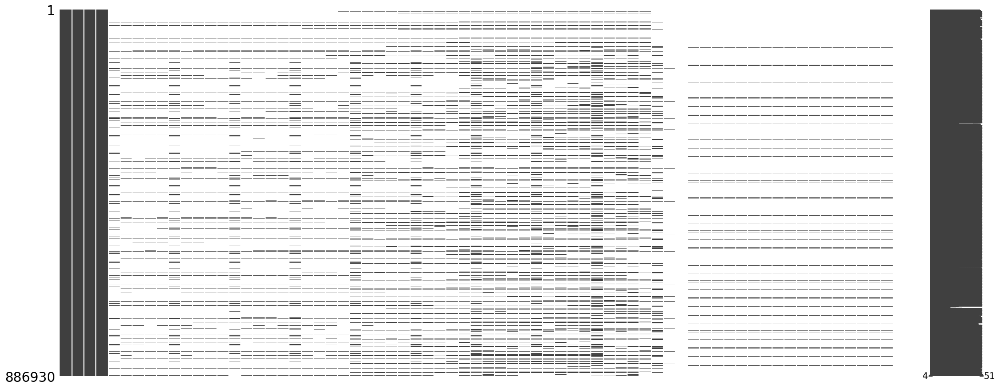

In [4]:
# ==================================================================================================
# VISUALIZE MISSING DATA
# ==================================================================================================

# Ensure that the missingno plots are displayed inline
%matplotlib inline

# Create a matrix visualization of missing data in the 'Data' DataFrame
msno.matrix(df_data)

### Insights : 
<div class="alert alert-block alert-info">
<b>Duplicate Data </b>: The dataset does not contain any duplicated rows, indicating that each row is unique. However, the indicators are repeated by country. There are 3665 lines by country. From the nullity matrix, it appears some kind of repetitive pattern for the missing rows. Probably, the same indicators are empty for a big number of countries.  <br>
<b>Missing Data</b>: The dataset exhibits a significant amount of missing data, particularly noticeable in the columns representing years. The missing ratio is consistently high, exceeding 72% on average and reaching close to 91%. <br> <br>

--> It is crucial to address this issue before further analysis or modeling, as the substantial gaps in the data may impact the accuracy and reliability of any insights derived.
--> Let's take a sample of the years : (1999 - 2015). Indeed few values after 2015 and outdated historical data (<1999).
</div>

## I.2. Data Description
Provide a detailed description of each data file:  number of rows, number of columns, types of different columns, etc.

In [5]:
# ==================================================================================================
# BASIC INFORMATION
# ==================================================================================================

# Display basic information about the DataFrame
print("Basic Information about the DataFrame:")
print(df_data.info())

# Display the number of rows and columns in the DataFrame
num_rows, num_columns = df_data.shape
print(f"\nNumber of Rows: {num_rows}")
print(f"Number of Columns: {num_columns}")

Basic Information about the DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886930 entries, 0 to 886929
Data columns (total 69 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Country Name    886930 non-null  object 
 1   Country Code    886930 non-null  object 
 2   Indicator Name  886930 non-null  object 
 3   Indicator Code  886930 non-null  object 
 4   1970            72288 non-null   float64
 5   1971            35537 non-null   float64
 6   1972            35619 non-null   float64
 7   1973            35545 non-null   float64
 8   1974            35730 non-null   float64
 9   1975            87306 non-null   float64
 10  1976            37483 non-null   float64
 11  1977            37574 non-null   float64
 12  1978            37576 non-null   float64
 13  1979            36809 non-null   float64
 14  1980            89122 non-null   float64
 15  1981            38777 non-null   float64
 16  1982            3

In [6]:
# ==================================================================================================
# Basic stats for numerical columns
# /!\ Statistic for numerical columns is meaningless right now. /!\
# ==================================================================================================

# # Display summary statistics for numerical columns in a table
# numerical_stats_table = df_data.describe().transpose()  # Transpose for better display
# numerical_stats_table = numerical_stats_table.reset_index()  # Reset index for better formatting

# # Display the table using tabulate
# print("\nSummary Statistics for Numerical Columns (Table):")
# print(tabulate(numerical_stats_table, headers='keys', tablefmt='pretty', showindex=False))

In [7]:
# ==================================================================================================
# BASIC STATS FOR CATEGORICAL COLUMNS
# ==================================================================================================
# Display summary statistics for categorical columns in a table
categorical_stats_table = df_data.describe(include='object').transpose()  # Transpose for better display
categorical_stats_table = categorical_stats_table.reset_index()  # Reset index for better formatting

# Display the table using tabulate
print("\nSummary Statistics for Categorical Columns (Table):")
print(tabulate(categorical_stats_table, headers='keys', tablefmt='pretty', showindex=False))



Summary Statistics for Categorical Columns (Table):
+----------------+--------+--------+--------------------------------------------------------------+------+
|     index      | count  | unique |                             top                              | freq |
+----------------+--------+--------+--------------------------------------------------------------+------+
|  Country Name  | 886930 |  242   |                          Arab World                          | 3665 |
|  Country Code  | 886930 |  242   |                             ARB                              | 3665 |
| Indicator Name | 886930 |  3665  | Adjusted net enrolment rate, lower secondary, both sexes (%) | 242  |
| Indicator Code | 886930 |  3665  |                          UIS.NERA.2                          | 242  |
+----------------+--------+--------+--------------------------------------------------------------+------+


In [8]:
# ==================================================================================================
# UNIQUE VALUES FOR CATEGORICAL COLUMNS
# ==================================================================================================

# Create a list to store individual tables for each column
unique_values_tables = []

# Display unique values and counts for each column in a table
for column in df_data.columns[:4]:
    unique_values = df_data[column].nunique()
    value_counts = df_data[column].value_counts()

    # Create a DataFrame for the current column
    column_table = pd.DataFrame({
        'Unique Values': unique_values,
        'Value Counts': value_counts
    }).reset_index()

    # Rename the column for better formatting
    column_table = column_table.rename(columns={'index': column})

    # Append the table to the list
    unique_values_tables.append(column_table)

# Display the tables using tabulate
print("\nUnique Values and Counts for Each Column (Tables):")
for table in unique_values_tables:
    print(tabulate(table, headers='keys', tablefmt='pretty', showindex=False))



Unique Values and Counts for Each Column (Tables):
+----------------------------------------------------+---------------+--------------+
|                    Country Name                    | Unique Values | Value Counts |
+----------------------------------------------------+---------------+--------------+
|                     Arab World                     |      242      |     3665     |
|                      Portugal                      |      242      |     3665     |
|               Micronesia, Fed. Sts.                |      242      |     3665     |
|                      Moldova                       |      242      |     3665     |
|                       Monaco                       |      242      |     3665     |
|                      Mongolia                      |      242      |     3665     |
|                     Montenegro                     |      242      |     3665     |
|                      Morocco                       |      242      |     3665     |
| 

## Insights : 
<div class="alert alert-block alert-info">
<b>Data Description:</b>
The dataset is a pandas DataFrame with 886,930 entries and 69 columns.
The columns include information such as Country Name, Country Code, Indicator Name, Indicator Code, and numeric columns representing years from 1970 to 2100. <br>

<b>Data Types:</b>
The majority of the columns are of type float64, representing numerical data, and four columns are of type object (Country Name, Country Code, Indicator Name, Indicator Code).

<b>Number of Country:</b> 242 (195 countries in the world today, so what about the extra ? Looks like it is some regional areas like Arab World or Latin America & Caribbean). 
--> 3 datatsets should be created, one for countries, one for geographical regions & one for income regions. 

<b>Number of Indicator:</b> 3665 indicators from 37 topics. 

<b>Categorical Columns:</b>
The categorical columns include "Country Name," "Country Code," "Indicator Name," and "Indicator Code."
There are 242 unique countries represented in the dataset.
The "Indicator Name" and "Indicator Code" columns have 3,665 unique values each.
</div>

# STEP II. SELECT RELEVANT DATA <a class="anchor" id="chapter3"></a>
>II.1. Detect the rows with only Nan Value <br>
>II.2. Get the Frequency of Each Indicator Code in Rows with Missing Numerical Values <br>
>II.3. Select a Filtering Threshold AND Choice of the Indicators Among 15 Categorieses

## II.1. Detect the Rows With Only Nan Values <a class="anchor" id="section_3_1"></a>

In [9]:
# ==================================================================================================
# SELECT ROWS WITH MISSING NUMERICAL VALUES
# ==================================================================================================

# Define a list of years as column names
years_column = ['1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981', '1982', '1983',
                 '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997',
                 '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011',
                 '2012', '2013', '2014', '2015', '2016', '2017', '2020', '2025', '2030', '2035', '2040', '2045', '2050', '2055',
                 '2060', '2065', '2070', '2075', '2080', '2085', '2090', '2095', '2100']

# Select only the rows where all numerical values are missing
rows_with_nan = df_data[df_data[years_column].isna().all(axis=1)]

# Display the resulting DataFrame
print("Rows with Missing Numerical Values:")
rows_with_nan

Rows with Missing Numerical Values:


,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Arab World,ARB,"Adjusted net enrolment rate, upper secondary, ...",UIS.NERA.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886475,Zimbabwe,ZWE,UIS: Percentage of population age 25+ with a d...,UIS.EA.8.AG25T99,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886480,Zimbabwe,ZWE,UIS: Percentage of population age 25+ with at ...,UIS.EA.7T8.AG25T99.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886481,Zimbabwe,ZWE,UIS: Percentage of population age 25+ with at ...,UIS.EA.7T8.AG25T99.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886482,Zimbabwe,ZWE,UIS: Percentage of population age 25+ with at ...,UIS.EA.7T8.AG25T99.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### II.2. Get the Frequency of Rows with Missing Numerical Values for each "Indicator Code"<a class="anchor" id="section_3_2"></a>

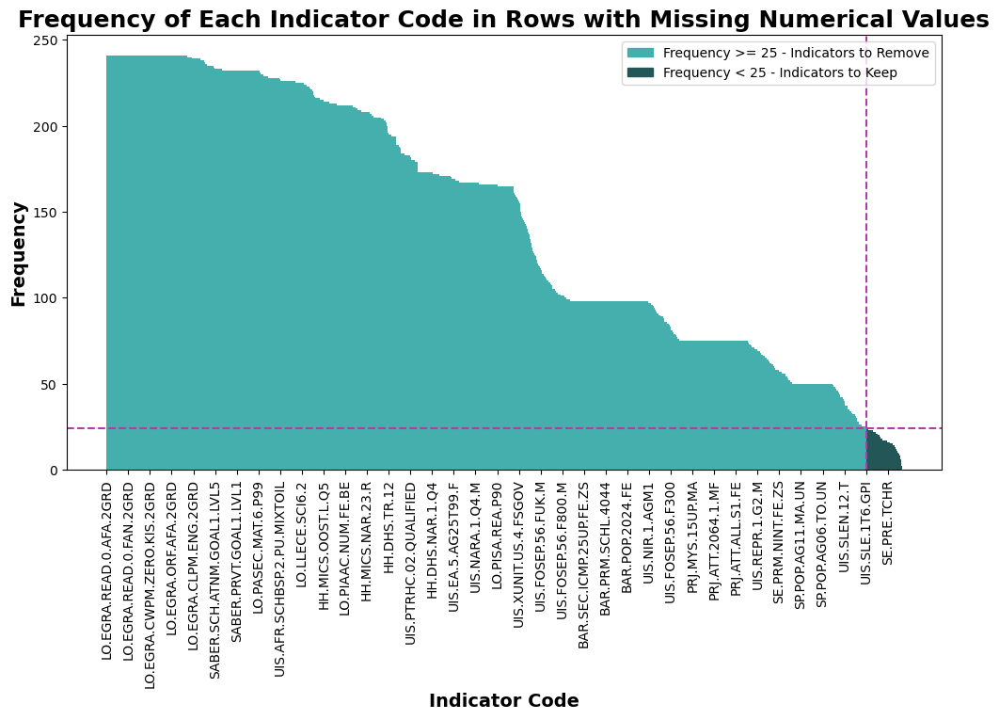

In [10]:
# ==================================================================================================
# FREQUENCY OF 'INDICATOR CODES' IN ROWS WITH MISSING NUMERICAL VALUES
# ==================================================================================================
# Set the threshold for frequency condition
frequency_threshold = 25

# Count the frequency of each value in the "Indicator Code" column for rows with missing numerical values
indicator_code_frequency = rows_with_nan['Indicator Code'].value_counts()

# Plot the bar graph with different colors based on the frequency condition
colors = [(69/255, 175/255, 173/255) if freq >= frequency_threshold else (35/255, 87/255, 87/255) for freq in indicator_code_frequency]

plt.figure(figsize=(12, 6))
plt.bar(indicator_code_frequency.index, indicator_code_frequency, color=colors, width=1, align='center')

# Add a horizontal line at frequency = 25
plt.axhline(y=frequency_threshold-1, color=(177/255, 59/255, 170/255), linestyle='--', label='Frequency Threshold')
# Find the index of the indicator with frequency = 25
indicator_at_threshold = indicator_code_frequency[indicator_code_frequency == frequency_threshold-1].index[0]
# Add a vertical line at the corresponding indicator
plt.axvline(x=np.where(indicator_code_frequency.index == indicator_at_threshold)[0][0], color=(177/255, 59/255, 170/255), linestyle='--', label='Indicator at Threshold')



plt.title('Frequency of Each Indicator Code in Rows with Missing Numerical Values', fontweight='bold', fontsize=18)
plt.xlabel('Indicator Code', fontweight='bold', fontsize=14)
plt.ylabel('Frequency', fontweight='bold', fontsize=14)

# Customize x-axis tick positions to display one label every 10 labels
plt.xticks(range(0, len(indicator_code_frequency), 100), indicator_code_frequency.index[::100], rotation=90)

# Create legend handles
legend_handles = [
    Patch(color=(69/255, 175/255, 173/255), label='Frequency >= 25 - Indicators to Remove'),
    Patch(color=(35/255, 87/255, 87/255), label='Frequency < 25 - Indicators to Keep')
]
# Add legend
plt.legend(handles=legend_handles, loc='upper right')

plt.show()


In [11]:
total_rows_with_nan = rows_with_nan.shape[0]
total_rows_with_nan

529525

## Insights : 
<div class="alert alert-block alert-info">
We identified the Rows with Missing Numerical Values in our dataset (529525 over 886930). 
It allows us to compute the  Frequency of Each Indicator Code in Rows with Missing Numerical Values. The bigger the value, the less credible the indicator.

By filtering the frequency with a threshold, we can reduce drastically the total number of indicators from: 
- 3665 to 505 with a filtering threshold of 50
- 3665 to 186 with a filtering threshold of 25
- 3665 to 18  with a filtering threshold of 10

</div>


## II.3. Select a Filtering Threshold AND Choice of the Indicators Among 15 Categories <a class="anchor" id="section_3_3"></a>

In [12]:
# ==================================================================================================
# INDICATORS FILTER BASED ON FREQUENCY THRESHOLD
# ==================================================================================================

# Set a frequency threshold (the number of rows full of NaN values allowed)
frequency_threshold = 25

# Filter indicators based on the frequency threshold
indicators_to_keep = indicator_code_frequency[indicator_code_frequency <= frequency_threshold].index

# Display the indicators to keep
print("Indicators to Keep:", len(indicators_to_keep), '\n')
print(indicators_to_keep, '\n')

# Function to get the Topic for a given Series Code
def get_topic(series_code):
    try:
        return df_series[df_series['Series Code'] == series_code]['Topic'].iloc[0]
    except IndexError:
        return None

# List of Series Codes to lookup
series_codes_to_lookup = indicators_to_keep.tolist()

# Counter dictionary to store topic counts
topic_counter = {}

# Dictionary to store indicators for each topic
topic_indicators = {}

# Print the results and build the topic_indicators dictionary
for series_code in series_codes_to_lookup:
    topic_value = get_topic(series_code)
    if topic_value is not None:
        topic_counter[topic_value] = topic_counter.get(topic_value, 0) + 1
        if topic_value not in topic_indicators:
            topic_indicators[topic_value] = [series_code]
        else:
            topic_indicators[topic_value].append(series_code)
    else:
        print(f"No Topic found for Series Code {series_code}")
print('\n')

# Create a DataFrame from the topic_indicators dictionary
df_topic_indicators = pd.DataFrame(list(topic_indicators.items()), columns=['Topic', 'Indicators'])

# Display the resulting DataFrame
# print(df_topic_indicators)

# Display & sort the resulting table
topic_counts = pd.DataFrame(list(topic_counter.items()), columns=['Topic', 'Counter']).sort_values(by='Counter', ascending=False)
print(topic_counts)

df_topic_indicators

Indicators to Keep: 186 

Index(['SE.ENR.TERT.FM.ZS', 'UIS.GER.1T6.GPI', 'UIS.SLE.0.M', 'UIS.SLE.56.F',
       'UIS.SLE.0.GPI', 'UIS.SLE.0.F', 'NY.GDP.PCAP.PP.KD', 'UIS.SLE.56.GPI',
       'UIS.SLE.56.M', 'UIS.NIRA.1',
       ...
       'SE.SEC.ENRL.FE', 'NY.GDP.PCAP.CD', 'SE.PRE.ENRL', 'SE.SEC.ENRL.GC.FE',
       'SE.PRM.ENRL.FE', 'SE.SEC.ENRL.GC', 'SE.SEC.ENRL', 'SE.PRM.ENRL',
       'SP.POP.TOTL', 'SP.POP.GROW'],
      dtype='object', name='Indicator Code', length=186) 

No Topic found for Series Code UIS.GER.1T6.GPI
No Topic found for Series Code UIS.GER.1T6.F
No Topic found for Series Code UIS.GER.1T6.M
No Topic found for Series Code UIS.SLE.1T6.GPI
No Topic found for Series Code SE.SEC.ENRR.UP.FE
No Topic found for Series Code SE.SEC.ENRR.UP.MA
No Topic found for Series Code UIS.OE.56.40510


                                                Topic  Counter
6                                           Secondary       57
3                                             Primary       29
9

,Topic,Indicators
0,Tertiary,"[SE.ENR.TERT.FM.ZS, UIS.SLE.56.F, UIS.SLE.56.G..."
1,Pre-Primary,"[UIS.SLE.0.M, UIS.SLE.0.GPI, UIS.SLE.0.F, UIS...."
2,Economic Policy & Debt: Purchasing power parity,"[NY.GDP.PCAP.PP.KD, NY.GDP.PCAP.PP.CD, NY.GDP...."
3,Primary,"[UIS.NIRA.1, SE.PRM.GINT.ZS, UIS.NERT.1.GPI, S..."
4,Health: Mortality,[SH.DYN.MORT]
5,Infrastructure: Communications,"[IT.CMP.PCMP.P2, IT.NET.USER.P2]"
6,Secondary,"[UIS.GER.3.GPI, UIS.GER.12.GPI, UIS.SLE.12.M, ..."
7,Health: Population: Structure,"[SP.POP.TOTL.FE.ZS, SP.POP.TOTL.MA.ZS, SP.POP...."
8,Teachers,"[SE.PRE.TCHR.FE.ZS, SE.PRE.ENRL.TC.ZS, SE.SEC...."
9,Population,"[UIS.SAP.23.GPV.G1.F, UIS.SAP.1.G1.M, UIS.SAP...."


In [13]:
# ==================================================================================================
# FLATTEN TOPIC-INDICATORS DATA
# ==================================================================================================

# Create an empty list to store the flattened data
flattened_data = []

# Iterate over each row in the original DataFrame
for index, row in df_topic_indicators.iterrows():
    topic = row['Topic']
    indicators = row['Indicators']
    
    # Iterate over each indicator in the list
    for indicator in indicators:
        # Append a new row with the current topic and indicator to the flattened data list
        flattened_data.append({'Topic': topic, 'Indicator Code': indicator})

# Create a new DataFrame from the flattened data list
flattened_df_test = pd.DataFrame(flattened_data)

# Display the flattened DataFrame
flattened_df_test

,Topic,Indicator Code
0,Tertiary,SE.ENR.TERT.FM.ZS
1,Tertiary,UIS.SLE.56.F
2,Tertiary,UIS.SLE.56.GPI
3,Tertiary,UIS.SLE.56.M
4,Tertiary,SE.TER.ENRR.MA
...,...,...
174,Economic Policy & Debt: National accounts: US$...,NY.GDP.PCAP.KD
175,Economic Policy & Debt: National accounts: US$...,NY.GNP.MKTP.CD
176,Economic Policy & Debt: National accounts: US$...,NY.GDP.MKTP.CD
177,Economic Policy & Debt: National accounts: US$...,NY.GDP.PCAP.CD


In [14]:
# ==================================================================================================
# FILTER SERIES BASED ON INDICATORS IN FLATTENED DATA
# ==================================================================================================

# Filter df_series based on "Indicator Code" from flattened_df_test
df_filtered_series = df_series[df_series['Series Code'].isin(flattened_df_test['Indicator Code'])]

# Select the desired columns
df_filtered_series = df_filtered_series[['Series Code', 'Topic', 'Indicator Name']]

# Display the result
df_filtered_series

,Series Code,Topic,Indicator Name
610,IT.CMP.PCMP.P2,Infrastructure: Communications,Personal computers (per 100 people)
611,IT.NET.USER.P2,Infrastructure: Communications,Internet users (per 100 people)
1658,NY.GDP.MKTP.CD,Economic Policy & Debt: National accounts: US$...,GDP (current US$)
1659,NY.GDP.MKTP.KD,Economic Policy & Debt: National accounts: US$...,GDP (constant 2010 US$)
1660,NY.GDP.MKTP.PP.CD,Economic Policy & Debt: Purchasing power parity,"GDP, PPP (current international $)"
...,...,...,...
3493,UIS.SLE.123.M,Secondary,"School life expectancy, primary and secondary,..."
3503,UIS.SLE.56,Tertiary,"School life expectancy, tertiary, both sexes (..."
3504,UIS.SLE.56.F,Tertiary,"School life expectancy, tertiary, female (years)"
3505,UIS.SLE.56.GPI,Tertiary,"School life expectancy, tertiary, gender parit..."


In [15]:
# # ==================================================================================================
# # SAVE DATA INTO EXCEL (filtered_df_series.xlsx)
# # ==================================================================================================

# # Specify the file path where you want to save the Excel file
# excel_file_path = r'C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET2_Analyser_des_donnees_de_systemes_educatifs\DATA\df_filtered_series.xlsx'

# # Write the DataFrame to Excel
# df_filtered_series.to_excel(excel_file_path, index=False)

# # Print a message indicating the successful save
# print(f"Filtered data has been successfully saved to: {excel_file_path}")

<div class="alert alert-block alert-info">
Reasons for the choice of this list of indicators
The selected indicators align well with the goals of Academy's international expansion for online education at the high school and university levels. 

- The chosen indicators provide a comprehensive understanding of target markets, considering economic well-being, demographic trends, education accessibility, and technological infrastructure. 
- They enable Academy to identify regions with potential demand, assess the socio-economic conditions of prospective students, and tailor educational offerings accordingly. 
- The focus on early childhood, primary, secondary, and tertiary education, coupled with considerations for mortality rates, population growth, and internet accessibility, ensures a well-rounded approach. 
- By prioritizing regions with favorable demographic profiles, economic stability, and high internet penetration, Academy can strategically expand its online education services to areas with the greatest potential for success and impact.
</div>

In [16]:
# ==================================================================================================
# SELECT INDICATORS (METHOD 1: MANUALLY) (THE ONE I CHOOSED)
# ==================================================================================================

# List of manually selected indicators
selected_indicators = ['SE.PRE.ENRL', 'NY.GNP.PCAP.CD', 'NY.GDP.MKTP.KD', 'NY.GDP.MKTP.CD', 
                       'NY.GDP.PCAP.PP.CD', 'SH.DYN.MORT', 'SP.POP.GROW', 'SP.POP.0014.TO.ZS', 
                       'SP.POP.1564.TO.ZS', 'SP.POP.TOTL', 'IT.NET.USER.P2', 'SP.TER.TOTL.IN', 
                       'UIS.SLE.0', 'SE.PRM.ENRR', 'SE.SEC.ENRR', 'SE.PRM.ENRL.TC.ZS', 'SE.TER.ENRR']

# Set display option for maximum column width
pd.options.display.max_colwidth = 100

# Filter df_filtered_series based on the manually selected indicators
df_filtered_series = df_filtered_series[df_filtered_series['Series Code'].isin(selected_indicators)]

# Sort the DataFrame by 'Topic' and reset the index
df_filtered_series = df_filtered_series.sort_values(by='Topic')
df_filtered_series = df_filtered_series.reset_index(drop=True)

# Display the resulting DataFrame
df_filtered_series


,Series Code,Topic,Indicator Name
0,SE.PRE.ENRL,Early Childhood Education,"Enrolment in pre-primary education, both sexes (number)"
1,NY.GNP.PCAP.CD,Economic Policy & Debt: National accounts: Atlas GNI & GNI per capita,"GNI per capita, Atlas method (current US$)"
2,NY.GDP.MKTP.KD,Economic Policy & Debt: National accounts: US$ at constant 2010 prices: Aggregate indicators,GDP (constant 2010 US$)
3,NY.GDP.MKTP.CD,Economic Policy & Debt: National accounts: US$ at current prices: Aggregate indicators,GDP (current US$)
4,NY.GDP.PCAP.PP.CD,Economic Policy & Debt: Purchasing power parity,"GDP per capita, PPP (current international $)"
5,SH.DYN.MORT,Health: Mortality,"Mortality rate, under-5 (per 1,000 live births)"
6,SP.POP.GROW,Health: Population: Dynamics,Population growth (annual %)
7,SP.POP.TOTL,Health: Population: Structure,"Population, total"
8,SP.POP.1564.TO.ZS,Health: Population: Structure,Population ages 15-64 (% of total)
9,SP.POP.0014.TO.ZS,Health: Population: Structure,Population ages 0-14 (% of total)


In [17]:
# ==================================================================================================
# SELECT INDICATORS (METHOD 2: RANDOMLY) (NOT SELECTED FINALLY)
# ==================================================================================================

# Dictionary to store randomly selected indicators for each topic
selected_indicators = {}

# Randomly select one indicator from each topic
for index, row in df_topic_indicators.iterrows():
    topic = row['Topic']
    indicators = row['Indicators']
    
    if indicators:
        selected_indicator = np.random.choice(indicators)
        selected_indicators[topic] = selected_indicator

# Create a DataFrame from the selected indicators
df_selected_indicators = pd.DataFrame(list(selected_indicators.items()), columns=['Topic', 'Selected Indicator'])

# Display the resulting DataFrame
df_selected_indicators

,Topic,Selected Indicator
0,Tertiary,UIS.GOER.56
1,Pre-Primary,UIS.SLE.0
2,Economic Policy & Debt: Purchasing power parity,NY.GDP.MKTP.PP.KD
3,Primary,SE.PRM.ENRR
4,Health: Mortality,SH.DYN.MORT
5,Infrastructure: Communications,IT.CMP.PCMP.P2
6,Secondary,SE.SEC.ENRL.GC
7,Health: Population: Structure,SP.POP.1564.TO.ZS
8,Teachers,SE.PRE.TCHR.FE
9,Population,SP.PRE.TOTL.IN


# STEP III. CREATE ONE OR MULTIPLE DATAFRAME FOR ANALYSIS <a class="anchor" id="chapter4"></a>

<div class="alert alert-block alert-info">
In STEP II, we discover that the years between 1999 and 2015 are the most interesting for our analysis. We also reduced drastically the total number of indicators from 3665 to 17. Each indicator has a different topic. 
</div>

## III.1. Create a Copy of df_data and Filter It <a class="anchor" id="section_4_1"></a>

In [18]:
# ==================================================================================================
# FILTER COLUMNS BASED ON YEAR RANGE (1999 TO 2015) AND ROWS BASED ON THE SELECTED INDICATORS 
# (METHOD 1 or METHOD 2)
# ==================================================================================================

# Filter columns based on the year range (1999 to 2015)
df_filtered_data = df_data.drop(columns=[col for col in df_data.columns if (col not in ['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code']) and (1999 > int(col) or int(col) > 2015)])

# List of selected indicators (Method 1 - Manually)
selected_indicators_list_Method1 = df_filtered_series['Series Code'].tolist()

# List of selected indicators (Method 2 - Randomly)
selected_indicators_list_Method2 = ['SE.TOT.ENRR', 'UIS.SLE.0.F', 'NY.GDP.PCAP.PP.KD', 'SE.PRM.ENRL', 'SH.DYN.MORT', 'IT.CMP.PCMP.P2', 'UIS.FEP.2', 'SP.POP.TOTL.FE.IN',
 'SE.TER.TCHR', 'SP.PRM.GRAD.TO', 'NY.GNP.PCAP.CD', 'SE.PRE.ENRL', 'NY.GDP.MKTP.KD', 'NY.GNP.MKTP.CD', 'SP.POP.GROW']

# Choice of the selected indicators (Method 1 or Method 2)
selected_indicators_list = selected_indicators_list_Method1

# Filter rows based on the list of selected indicators
df_filtered_data = df_filtered_data[df_filtered_data['Indicator Code'].isin(selected_indicators_list)]
df_filtered_data = df_filtered_data.reset_index(drop=True)

# Display the resulting DataFrame
df_filtered_data

,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Arab World,ARB,"Enrolment in pre-primary education, both sexes (number)",SE.PRE.ENRL,2.37e+06,2.45e+06,2.46e+06,2.52e+06,2.61e+06,2.71e+06,...,3.11e+06,3.14e+06,3.46e+06,4.03e+06,4.19e+06,4.27e+06,4.45e+06,4.44e+06,4.94e+06,NaN
1,Arab World,ARB,GDP at market prices (constant 2005 US$),NY.GDP.MKTP.KD,8.82e+11,9.27e+11,9.48e+11,9.65e+11,1.02e+12,1.11e+12,...,1.26e+12,1.33e+12,1.42e+12,1.44e+12,1.52e+12,1.57e+12,1.66e+12,1.72e+12,NaN,NaN
2,Arab World,ARB,GDP at market prices (current US$),NY.GDP.MKTP.CD,6.34e+11,7.26e+11,7.13e+11,7.24e+11,8.16e+11,9.59e+11,...,1.40e+12,1.64e+12,2.08e+12,1.79e+12,2.10e+12,2.49e+12,2.74e+12,2.85e+12,NaN,NaN
3,Arab World,ARB,"GDP per capita, PPP (current international $)",NY.GDP.PCAP.PP.CD,8.65e+03,9.09e+03,9.33e+03,9.39e+03,9.70e+03,1.07e+04,...,1.23e+04,1.30e+04,1.37e+04,1.39e+04,1.44e+04,1.48e+04,1.57e+04,1.61e+04,NaN,NaN
4,Arab World,ARB,"GNI per capita, Atlas method (current US$)",NY.GNP.PCAP.CD,2.29e+03,2.39e+03,2.47e+03,2.47e+03,2.64e+03,3.04e+03,...,4.11e+03,4.73e+03,5.55e+03,5.64e+03,5.91e+03,6.31e+03,7.20e+03,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4109,Zimbabwe,ZWE,"Population, ages 0-14 (% of total)",SP.POP.0014.TO.ZS,4.32e+01,4.28e+01,4.25e+01,4.23e+01,4.21e+01,4.20e+01,...,4.17e+01,4.16e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01
4110,Zimbabwe,ZWE,"Population, ages 15-64 (% of total)",SP.POP.1564.TO.ZS,5.37e+01,5.41e+01,5.43e+01,5.46e+01,5.47e+01,5.49e+01,...,5.52e+01,5.53e+01,5.54e+01,5.54e+01,5.54e+01,5.55e+01,5.55e+01,5.56e+01,5.56e+01,5.57e+01
4111,Zimbabwe,ZWE,"Population, total",SP.POP.TOTL,1.21e+07,1.22e+07,1.24e+07,1.25e+07,1.26e+07,1.28e+07,...,1.31e+07,1.33e+07,1.36e+07,1.38e+07,1.41e+07,1.44e+07,1.47e+07,1.51e+07,1.54e+07,1.58e+07
4112,Zimbabwe,ZWE,Pupil-teacher ratio in primary education (headcount basis),SE.PRM.ENRL.TC.ZS,4.10e+01,3.70e+01,3.81e+01,3.94e+01,3.86e+01,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,3.59e+01,3.64e+01,NaN,NaN


## III.2. Data Imputation (replacement or removal) <a class="anchor" id="section_4_2"></a>

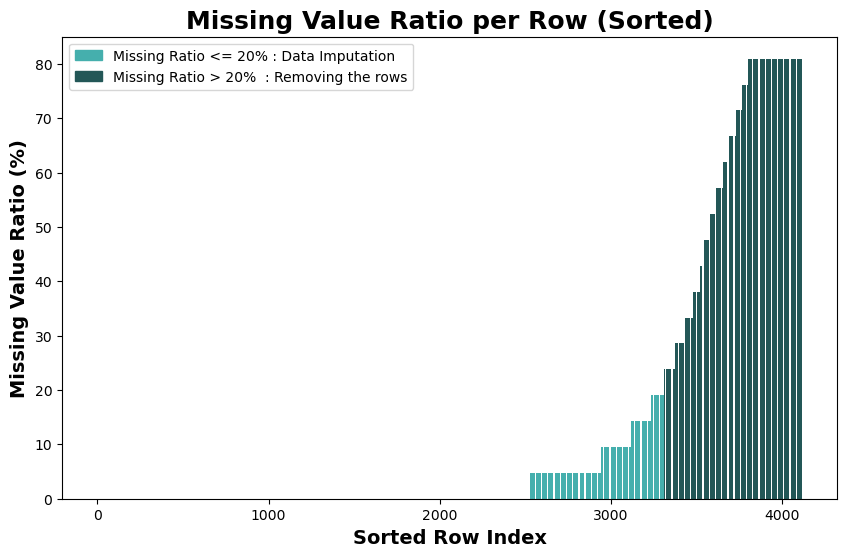

Total number of rows with a missing value ratio greater than 20%: 802 rows will be removed!!
Total number of rows with a missing value ratio greater than 0% and smaller than 20%: 788 rows will be imputed!!


,Country Name,Indicator Code,Missing_Value_Ratio
0,Arab World,SE.PRE.ENRL,4.76
1,Arab World,NY.GDP.MKTP.KD,9.52
2,Arab World,NY.GDP.MKTP.CD,9.52
3,Arab World,NY.GDP.PCAP.PP.CD,9.52
4,Arab World,NY.GNP.PCAP.CD,14.29
...,...,...,...
4109,Zimbabwe,SP.POP.0014.TO.ZS,0.00
4110,Zimbabwe,SP.POP.1564.TO.ZS,0.00
4111,Zimbabwe,SP.POP.TOTL,0.00
4112,Zimbabwe,SE.PRM.ENRL.TC.ZS,47.62


In [19]:
# ==================================================================================================
# TAKE CARE OF NAN VALUES
# 1. Remove rows when Very High Missing Value Ratio (MVR) (e.g., MVR >= 20%):
# Reason: Rows with an extremely high missing value ratio may be considered for removal since imputation 
# becomes increasingly challenging and the potential for bias is higher.
# 2. Impute data when Missing Value Ratio (0% < MVR < 20%)
# ==================================================================================================

# Step 1: Calculate the total number of columns
total_columns = len(df_filtered_data.columns)

# Step 2: Calculate the number of missing values in each row
missing_values_per_row = df_filtered_data.isnull().sum(axis=1)

# Step 3: Calculate the missing value ratio for each row
missing_value_ratio_per_row = (missing_values_per_row / total_columns) * 100

# Step 4: Optionally, add the missing value ratio as a new column in your DataFrame
df_filtered_data['Missing_Value_Ratio'] = missing_value_ratio_per_row

# Get the indices that would sort the missing_value_ratio_per_row
sorted_indices = missing_value_ratio_per_row.argsort()

# Sort the missing_value_ratio_per_row and corresponding row indices
sorted_missing_values = missing_value_ratio_per_row[sorted_indices]
sorted_row_indices = range(len(missing_value_ratio_per_row))


# Set a threshold for the missing value ratio
missing_ratio_threshold = 20

# Set the color based on the missing value ratio condition
bar_colors = [(69/255, 175/255, 173/255) if ratio <= missing_ratio_threshold else (35/255, 87/255, 87/255) for ratio in sorted_missing_values]


# Plotting the bar graph
plt.figure(figsize=(10, 6))
plt.bar(sorted_row_indices, sorted_missing_values, color=bar_colors)

# Create legend handles
legend_handles = [
    Patch(color=(69/255, 175/255, 173/255), label='Missing Ratio <= 20% : Data Imputation'),
    Patch(color=(35/255, 87/255, 87/255)  , label='Missing Ratio > 20%  : Removing the rows')
]

# Add legend at top right
plt.legend(handles=legend_handles, loc='upper left')


plt.xlabel('Sorted Row Index', fontweight='bold',fontsize=14)
plt.ylabel('Missing Value Ratio (%)', fontweight='bold',fontsize=14)
plt.title('Missing Value Ratio per Row (Sorted)',fontweight='bold',fontsize=18)
plt.show()

# Count the total number of rows with a missing value ratio greater than 20%
rows_with_high_missing_ratio = (missing_value_ratio_per_row > 20).sum()
print(f'Total number of rows with a missing value ratio greater than 20%: {rows_with_high_missing_ratio} rows will be removed!!')

# Count the total number of rows with a missing value ratio smaller than 20% and > 0%
rows_between_0_and_20 = ((missing_value_ratio_per_row > 0) & (missing_value_ratio_per_row <= 20)).sum()
print(f'Total number of rows with a missing value ratio greater than 0% and smaller than 20%: {rows_between_0_and_20} rows will be imputed!!')

# Display the result
df_filtered_data[['Country Name', 'Indicator Code', 'Missing_Value_Ratio']]


In [20]:
# ==================================================================================================
# REMOVE ROWS WITH MISSING RATIO > 20%
# ==================================================================================================

# Filter the rows where Missing_Value_Ratio is less than or equal to 20%
df_filtered_data = df_filtered_data[df_filtered_data['Missing_Value_Ratio'] <= 20] # We keep the rows with a ratio inferior to 20
df_filtered_data = df_filtered_data.reset_index(drop=True)

# Display the resulting DataFrame
df_filtered_data


,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,Missing_Value_Ratio
0,Arab World,ARB,"Enrolment in pre-primary education, both sexes (number)",SE.PRE.ENRL,2.37e+06,2.45e+06,2.46e+06,2.52e+06,2.61e+06,2.71e+06,...,3.14e+06,3.46e+06,4.03e+06,4.19e+06,4.27e+06,4.45e+06,4.44e+06,4.94e+06,NaN,4.76
1,Arab World,ARB,GDP at market prices (constant 2005 US$),NY.GDP.MKTP.KD,8.82e+11,9.27e+11,9.48e+11,9.65e+11,1.02e+12,1.11e+12,...,1.33e+12,1.42e+12,1.44e+12,1.52e+12,1.57e+12,1.66e+12,1.72e+12,NaN,NaN,9.52
2,Arab World,ARB,GDP at market prices (current US$),NY.GDP.MKTP.CD,6.34e+11,7.26e+11,7.13e+11,7.24e+11,8.16e+11,9.59e+11,...,1.64e+12,2.08e+12,1.79e+12,2.10e+12,2.49e+12,2.74e+12,2.85e+12,NaN,NaN,9.52
3,Arab World,ARB,"GDP per capita, PPP (current international $)",NY.GDP.PCAP.PP.CD,8.65e+03,9.09e+03,9.33e+03,9.39e+03,9.70e+03,1.07e+04,...,1.30e+04,1.37e+04,1.39e+04,1.44e+04,1.48e+04,1.57e+04,1.61e+04,NaN,NaN,9.52
4,Arab World,ARB,"GNI per capita, Atlas method (current US$)",NY.GNP.PCAP.CD,2.29e+03,2.39e+03,2.47e+03,2.47e+03,2.64e+03,3.04e+03,...,4.73e+03,5.55e+03,5.64e+03,5.91e+03,6.31e+03,7.20e+03,NaN,NaN,NaN,14.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3307,Zimbabwe,ZWE,Population growth (annual %),SP.POP.GROW,1.43e+00,1.30e+00,1.17e+00,1.08e+00,1.06e+00,1.13e+00,...,1.55e+00,1.70e+00,1.84e+00,1.98e+00,2.11e+00,2.23e+00,2.31e+00,2.34e+00,2.35e+00,0.00
3308,Zimbabwe,ZWE,"Population of the official age for tertiary education, both sexes (number)",SP.TER.TOTL.IN,1.34e+06,1.39e+06,1.42e+06,1.45e+06,1.48e+06,1.51e+06,...,1.57e+06,1.58e+06,1.59e+06,1.60e+06,1.60e+06,1.60e+06,1.60e+06,1.60e+06,1.61e+06,0.00
3309,Zimbabwe,ZWE,"Population, ages 0-14 (% of total)",SP.POP.0014.TO.ZS,4.32e+01,4.28e+01,4.25e+01,4.23e+01,4.21e+01,4.20e+01,...,4.16e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,0.00
3310,Zimbabwe,ZWE,"Population, ages 15-64 (% of total)",SP.POP.1564.TO.ZS,5.37e+01,5.41e+01,5.43e+01,5.46e+01,5.47e+01,5.49e+01,...,5.53e+01,5.54e+01,5.54e+01,5.54e+01,5.55e+01,5.55e+01,5.56e+01,5.56e+01,5.57e+01,0.00


In [21]:
# # ==================================================================================================
# # SAVE DATA INTO EXCEL (filtered_df_series.xlsx)
# # ==================================================================================================

# # Specify the file path where you want to save the Excel file
# excel_file_path = r'C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET2_Analyser_des_donnees_de_systemes_educatifs\DATA\df_filtered_data_before_imputation.xlsx'

# # Write the DataFrame to Excel
# df_filtered_data.to_excel(excel_file_path, index=False)

# # Print a message indicating the successful save
# print(f"Filtered data has been successfully saved to: {excel_file_path}")

In [22]:
# ==================================================================================================
# FILL MISSING VALUES (FILL FORWARD AND BACKWARD)
# ==================================================================================================

df_interpolated = df_filtered_data.copy()


# List of column names for the years
years_columns = ['1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011',
                 '2012', '2013', '2014', '2015']

# Select only numerical columns from the DataFrame
numerical_columns = df_interpolated.columns[df_interpolated.dtypes.apply(pd.api.types.is_numeric_dtype)]

# Filter numerical columns based on the specified years
selected_numerical_columns = [col for col in numerical_columns if any(year in col for year in years_columns)]

# Fill missing values using forward fill and backward fill along the columns
df_interpolated[selected_numerical_columns] = df_interpolated[selected_numerical_columns].fillna(method='ffill', axis=1) # Fill Forward
df_interpolated[selected_numerical_columns] = df_interpolated[selected_numerical_columns].fillna(method='bfill', axis=1) # Fill Backward

df_interpolated


C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\3460504354.py:19: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_interpolated[selected_numerical_columns] = df_interpolated[selected_numerical_columns].fillna(method='ffill', axis=1) # Fill Forward
C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\3460504354.py:20: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_interpolated[selected_numerical_columns] = df_interpolated[selected_numerical_columns].fillna(method='bfill', axis=1) # Fill Backward


,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,Missing_Value_Ratio
0,Arab World,ARB,"Enrolment in pre-primary education, both sexes (number)",SE.PRE.ENRL,2.37e+06,2.45e+06,2.46e+06,2.52e+06,2.61e+06,2.71e+06,...,3.14e+06,3.46e+06,4.03e+06,4.19e+06,4.27e+06,4.45e+06,4.44e+06,4.94e+06,4.94e+06,4.76
1,Arab World,ARB,GDP at market prices (constant 2005 US$),NY.GDP.MKTP.KD,8.82e+11,9.27e+11,9.48e+11,9.65e+11,1.02e+12,1.11e+12,...,1.33e+12,1.42e+12,1.44e+12,1.52e+12,1.57e+12,1.66e+12,1.72e+12,1.72e+12,1.72e+12,9.52
2,Arab World,ARB,GDP at market prices (current US$),NY.GDP.MKTP.CD,6.34e+11,7.26e+11,7.13e+11,7.24e+11,8.16e+11,9.59e+11,...,1.64e+12,2.08e+12,1.79e+12,2.10e+12,2.49e+12,2.74e+12,2.85e+12,2.85e+12,2.85e+12,9.52
3,Arab World,ARB,"GDP per capita, PPP (current international $)",NY.GDP.PCAP.PP.CD,8.65e+03,9.09e+03,9.33e+03,9.39e+03,9.70e+03,1.07e+04,...,1.30e+04,1.37e+04,1.39e+04,1.44e+04,1.48e+04,1.57e+04,1.61e+04,1.61e+04,1.61e+04,9.52
4,Arab World,ARB,"GNI per capita, Atlas method (current US$)",NY.GNP.PCAP.CD,2.29e+03,2.39e+03,2.47e+03,2.47e+03,2.64e+03,3.04e+03,...,4.73e+03,5.55e+03,5.64e+03,5.91e+03,6.31e+03,7.20e+03,7.20e+03,7.20e+03,7.20e+03,14.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3307,Zimbabwe,ZWE,Population growth (annual %),SP.POP.GROW,1.43e+00,1.30e+00,1.17e+00,1.08e+00,1.06e+00,1.13e+00,...,1.55e+00,1.70e+00,1.84e+00,1.98e+00,2.11e+00,2.23e+00,2.31e+00,2.34e+00,2.35e+00,0.00
3308,Zimbabwe,ZWE,"Population of the official age for tertiary education, both sexes (number)",SP.TER.TOTL.IN,1.34e+06,1.39e+06,1.42e+06,1.45e+06,1.48e+06,1.51e+06,...,1.57e+06,1.58e+06,1.59e+06,1.60e+06,1.60e+06,1.60e+06,1.60e+06,1.60e+06,1.61e+06,0.00
3309,Zimbabwe,ZWE,"Population, ages 0-14 (% of total)",SP.POP.0014.TO.ZS,4.32e+01,4.28e+01,4.25e+01,4.23e+01,4.21e+01,4.20e+01,...,4.16e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,0.00
3310,Zimbabwe,ZWE,"Population, ages 15-64 (% of total)",SP.POP.1564.TO.ZS,5.37e+01,5.41e+01,5.43e+01,5.46e+01,5.47e+01,5.49e+01,...,5.53e+01,5.54e+01,5.54e+01,5.54e+01,5.55e+01,5.55e+01,5.56e+01,5.56e+01,5.57e+01,0.00


In [23]:
# # ==================================================================================================
# # SAVE DATA INTO EXCEL (df_interpolated.xlsx)
# # ==================================================================================================

# # Specify the file path where you want to save the Excel file
# excel_file_path = r'C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET2_Analyser_des_donnees_de_systemes_educatifs\DATA\df_interpolated_fillna.xlsx'

# # Write the DataFrame to Excel
# df_interpolated.to_excel(excel_file_path, index=False)

# # Print a message indicating the successful save
# print(f"Filtered data has been successfully saved to: {excel_file_path}")

In [24]:
# Check if the DataFrame contains NaN values
has_nan_values = df_interpolated.isna().any().any()

if has_nan_values:
    print("DataFrame contains NaN values.")
else:
    print("DataFrame does not contain NaN values.")

DataFrame does not contain NaN values.


C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\4017932467.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'Time Series Plot for {first_row[0]} with Indicator \n "{first_row[2]}"', fontweight='bold',fontsize=18)


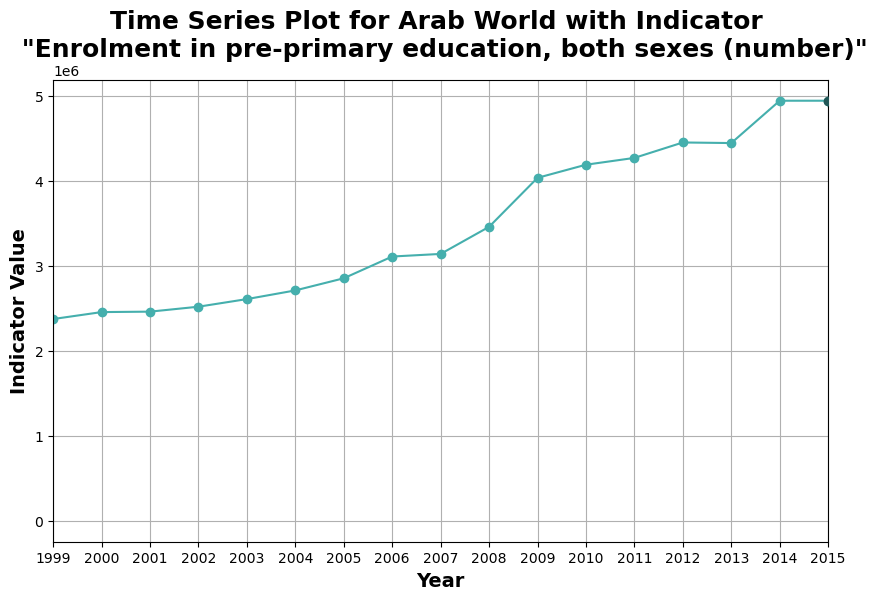

In [25]:
# ==================================================================================================
# TIME SERIES PLOT FOR SPECIFIC COUNTRY AND INDICATOR
# Just for checking if my imputation looks correct
# ==================================================================================================

index_row = 0
first_row = df_interpolated.iloc[index_row]

# Extracting the years and corresponding values
years = df_interpolated.columns[4:]  # Assuming the years start from the 5th column
values = first_row[4:]  # Assuming the values start from the 5th column

# Plotting the time series
plt.figure(figsize=(10, 6))
plt.plot(years, values, marker='o', linestyle='-',color=(69/255, 175/255, 173/255))
plt.scatter('2015', df_interpolated['2015'].iloc[[index_row]], color=(35/255, 87/255, 87/255), label='Specific Point', zorder=5)
plt.xlim('1999', '2015')  # Set x-axis limits explicitly
plt.title(f'Time Series Plot for {first_row[0]} with Indicator \n "{first_row[2]}"', fontweight='bold',fontsize=18)
plt.xlabel('Year', fontweight='bold',fontsize=14)
plt.ylabel('Indicator Value', fontweight='bold',fontsize=14)
plt.grid(True)
plt.show()

## III.3. SEARCH AND REMOVAL OF OUTLIERS <a class="anchor" id="section_4_3"></a>

In [26]:
# ==================================================================================================
# SEARCH OUTLIERS USING ZSCORE
# The Z-score measures how many standard deviations an observation is from the mean.
# An absolute Z-score greater than a threshold (e.g., 2 or 3) indicates that the observation is an outlier.
# ==================================================================================================

# Extracting the numeric columns for calculation
numeric_columns = df_interpolated.loc[:, '1999':'2015']

# Convert the data to numeric, coerce errors to NaN for non-numeric values
numeric_columns = numeric_columns.apply(pd.to_numeric, errors='coerce')

# Calculate Z-scores for each row
rows_z_scores = zscore(numeric_columns, axis=1)
rows_z_scores

,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,-1.21,-1.12,-1.12,-1.05,-0.95,-0.84,-0.68,-0.40,-0.36,-0.01,0.63,0.80,0.89,1.09,1.08,1.63,1.63
1,-1.47,-1.31,-1.24,-1.19,-1.02,-0.70,-0.47,-0.19,0.06,0.34,0.42,0.67,0.84,1.17,1.36,1.36,1.36
2,-1.26,-1.15,-1.16,-1.15,-1.04,-0.87,-0.61,-0.34,-0.05,0.48,0.14,0.50,0.97,1.28,1.41,1.41,1.41
3,-1.49,-1.33,-1.24,-1.21,-1.10,-0.73,-0.45,-0.12,0.15,0.43,0.47,0.69,0.84,1.17,1.30,1.30,1.30
4,-1.28,-1.22,-1.18,-1.18,-1.09,-0.88,-0.64,-0.31,0.02,0.45,0.50,0.65,0.85,1.33,1.33,1.33,1.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3307,-0.50,-0.79,-1.06,-1.26,-1.30,-1.15,-0.86,-0.54,-0.23,0.08,0.39,0.68,0.97,1.22,1.40,1.47,1.48
3308,-2.32,-1.73,-1.35,-0.97,-0.59,-0.23,0.13,0.28,0.40,0.54,0.69,0.84,0.84,0.84,0.85,0.87,0.91
3309,2.57,1.73,1.26,0.83,0.46,0.15,-0.09,-0.40,-0.61,-0.72,-0.75,-0.70,-0.74,-0.74,-0.73,-0.73,-0.80
3310,-2.42,-1.66,-1.26,-0.89,-0.55,-0.26,-0.01,0.25,0.43,0.54,0.60,0.63,0.74,0.83,0.92,1.00,1.11


In [27]:
# ==================================================================================================
# REMOVE OUTLIERS BASED ON ZSCORE
# If the number of outlier rows is relatively small compared to the overall dataset, their removal may 
# have a limited impact.
# ==================================================================================================

# Set your Z-score threshold (e.g., 3 or -3)
z_score_threshold = 3

# Identify outliers
outliers_mask = (rows_z_scores > z_score_threshold) | (rows_z_scores < -z_score_threshold)

# Calculate overall percentage of capped outliers
total_elements = df_interpolated.size
total_capped_outliers = outliers_mask.sum().sum()
percentage_capped_outliers = (total_capped_outliers / total_elements) * 100
print(f"Overall Percentage of Capped Outliers: {percentage_capped_outliers:.2f}%")

# Print a few rows with outliers
rows_with_outliers = df_interpolated[outliers_mask.any(axis=1)]
rows_with_outliers

Overall Percentage of Capped Outliers: 0.05%


,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,Missing_Value_Ratio
61,Euro area,EMU,Population growth (annual %),SP.POP.GROW,2.58e-01,3.28e-01,3.85e-01,4.89e-01,5.43e-01,5.51e-01,...,5.20e-01,4.90e-01,3.25e-01,2.36e-01,-2.16e-01,2.21e-01,3.36e-01,3.36e-01,3.22e-01,0.00
112,European Union,EUU,Population growth (annual %),SP.POP.GROW,2.08e-01,1.63e-01,2.43e-01,2.74e-01,3.74e-01,4.04e-01,...,3.72e-01,3.78e-01,2.96e-01,2.43e-01,2.77e-01,-7.72e-02,2.17e-01,2.17e-01,2.17e-01,9.52
705,Benin,BEN,Internet users (per 100 people),IT.NET.USER.P2,1.55e-01,2.25e-01,3.63e-01,7.03e-01,9.51e-01,1.18e+00,...,1.79e+00,1.85e+00,2.24e+00,3.13e+00,4.15e+00,4.50e+00,4.90e+00,6.00e+00,1.13e+01,0.00
847,Burundi,BDI,Internet users (per 100 people),IT.NET.USER.P2,3.92e-02,7.72e-02,1.06e-01,1.18e-01,2.01e-01,3.49e-01,...,7.00e-01,8.10e-01,9.00e-01,1.00e+00,1.11e+00,1.22e+00,1.26e+00,1.38e+00,4.87e+00,0.00
981,Colombia,COL,"Enrolment in pre-primary education, both sexes (number)",SE.PRE.ENRL,1.03e+06,1.07e+06,1.06e+06,1.07e+06,1.07e+06,1.07e+06,...,1.07e+06,1.31e+06,1.37e+06,1.30e+06,1.31e+06,1.31e+06,1.31e+06,1.31e+06,1.92e+06,19.05
1024,"Congo, Rep.",COG,"Gross enrolment ratio, primary, both sexes (%)",SE.PRM.ENRR,5.94e+01,8.83e+01,1.04e+02,1.06e+02,1.01e+02,1.13e+02,...,1.10e+02,1.07e+02,1.11e+02,1.13e+02,1.13e+02,1.11e+02,1.11e+02,1.11e+02,1.11e+02,14.29
1075,Croatia,HRV,Population growth (annual %),SP.POP.GROW,1.17e+00,-2.85e+00,3.16e-01,0.00e+00,0.00e+00,-2.25e-02,...,-9.01e-02,-3.36e-02,-1.23e-01,-2.55e-01,-2.55e-01,-3.06e-01,-2.79e-01,-4.07e-01,-8.24e-01,4.76
1161,Djibouti,DJI,Population growth (annual %),SP.POP.GROW,2.82e+00,2.47e+00,2.09e+00,1.83e+00,1.65e+00,1.59e+00,...,1.64e+00,1.66e+00,1.68e+00,1.70e+00,1.72e+00,1.75e+00,1.74e+00,1.71e+00,1.66e+00,0.00
1218,"Egypt, Arab Rep.",EGY,"Gross enrolment ratio, tertiary, both sexes (%)",SE.TER.ENRR,3.07e+01,3.07e+01,2.96e+01,3.05e+01,2.74e+01,2.85e+01,...,2.97e+01,2.94e+01,2.99e+01,3.09e+01,2.65e+01,2.76e+01,3.03e+01,3.17e+01,3.62e+01,4.76
1295,Ethiopia,ETH,Internet users (per 100 people),IT.NET.USER.P2,1.25e-02,1.53e-02,3.72e-02,7.24e-02,1.06e-01,1.55e-01,...,3.70e-01,4.50e-01,5.40e-01,7.50e-01,1.10e+00,2.90e+00,4.60e+00,7.70e+00,1.16e+01,0.00


## Insight:
It exist 39 rows which contains outliers considering a 3 STD (3 Sigmas). We can remove them. 

In [28]:
# ==================================================================================================
# REMOVE OUTLIERS FROM df_interpolated
# ==================================================================================================

# Replace outliers with NaN in df_interpolated
# df_interpolated[outliers_mask] = pd.NA

# Alternatively, if you want to drop the entire row with outliers
df_interpolated = df_interpolated[~outliers_mask.any(axis=1)]
df_interpolated = df_interpolated.reset_index(drop=True)

# Print the resulting DataFrame
df_interpolated

,Country Name,Country Code,Indicator Name,Indicator Code,1999,2000,2001,2002,2003,2004,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,Missing_Value_Ratio
0,Arab World,ARB,"Enrolment in pre-primary education, both sexes (number)",SE.PRE.ENRL,2.37e+06,2.45e+06,2.46e+06,2.52e+06,2.61e+06,2.71e+06,...,3.14e+06,3.46e+06,4.03e+06,4.19e+06,4.27e+06,4.45e+06,4.44e+06,4.94e+06,4.94e+06,4.76
1,Arab World,ARB,GDP at market prices (constant 2005 US$),NY.GDP.MKTP.KD,8.82e+11,9.27e+11,9.48e+11,9.65e+11,1.02e+12,1.11e+12,...,1.33e+12,1.42e+12,1.44e+12,1.52e+12,1.57e+12,1.66e+12,1.72e+12,1.72e+12,1.72e+12,9.52
2,Arab World,ARB,GDP at market prices (current US$),NY.GDP.MKTP.CD,6.34e+11,7.26e+11,7.13e+11,7.24e+11,8.16e+11,9.59e+11,...,1.64e+12,2.08e+12,1.79e+12,2.10e+12,2.49e+12,2.74e+12,2.85e+12,2.85e+12,2.85e+12,9.52
3,Arab World,ARB,"GDP per capita, PPP (current international $)",NY.GDP.PCAP.PP.CD,8.65e+03,9.09e+03,9.33e+03,9.39e+03,9.70e+03,1.07e+04,...,1.30e+04,1.37e+04,1.39e+04,1.44e+04,1.48e+04,1.57e+04,1.61e+04,1.61e+04,1.61e+04,9.52
4,Arab World,ARB,"GNI per capita, Atlas method (current US$)",NY.GNP.PCAP.CD,2.29e+03,2.39e+03,2.47e+03,2.47e+03,2.64e+03,3.04e+03,...,4.73e+03,5.55e+03,5.64e+03,5.91e+03,6.31e+03,7.20e+03,7.20e+03,7.20e+03,7.20e+03,14.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3268,Zimbabwe,ZWE,Population growth (annual %),SP.POP.GROW,1.43e+00,1.30e+00,1.17e+00,1.08e+00,1.06e+00,1.13e+00,...,1.55e+00,1.70e+00,1.84e+00,1.98e+00,2.11e+00,2.23e+00,2.31e+00,2.34e+00,2.35e+00,0.00
3269,Zimbabwe,ZWE,"Population of the official age for tertiary education, both sexes (number)",SP.TER.TOTL.IN,1.34e+06,1.39e+06,1.42e+06,1.45e+06,1.48e+06,1.51e+06,...,1.57e+06,1.58e+06,1.59e+06,1.60e+06,1.60e+06,1.60e+06,1.60e+06,1.60e+06,1.61e+06,0.00
3270,Zimbabwe,ZWE,"Population, ages 0-14 (% of total)",SP.POP.0014.TO.ZS,4.32e+01,4.28e+01,4.25e+01,4.23e+01,4.21e+01,4.20e+01,...,4.16e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,0.00
3271,Zimbabwe,ZWE,"Population, ages 15-64 (% of total)",SP.POP.1564.TO.ZS,5.37e+01,5.41e+01,5.43e+01,5.46e+01,5.47e+01,5.49e+01,...,5.53e+01,5.54e+01,5.54e+01,5.54e+01,5.55e+01,5.55e+01,5.56e+01,5.56e+01,5.57e+01,0.00


In [29]:
# # ==================================================================================================
# # SAVE DATA INTO EXCEL (df_interpolated.xlsx)
# # ==================================================================================================

# # Specify the file path where you want to save the Excel file
# excel_file_path = r'C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET2_Analyser_des_donnees_de_systemes_educatifs\DATA\df_interpolated.xlsx'

# # Write the DataFrame to Excel
# df_interpolated.to_excel(excel_file_path, index=False)

# # Print a message indicating the successful save
# print(f"Filtered data has been successfully saved to: {excel_file_path}")

## III.4. Reshape the Data <a class="anchor" id="section_4_4"></a>

In [30]:
# Check the total number of NaN values in df_interpolated
df_interpolated.isna().sum().sum()

0

In [31]:
# ==================================================================================================
# RESHAPE DATA (PIVOT)
# ==================================================================================================
"""
The output df_pivoted_allYears is a dictionary where each key represents a specific year, and the corresponding value is a DataFrame. 
Here's what each key and value in the dictionary represent:
    Key: Year (e.g., '1970', '1971', ..., '2100')
    Value: DataFrame
Each DataFrame in the dictionary represents a reshaped version of the original data for a particular year. The reshaping is done using 
the pivot operation in pandas, where the rows are indexed by 'Country Code', columns are created for each unique 'Indicator Code', and 
the values are taken from the specified year.
"""

# Drop the 'Indicator Name', 'Country Name', and 'Missing_Value_Ratio' columns from the original DataFrame
df_interpolated = df_interpolated.drop(columns=['Indicator Name', 'Missing_Value_Ratio'])
df_interpolated

,Country Name,Country Code,Indicator Code,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Arab World,ARB,SE.PRE.ENRL,2.37e+06,2.45e+06,2.46e+06,2.52e+06,2.61e+06,2.71e+06,2.85e+06,3.11e+06,3.14e+06,3.46e+06,4.03e+06,4.19e+06,4.27e+06,4.45e+06,4.44e+06,4.94e+06,4.94e+06
1,Arab World,ARB,NY.GDP.MKTP.KD,8.82e+11,9.27e+11,9.48e+11,9.65e+11,1.02e+12,1.11e+12,1.18e+12,1.26e+12,1.33e+12,1.42e+12,1.44e+12,1.52e+12,1.57e+12,1.66e+12,1.72e+12,1.72e+12,1.72e+12
2,Arab World,ARB,NY.GDP.MKTP.CD,6.34e+11,7.26e+11,7.13e+11,7.24e+11,8.16e+11,9.59e+11,1.18e+12,1.40e+12,1.64e+12,2.08e+12,1.79e+12,2.10e+12,2.49e+12,2.74e+12,2.85e+12,2.85e+12,2.85e+12
3,Arab World,ARB,NY.GDP.PCAP.PP.CD,8.65e+03,9.09e+03,9.33e+03,9.39e+03,9.70e+03,1.07e+04,1.14e+04,1.23e+04,1.30e+04,1.37e+04,1.39e+04,1.44e+04,1.48e+04,1.57e+04,1.61e+04,1.61e+04,1.61e+04
4,Arab World,ARB,NY.GNP.PCAP.CD,2.29e+03,2.39e+03,2.47e+03,2.47e+03,2.64e+03,3.04e+03,3.50e+03,4.11e+03,4.73e+03,5.55e+03,5.64e+03,5.91e+03,6.31e+03,7.20e+03,7.20e+03,7.20e+03,7.20e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3268,Zimbabwe,ZWE,SP.POP.GROW,1.43e+00,1.30e+00,1.17e+00,1.08e+00,1.06e+00,1.13e+00,1.26e+00,1.41e+00,1.55e+00,1.70e+00,1.84e+00,1.98e+00,2.11e+00,2.23e+00,2.31e+00,2.34e+00,2.35e+00
3269,Zimbabwe,ZWE,SP.TER.TOTL.IN,1.34e+06,1.39e+06,1.42e+06,1.45e+06,1.48e+06,1.51e+06,1.54e+06,1.55e+06,1.57e+06,1.58e+06,1.59e+06,1.60e+06,1.60e+06,1.60e+06,1.60e+06,1.60e+06,1.61e+06
3270,Zimbabwe,ZWE,SP.POP.0014.TO.ZS,4.32e+01,4.28e+01,4.25e+01,4.23e+01,4.21e+01,4.20e+01,4.18e+01,4.17e+01,4.16e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01,4.15e+01
3271,Zimbabwe,ZWE,SP.POP.1564.TO.ZS,5.37e+01,5.41e+01,5.43e+01,5.46e+01,5.47e+01,5.49e+01,5.51e+01,5.52e+01,5.53e+01,5.54e+01,5.54e+01,5.54e+01,5.55e+01,5.55e+01,5.56e+01,5.56e+01,5.57e+01


In [32]:
# ==================================================================================================
# CREATE 3 TYPES OF DATASETS: INCOME, REGIONS, COUNTRIES
# ==================================================================================================

# List of Country Codes for different types of datasets
list_of_Income_Country_Code  = ['LIC', 'LMC', 'LMY', 'MIC', 'UMC', 'HIC']
list_of_Regions_Country_Code = ['ARB', 'EAP', 'EAS', 'ECA', 'ECS', 'EMU', 'EUU', 'HPC', 'LAC', 'LCN', 'LDC', 'MEA', 'MNA', 'NAC', 'OED', 
                                'PSE', 'SAS', 'SSA', 'SSF', 'ZAF']

# Create datasets based on Country Code categories
df_interpolated_INCOME    = df_interpolated[df_interpolated['Country Code'].isin(list_of_Income_Country_Code)]
df_interpolated_REGIONS   = df_interpolated[df_interpolated['Country Code'].isin(list_of_Regions_Country_Code)]
df_interpolated_COUNTRIES = df_interpolated[~df_interpolated['Country Code'].isin(list_of_Income_Country_Code + list_of_Regions_Country_Code + ['WLD'])]

# Display the dataset for INCOME category
df_interpolated_INCOME

,Country Name,Country Code,Indicator Code,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
134,High income,HIC,SE.PRE.ENRL,2.65e+07,2.64e+07,2.69e+07,2.69e+07,2.64e+07,2.62e+07,2.75e+07,2.77e+07,2.79e+07,2.82e+07,2.85e+07,2.94e+07,3.00e+07,3.05e+07,3.07e+07,3.12e+07,3.11e+07
135,High income,HIC,NY.GDP.MKTP.KD,3.69e+13,3.84e+13,3.90e+13,3.96e+13,4.04e+13,4.18e+13,4.29e+13,4.42e+13,4.53e+13,4.55e+13,4.39e+13,4.52e+13,4.60e+13,4.66e+13,4.73e+13,4.82e+13,4.93e+13
136,High income,HIC,NY.GDP.MKTP.CD,2.70e+13,2.76e+13,2.73e+13,2.85e+13,3.19e+13,3.55e+13,3.76e+13,3.97e+13,4.33e+13,4.60e+13,4.31e+13,4.52e+13,4.88e+13,4.88e+13,4.93e+13,5.04e+13,4.76e+13
137,High income,HIC,NY.GDP.PCAP.PP.CD,2.62e+04,2.79e+04,2.88e+04,2.97e+04,3.07e+04,3.25e+04,3.40e+04,3.62e+04,3.79e+04,3.88e+04,3.78e+04,3.92e+04,4.08e+04,4.19e+04,4.33e+04,4.46e+04,4.59e+04
138,High income,HIC,NY.GNP.PCAP.CD,2.49e+04,2.59e+04,2.59e+04,2.57e+04,2.77e+04,3.16e+04,3.48e+04,3.66e+04,3.80e+04,3.96e+04,3.89e+04,3.99e+04,4.12e+04,4.25e+04,4.33e+04,4.34e+04,4.21e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
401,Upper middle income,UMC,SP.POP.0014.TO.ZS,2.73e+01,2.66e+01,2.60e+01,2.52e+01,2.43e+01,2.35e+01,2.28e+01,2.23e+01,2.19e+01,2.15e+01,2.12e+01,2.10e+01,2.09e+01,2.08e+01,2.07e+01,2.07e+01,2.06e+01
402,Upper middle income,UMC,SP.POP.1564.TO.ZS,6.59e+01,6.65e+01,6.70e+01,6.76e+01,6.83e+01,6.90e+01,6.96e+01,7.00e+01,7.03e+01,7.06e+01,7.08e+01,7.09e+01,7.09e+01,7.09e+01,7.07e+01,7.05e+01,7.03e+01
403,Upper middle income,UMC,SP.POP.TOTL,2.26e+09,2.28e+09,2.30e+09,2.32e+09,2.34e+09,2.36e+09,2.38e+09,2.39e+09,2.41e+09,2.43e+09,2.45e+09,2.46e+09,2.48e+09,2.50e+09,2.52e+09,2.54e+09,2.56e+09
404,Upper middle income,UMC,SE.PRM.ENRL.TC.ZS,2.43e+01,2.35e+01,2.27e+01,2.22e+01,2.17e+01,2.10e+01,2.02e+01,2.00e+01,1.97e+01,1.94e+01,1.92e+01,1.90e+01,1.89e+01,1.88e+01,1.89e+01,1.85e+01,1.86e+01


In [33]:
# ==================================================================================================
# PIVOT YEARS DATA
# ==================================================================================================

def pivot_years_data(df):
    # List of column names for the years you want
    years_column = ['1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011',
                    '2012', '2013', '2014', '2015']

    # Dictionary to store DataFrames for each year
    df_pivoted_allYears = {}

    # Iterate over years_column and save each DataFrame
    for year in years_column:
        # Pivot the DataFrame for the current year
        df_pivoted = df.pivot(index='Country Name', columns='Indicator Code', values=year)

        # Store the DataFrame in the dictionary
        df_pivoted_allYears[year] = df_pivoted

    return df_pivoted_allYears

# Pivot data for INCOME, REGIONS, and COUNTRIES datasets
df_pivoted_allYears_INCOME = pivot_years_data(df_interpolated_INCOME)
df_pivoted_allYears_REGIONS = pivot_years_data(df_interpolated_REGIONS)
df_pivoted_allYears_COUNTRIES = pivot_years_data(df_interpolated_COUNTRIES)


In [34]:
# Check the pivoted DataFrame for the year 2000 in the INCOME dataset
df_pivoted_allYears_INCOME['2000']

Indicator Code,IT.NET.USER.P2,NY.GDP.MKTP.CD,NY.GDP.MKTP.KD,NY.GDP.PCAP.PP.CD,NY.GNP.PCAP.CD,SE.PRE.ENRL,SE.PRM.ENRL.TC.ZS,SE.PRM.ENRR,SE.SEC.ENRR,SE.TER.ENRR,SH.DYN.MORT,SP.POP.0014.TO.ZS,SP.POP.1564.TO.ZS,SP.POP.GROW,SP.POP.TOTL,SP.TER.TOTL.IN,UIS.SLE.0
Country Name,,,,,,,,,,,,,,,,,
High income,30.69,2.76e+13,3.84e+13,27886.04,25940.63,2.64e+07,15.91,101.93,99.33,55.99,7.8,19.26,67.06,0.63,1.07e+09,7.13e+07,2.02
Low & middle income,1.45,5.97e+12,1.16e+13,3697.20,1135.65,7.37e+07,28.95,98.02,54.75,13.21,84.8,32.41,62.14,1.47,5.05e+09,4.53e+08,0.67
Low income,0.11,1.13e+11,1.80e+11,861.38,231.58,4.24e+06,45.09,74.29,22.60,3.32,151.3,44.64,52.20,2.75,4.25e+08,3.77e+07,0.25
Lower middle income,0.56,1.34e+12,2.55e+12,2555.53,547.92,2.26e+07,33.71,95.37,46.84,11.32,93.9,35.85,59.67,1.79,2.34e+09,2.22e+08,0.39
Middle income,1.57,5.86e+12,1.14e+13,3959.64,1219.10,7.03e+07,27.89,101.19,57.78,14.11,72.9,31.29,63.05,1.36,4.62e+09,4.15e+08,0.73
Upper middle income,2.53,4.52e+12,8.84e+12,5405.33,1905.94,4.77e+07,23.51,108.33,71.38,17.31,34.9,26.63,66.50,0.92,2.28e+09,1.93e+08,1.23


In [35]:
# # ==================================================================================================
# # SAVE DATA INTO EXCEL (df_pivoted_allYears_COUNTRIES.xlsx)
# # ==================================================================================================

# # Specify the file path where you want to save the Excel file
# excel_file_path = r'C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET2_Analyser_des_donnees_de_systemes_educatifs\DATA\df_pivoted_COUNTRIES_1999.xlsx'

# # Write the DataFrame to Excel
# df_pivoted_allYears_COUNTRIES['1999'].to_excel(excel_file_path, index=True)

# # Print a message indicating the successful save
# print(f"Filtered data has been successfully saved to: {excel_file_path}")

# STEP IV. DATA ANALYSIS <a class="anchor" id="chapter5"></a>

In [36]:
# ==================================================================================================
# MINIMUM AND MAXIMUM VALUES FOR SELECTED INDICATORS ACROSS INCOME GROUPS
# ==================================================================================================

data_INCOME = {
    'INDICATOR': ['IT.NET.USER.P2', 'NY.GDP.MKTP.CD', 'NY.GDP.MKTP.KD', 'NY.GDP.PCAP.PP.CD', 'NY.GNP.PCAP.CD',
                  'SE.PRE.ENRL', 'SE.PRM.ENRL.TC.ZS', 'SE.PRM.ENRR', 'SE.SEC.ENRR', 'SE.TER.ENRR',
                  'SH.DYN.MORT', 'SP.POP.0014.TO.ZS', 'SP.POP.1564.TO.ZS', 'SP.POP.GROW', 'SP.POP.TOTL',
                  'SP.TER.TOTL.IN', 'UIS.SLE.0'],
    'MIN': [0.072117145087942,97617718260.914,176588403095.659,845.623211468081,229.274206108922,4043827.75,18.5316696166992,
            71.7295074462891,22.0035095214844,3.06710004806519,14.8,20.6319562959664,52.1351392006307,0.720297377664878,413745647,
            36423512,0.247029975056648],
    'MAX': [100,28704762101253.9,26348161679734,16098.9148813948,8645.65683411771,123853088,48.5330085754395,112.166717529297,94.2282333374023,46.9158592224121,156.7,44.7047816312132,70.9146864648043,2.83194226463381,6172290591.68203,545082624,1.98272299766541],
    'INDICATOR NAME': ['Internet users (per 100 people)', 'GDP (current US$)', 'GDP (constant 2010 US$)',
                       'GDP per capita, PPP (current international $)', 'GNI per capita, Atlas method (current US$)',
                       'Enrolment in pre-primary education, both sexes (number)',
                       'Pupil-teacher ratio in primary education (headcount basis)',
                       'Gross enrolment ratio, primary, both sexes (%)',
                       'Gross enrolment ratio, secondary, both sexes (%)',
                       'Gross enrolment ratio, tertiary, both sexes (%)',
                       'Mortality rate, under-5 (per 1,000 live births)',
                       'Population ages 0-14 (% of total)', 'Population ages 15-64 (% of total)',
                       'Population growth (annual %)', 'Population, total',
                       'Population of the official age for tertiary education, both sexes (number)',
                       'School life expectancy, pre-primary, both sexes (years)']
}

data_REGIONS = {
    'INDICATOR': ['IT.NET.USER.P2', 'NY.GDP.MKTP.CD', 'NY.GDP.MKTP.KD', 'NY.GDP.PCAP.PP.CD', 'NY.GNP.PCAP.CD',
                  'SE.PRE.ENRL', 'SE.PRM.ENRL.TC.ZS', 'SE.PRM.ENRR', 'SE.SEC.ENRR', 'SE.TER.ENRR',
                  'SH.DYN.MORT', 'SP.POP.0014.TO.ZS', 'SP.POP.1564.TO.ZS', 'SP.POP.GROW', 'SP.POP.TOTL',
                  'SP.TER.TOTL.IN', 'UIS.SLE.0'],
    'MIN': [0.0571449255602971,3555800000,5009697076.26219,1087.60257335654,276.446750139669,61874,13.0495796203613,69.992057800293,21.2157001495361,3.1298999786377,4.65598762669667,15.5511717376755,49.6256263072782,-0.0785761831733254,2848431,286866,0.200870007276535],
    'MAX': [75.94103574213,47976933999788.8,40545113075950.4,55236.8380392583,55359.1726692542,58800316,46.9794311523438,122.878227233887,112.793739318848,92.7011032104492,159.7,48.1444825326475,71.4520491506851,3.00626405051232,2281203360,199599664,2.88909006118774],
    'INDICATOR NAME': ['Internet users (per 100 people)', 'GDP (current US$)', 'GDP (constant 2010 US$)',
                       'GDP per capita, PPP (current international $)', 'GNI per capita, Atlas method (current US$)',
                       'Enrolment in pre-primary education, both sexes (number)',
                       'Pupil-teacher ratio in primary education (headcount basis)',
                       'Gross enrolment ratio, primary, both sexes (%)',
                       'Gross enrolment ratio, secondary, both sexes (%)',
                       'Gross enrolment ratio, tertiary, both sexes (%)',
                       'Mortality rate, under-5 (per 1,000 live births)',
                       'Population ages 0-14 (% of total)', 'Population ages 15-64 (% of total)',
                       'Population growth (annual %)', 'Population, total',
                       'Population of the official age for tertiary education, both sexes (number)',
                       'School life expectancy, pre-primary, both sexes (years)']
}

data_COUNTRIES = {
    'INDICATOR': ['IT.NET.USER.P2', 'NY.GDP.MKTP.CD', 'NY.GDP.MKTP.KD', 'NY.GDP.PCAP.PP.CD', 'NY.GNP.PCAP.CD',
                  'SE.PRE.ENRL', 'SE.PRM.ENRL.TC.ZS', 'SE.PRM.ENRR', 'SE.SEC.ENRR', 'SE.TER.ENRR',
                  'SH.DYN.MORT', 'SP.POP.0014.TO.ZS', 'SP.POP.1564.TO.ZS', 'SP.POP.GROW', 'SP.POP.TOTL',
                  'SP.TER.TOTL.IN', 'UIS.SLE.0'],
    'MIN': [0,13196544.946726,29009173.7113651,408.574400444067,80,1608,8.14087963104248,22.2023792266846,5.13231992721558,0.251850008964539,2.2,11.0606161903093,47.2444408537421,-4.07538613162288,9345,868,0.0219199992716312],
    'MAX': [98.32360965,50362403986688.1,49304844600735,140037.115597332,104860,40507144,82.79541015625,165.645385742188,166.808471679688,119.778747558594,239,50.3893383141714,85.8724018472958,16.3316379027378,1371220000,130111424,4.70988988876343],
    'INDICATOR NAME': ['Internet users (per 100 people)', 'GDP (current US$)', 'GDP (constant 2010 US$)',
                       'GDP per capita, PPP (current international $)', 'GNI per capita, Atlas method (current US$)',
                       'Enrolment in pre-primary education, both sexes (number)',
                       'Pupil-teacher ratio in primary education (headcount basis)',
                       'Gross enrolment ratio, primary, both sexes (%)',
                       'Gross enrolment ratio, secondary, both sexes (%)',
                       'Gross enrolment ratio, tertiary, both sexes (%)',
                       'Mortality rate, under-5 (per 1,000 live births)',
                       'Population ages 0-14 (% of total)', 'Population ages 15-64 (% of total)',
                       'Population growth (annual %)', 'Population, total',
                       'Population of the official age for tertiary education, both sexes (number)',
                       'School life expectancy, pre-primary, both sexes (years)']
}

df_min_max_indicator_INCOME = pd.DataFrame(data_INCOME)
df_min_max_indicator_REGIONS = pd.DataFrame(data_REGIONS)
df_min_max_indicator_COUNTRIES = pd.DataFrame(data_COUNTRIES)


df_min_max_indicator_INCOME



,INDICATOR,MIN,MAX,INDICATOR NAME
0,IT.NET.USER.P2,7.21e-02,1.00e+02,Internet users (per 100 people)
1,NY.GDP.MKTP.CD,9.76e+10,2.87e+13,GDP (current US$)
2,NY.GDP.MKTP.KD,1.77e+11,2.63e+13,GDP (constant 2010 US$)
3,NY.GDP.PCAP.PP.CD,8.46e+02,1.61e+04,"GDP per capita, PPP (current international $)"
4,NY.GNP.PCAP.CD,2.29e+02,8.65e+03,"GNI per capita, Atlas method (current US$)"
5,SE.PRE.ENRL,4.04e+06,1.24e+08,"Enrolment in pre-primary education, both sexes (number)"
6,SE.PRM.ENRL.TC.ZS,1.85e+01,4.85e+01,Pupil-teacher ratio in primary education (headcount basis)
7,SE.PRM.ENRR,7.17e+01,1.12e+02,"Gross enrolment ratio, primary, both sexes (%)"
8,SE.SEC.ENRR,2.20e+01,9.42e+01,"Gross enrolment ratio, secondary, both sexes (%)"
9,SE.TER.ENRR,3.07e+00,4.69e+01,"Gross enrolment ratio, tertiary, both sexes (%)"


## IV.1. Univariate Analysis <a class="anchor" id="section_5_1"></a>

In [37]:
# # ==================================================================================================
# # CREATE BAR PLOTS FOR TOP N COUNTRIES OVER THE YEARS (1999-2015) FOR A SPECIFIC INDICATOR
# # ==================================================================================================

# def create_bar_plot(df_pivoted_allYears, N_max, current_Indicator, y_axis_min, y_axis_max):
#     """
#     Generate bar plots for the top N_max countries for a specific indicator over the years from 1999 to 2015.

#     Parameters:
#     - df_pivoted_allYears (DataFrame): DataFrame containing indicator values for each country and year.
#     - N_max (int): Maximum number of countries to display.
#     - current_Indicator (str): Indicator code for which the plots are generated.
#     - y_axis_min (float): Minimum value for the y-axis.
#     - y_axis_max (float): Maximum value for the y-axis.
#     """

#     # top_countries_by_year
#     top_countries_by_year = {}
#     for year in range(1999, 2016):
#         top_countries_by_year[year] = df_pivoted_allYears[str(year)][current_Indicator].nlargest(N_max).index.tolist()

#     # Flatten the list of top countries
#     all_top_countries = [country for countries in top_countries_by_year.values() for country in countries]

#     # Use Counter to count occurrences
#     country_counter = Counter(all_top_countries)

#     # Get the top N_max most represented countries
#     most_represented_countries = country_counter.most_common(N_max)

#     # Extract only the country codes from the result
#     most_represented_country_codes = [country[0] for country in most_represented_countries]

#     # Create a parameter for years from 1999 to 2015
#     selected_years = [str(year) for year in range(1999, 2016)]

#     # Concatenate DataFrames for selected years into a single DataFrame
#     combined_df = pd.DataFrame(index=most_represented_country_codes, columns=selected_years)

#     min_combined_df = min(combined_df)
#     # Populate the DataFrame with the indicator values for each country and year
#     for year in selected_years:
#         combined_df[year] = df_pivoted_allYears[year][current_Indicator].loc[most_represented_country_codes].values

#     # Plot the bar plot with adjusted parameters
#     fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), sharex=False, sharey=False)

#     # Flatten the 2D array of axes to simplify indexing
#     axes = axes.flatten()

#     # Define custom colors for each subplot
#     colors = sns.color_palette("husl", N_max)

#     # Plot each subplot with custom colors
#     for i, (country, data) in enumerate(combined_df.iterrows()):
#         data.plot(kind='bar', ax=axes[i], rot=0, legend=False, color=colors[i])
#         # axes[i].set_title(country)
#         axes[i].set_title(f"Top {i+1} - {country} ")
#         axes[i].grid(True)  # Add grid
#         axes[i].set_ylim(y_axis_min, y_axis_max)  # Set the y-axis limits
#         axes[i].xaxis.set_major_locator(plt.MaxNLocator(5))  # Adjust the number of x-axis ticks

#     # Add a general title for all subplots
#     indicator_name = df_min_max_indicator_INCOME.loc[df_min_max_indicator_INCOME['INDICATOR'] == current_Indicator, 'INDICATOR NAME'].iloc[0] if current_Indicator in df_min_max_indicator_INCOME['INDICATOR'].values else None
#     plt.suptitle(f"Top {N_max} Countries for {current_Indicator} (Year by Year) \n {indicator_name} \n", fontsize=16)

#     # Adjust layout to prevent overlapping
#     plt.tight_layout()

#     # Show the plot
#     plt.show()


# N_max = 5
# current_dataset = df_pivoted_allYears_INCOME
# df_min_max_indicator = df_min_max_indicator_INCOME
# current_Indicator = 'IT.NET.USER.P2'

# # Extract min and max values from the indicator DataFrame
# min_value = df_min_max_indicator.loc[df_min_max_indicator['INDICATOR'] == current_Indicator, 'MIN'].values[0]
# max_value = df_min_max_indicator.loc[df_min_max_indicator['INDICATOR'] == current_Indicator, 'MAX'].values[0]

# # Create bar plot
# create_bar_plot(current_dataset, N_max, current_Indicator, min_value, max_value) #

In [38]:
# N_max = 5
# current_dataset = df_pivoted_allYears_INCOME
# df_min_max_indicator = df_min_max_indicator_INCOME
# current_Indicator = 'IT.NET.USER.P2'

# # Extract min and max values from the indicator DataFrame
# min_value = df_min_max_indicator.loc[df_min_max_indicator['INDICATOR'] == current_Indicator, 'MIN'].values[0]
# max_value = df_min_max_indicator.loc[df_min_max_indicator['INDICATOR'] == current_Indicator, 'MAX'].values[0]

# # Create bar plot
# create_bar_plot(current_dataset, N_max, current_Indicator, min_value, max_value) #

### IV.1.1. Analysis for the INCOME Group 

In [39]:
# ==================================================================================================
# CREATE LINE PLOT FOR TOP N COUNTRIES OVERALL (1999-2015) FOR A SPECIFIC INDICATOR
# ==================================================================================================

def create_line_plot(df_pivoted_allYears, N_max, current_Indicator, list_of_X_Country_Code):
    """
    Generate a line plot for the top N_max countries overall for a specific indicator over the years from 1999 to 2015.

    Parameters:
    - df_pivoted_allYears (DataFrame): DataFrame containing indicator values for each country and year.
    - N_max (int): Maximum number of countries to display.
    - current_Indicator (str): Indicator code for which the plot is generated.
    - list_of_X_Country_Code (list): List of country codes for which individual lines will be plotted (NEEDED FOR THE COLOR MAPPING).
    """
    
    # top_countries_by_year
    top_countries_by_year = {}
    for year in range(1999, 2016):
        top_countries_by_year[year] = df_pivoted_allYears[str(year)][current_Indicator].nlargest(N_max).index.tolist()

    # Flatten the list of top countries
    all_top_countries = [country for countries in top_countries_by_year.values() for country in countries]

    # Use Counter to count occurrences
    country_counter = Counter(all_top_countries)

    # Get the overall top N_max most represented countries based on the sum across all years
    overall_top_countries = country_counter.most_common(N_max)

    # Extract only the country codes from the result
    overall_top_country_codes = [country[0] for country in overall_top_countries]

    # Create a parameter for years from 1999 to 2015
    selected_years = [str(year) for year in range(1999, 2016)]

    # Use the combined_df created in the bar plot function
    combined_df = pd.DataFrame(index=overall_top_country_codes, columns=selected_years)

    # Populate the DataFrame with the indicator values for each country and year
    for year in selected_years:
        combined_df[year] = df_pivoted_allYears[year][current_Indicator].loc[overall_top_country_codes].values

    # Create a single line graph with multiple lines, each representing a country
    fig, ax = plt.subplots(figsize=(12, 8))

    # Define custom colors for each country
    colors = sns.color_palette("husl", len(list_of_X_Country_Code))

        # Create a dictionary to map countries to colors
    country_color_map = dict(zip(list_of_X_Country_Code, colors))

    # Plot each country in a single line
    for i, country_code in enumerate(overall_top_country_codes):
        country_data = combined_df.loc[country_code]
        country_color = country_color_map.get(country_code, 'black')  # Default to black if not in the list
        country_data.plot(label=f"{country_code}", color=country_color, marker='D', markersize=8, linestyle='-', linewidth=2)



    # Add labels, title, legend, and other plot customizations
    indicator_name = df_min_max_indicator_INCOME.loc[df_min_max_indicator_INCOME['INDICATOR'] == current_Indicator, 'INDICATOR NAME'].iloc[0] if current_Indicator in df_min_max_indicator_INCOME['INDICATOR'].values else None
    ax.set_title(f"Top {N_max} Countries for {current_Indicator} (Overall) \n {indicator_name} \n", fontweight='bold',fontsize=18)
    ax.set_ylabel(f"{current_Indicator} Value", fontweight='bold',fontsize=14)
    ax.set_xlabel("Year", fontweight='bold',fontsize=14)
    ax.grid(True)
    ax.legend(loc="upper left")

    # Show the plot
    plt.show()

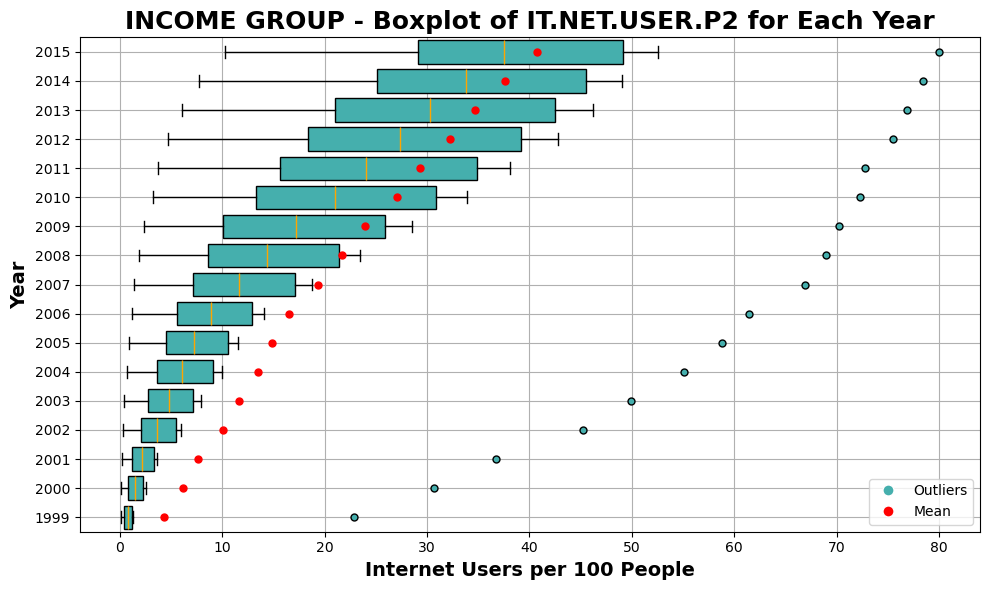

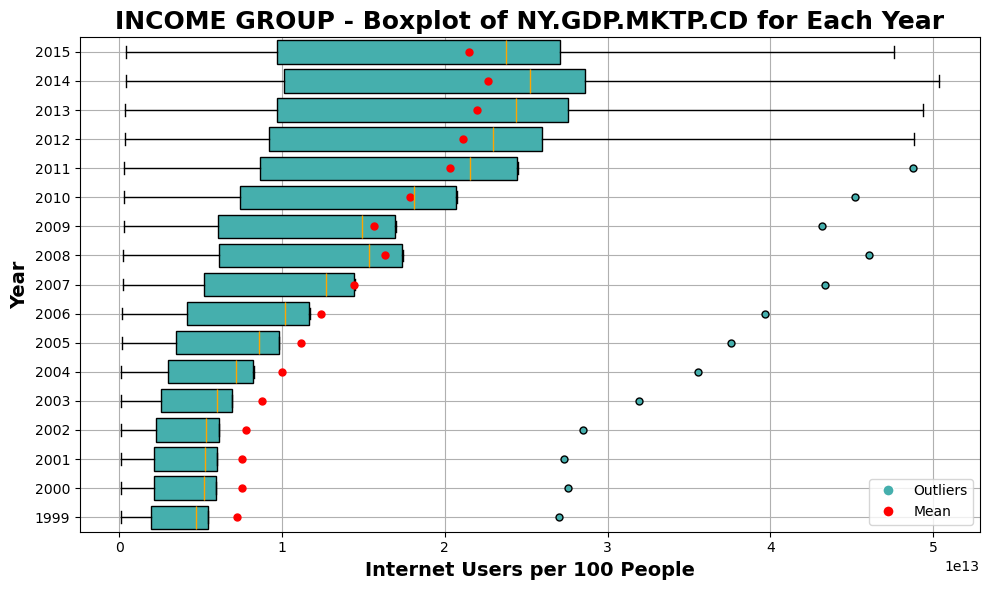

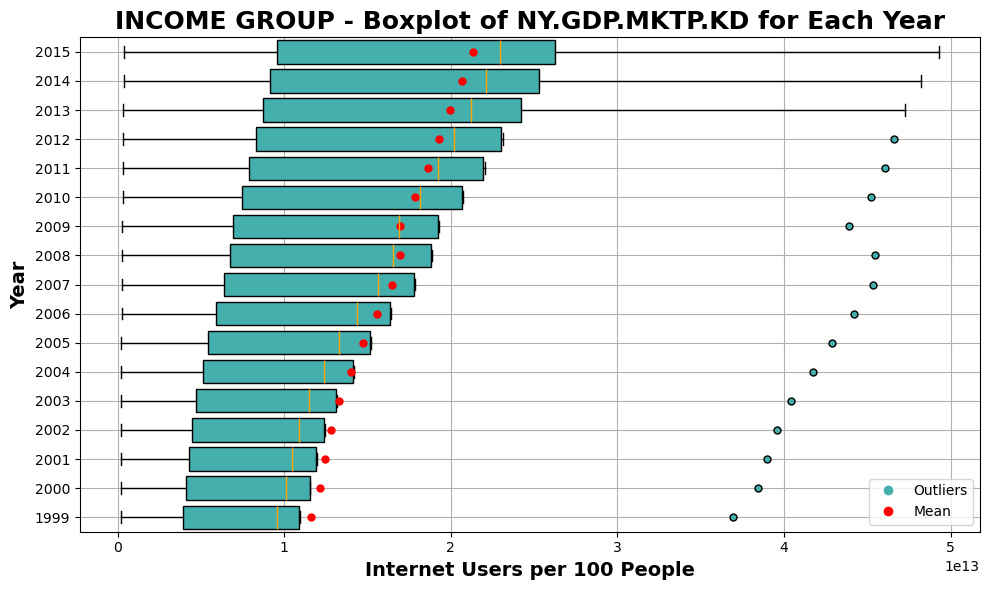

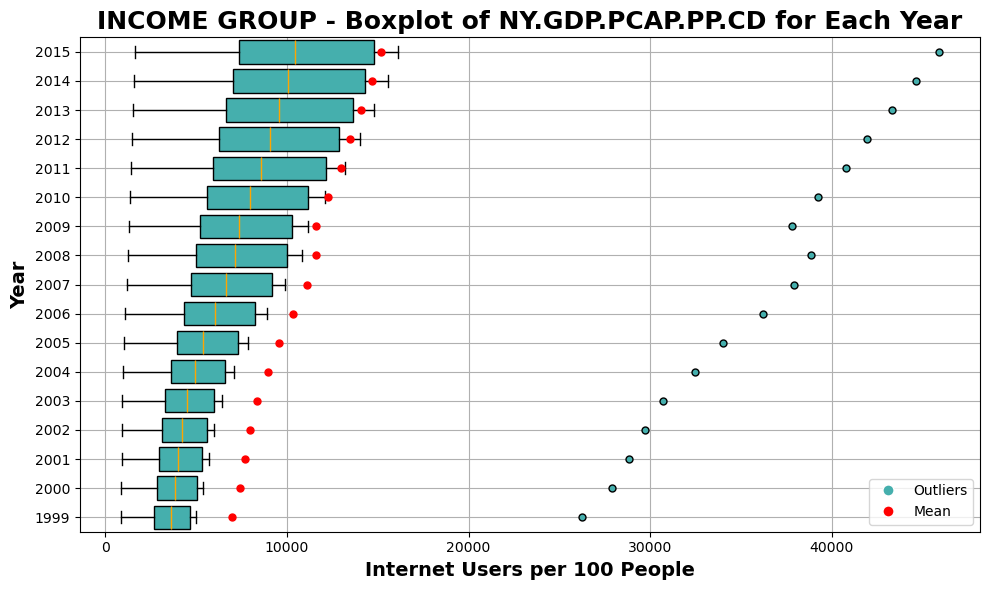

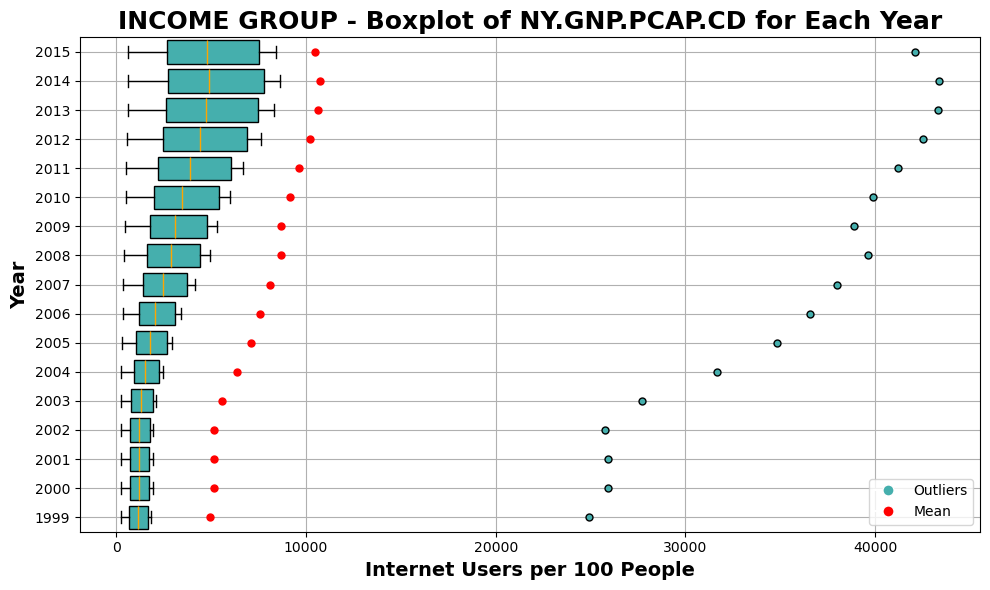

...

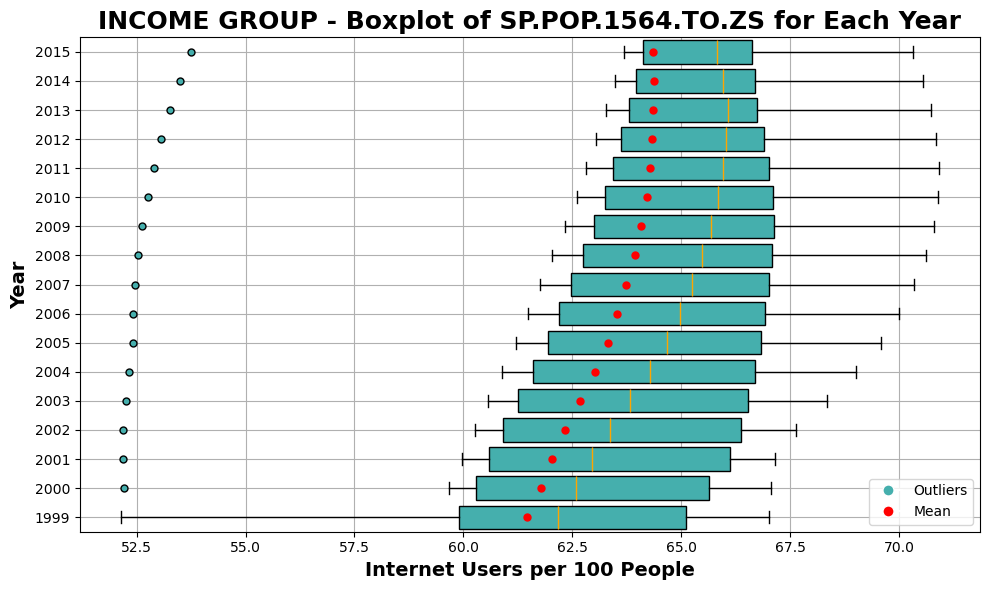

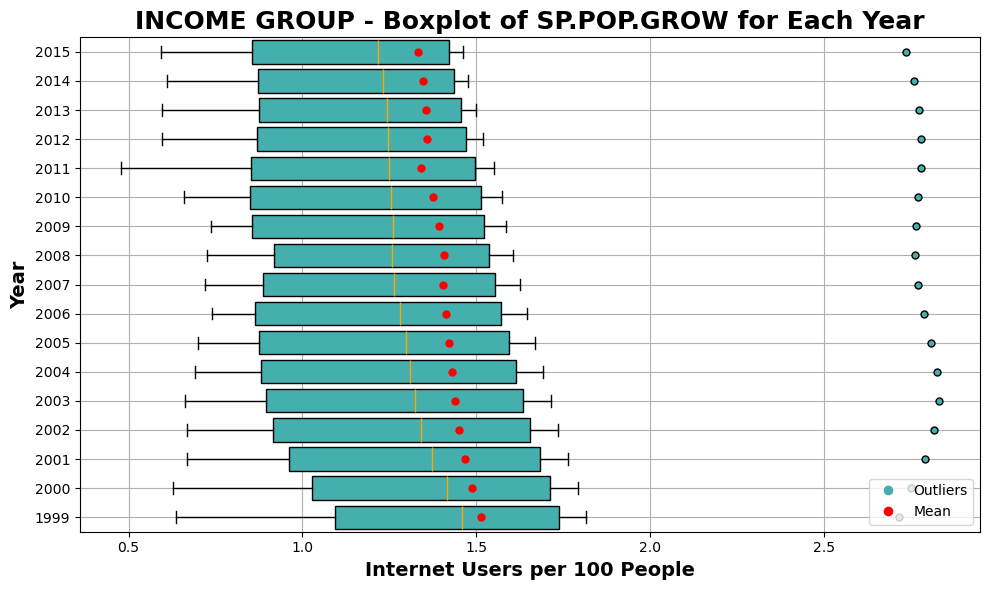

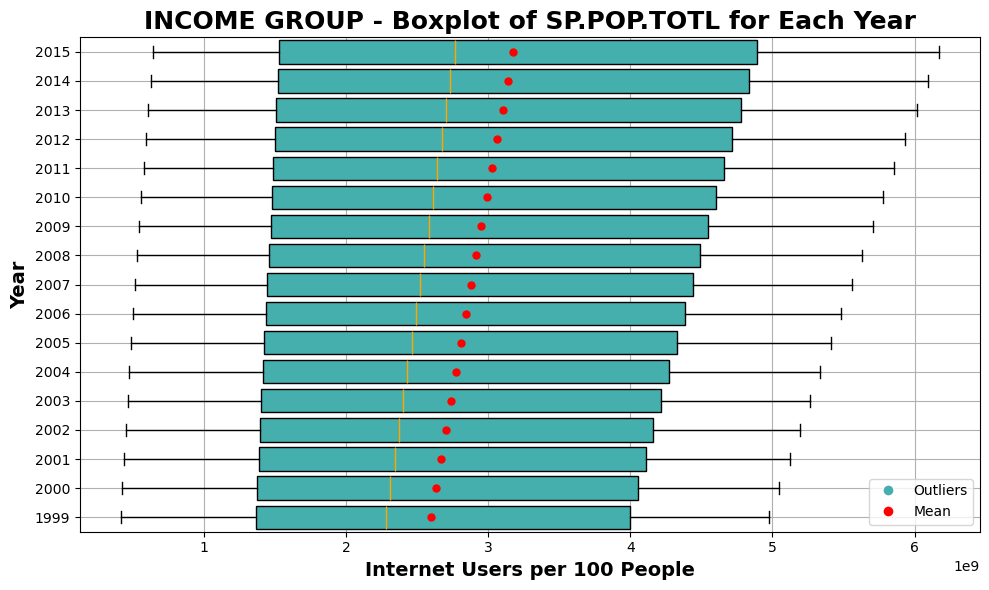

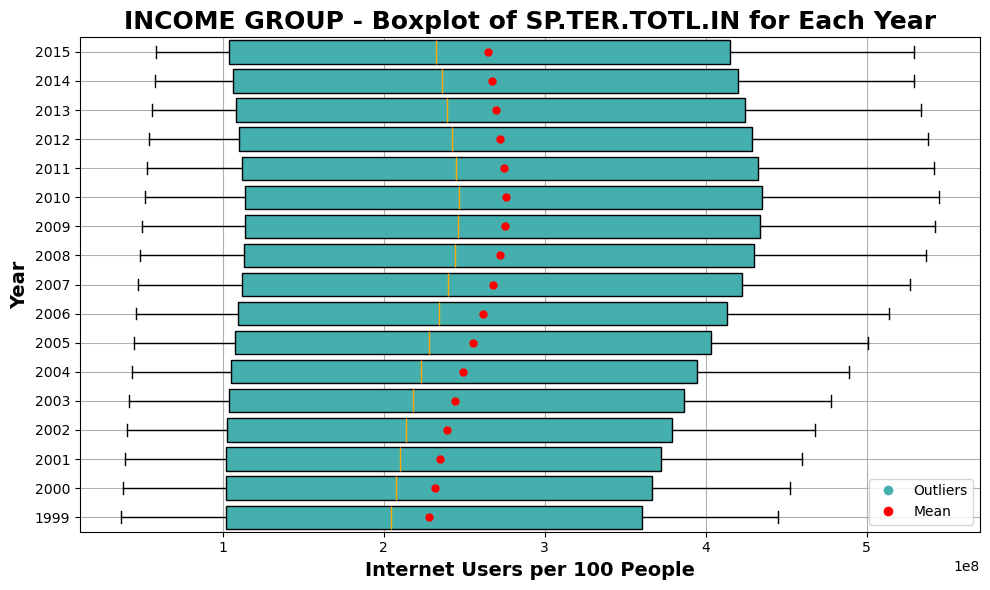

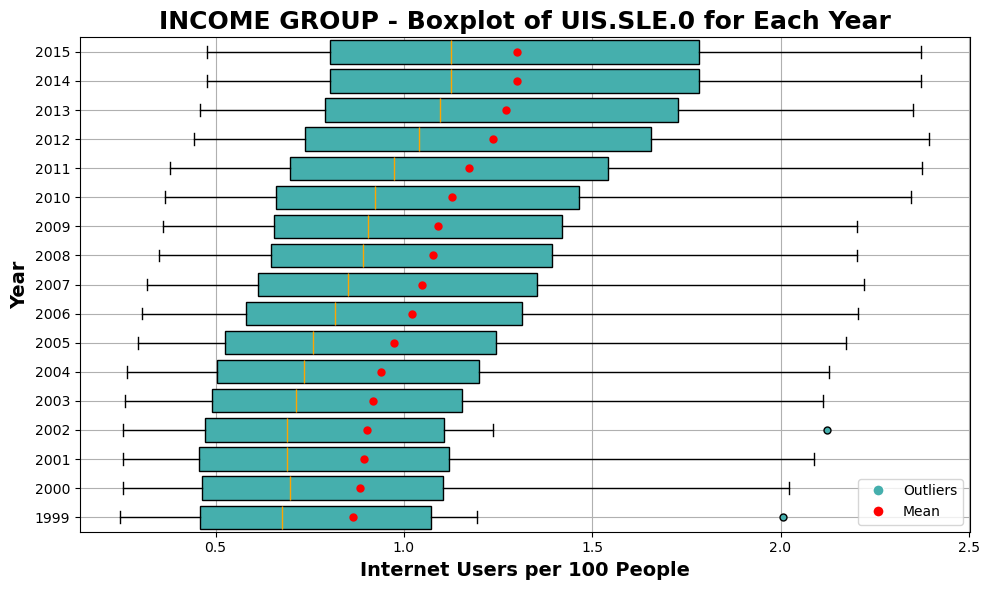

In [40]:
def plot_boxplot_for_indicators(df_pivoted_allYears_GROUP, name_group):
    # Define years
    years = range(1999, 2016)
    
    # Get all indicator codes from the dataframe
    indicator_codes = df_pivoted_allYears_GROUP['1999'].columns.tolist()

    # Iterate over each indicator code
    for indicator_code in indicator_codes:
        # Create a single subplot
        plt.figure(figsize=(10, 6))
        
        # Lists to store handles and labels for the legend
        legend_handles = []
        
        # Iterate over years and plot boxplot for each year
        for year in years:
            # Extract the column for the current indicator code and year
            indicator_column = df_pivoted_allYears_GROUP[str(year)][indicator_code]


        
            # Create a boxplot for the current year
            box = plt.boxplot(indicator_column, positions=[year], vert=False, widths=0.8, patch_artist=True, # vert=False for horizontal boxplot, patch_artist=True for filling color
                        boxprops=dict(facecolor=(69/255, 175/255, 173/255)),   
                        flierprops=dict(marker='o', markersize=5, markerfacecolor=(69/255, 175/255, 173/255)),  # Change the outlier style
                        medianprops=dict(color='orange'))  # Color of the median line
        
            # Calculate the mean of the indicator column for the current year
            mean_indicator_value = indicator_column.mean()
            
            # Plot mean marker
            plt.plot(mean_indicator_value, year, marker='o', markerfacecolor='red', markeredgecolor='red', markersize=5)


        # Store handles and labels for the legend
        legend_handles.append(Line2D([0], [0], marker='o', color='w', markerfacecolor=(69/255, 175/255, 173/255), markersize=8, label='Outliers'))
        legend_handles.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Mean'))
        
        # Add legend
        plt.legend(handles=legend_handles, loc='lower right')
        
        # Adjust labels and title
        plt.xlabel('Internet Users per 100 People', fontweight='bold', fontsize=14)
        plt.ylabel('Year', fontweight='bold', fontsize=14)
        plt.title(f'{name_group} - Boxplot of {indicator_code} for Each Year', fontweight='bold', fontsize=18)
        
        # Adjust x-axis ticks and labels
        plt.grid(True)
        plt.tight_layout()
        plt.show()

plot_boxplot_for_indicators(df_pivoted_allYears_INCOME, 'INCOME GROUP')

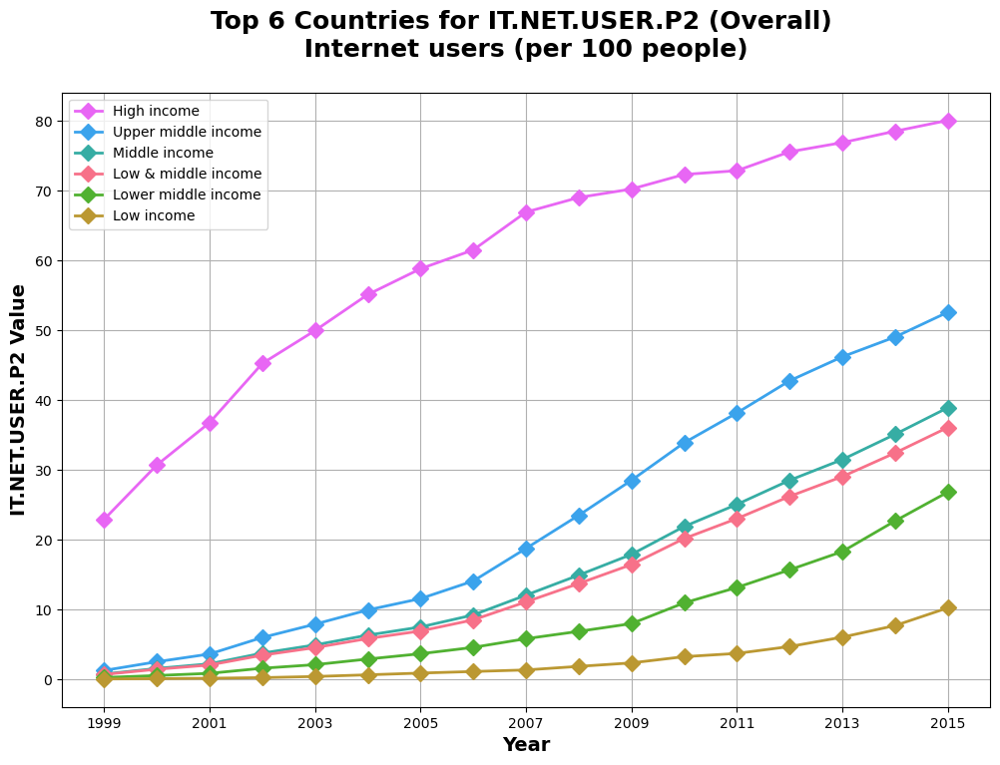

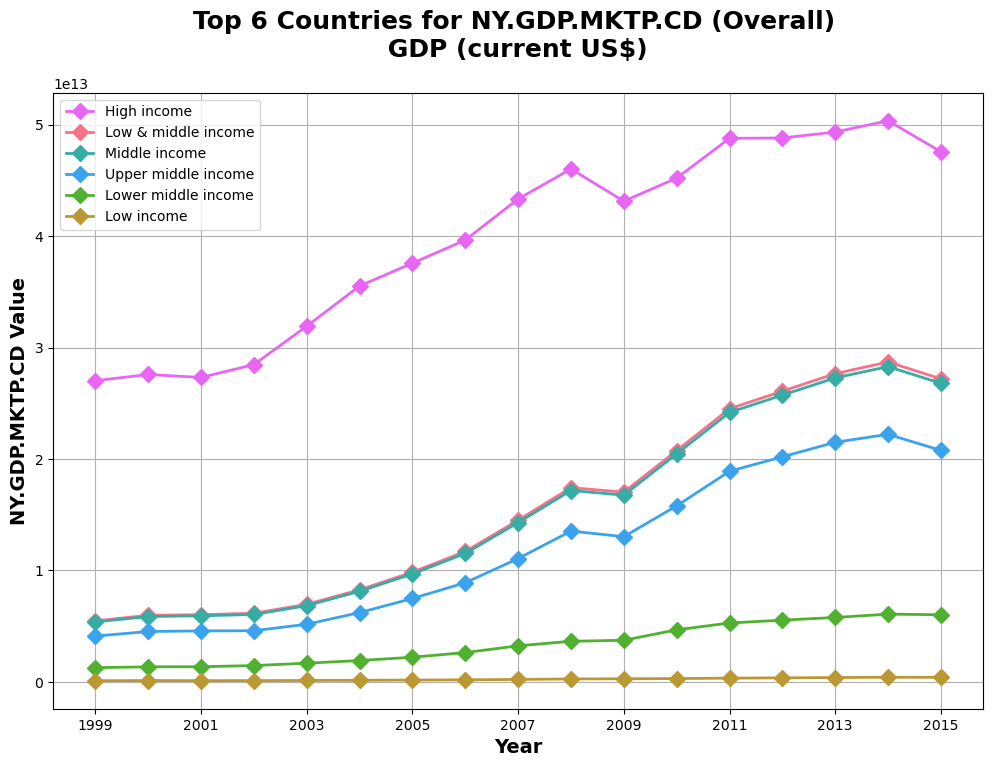

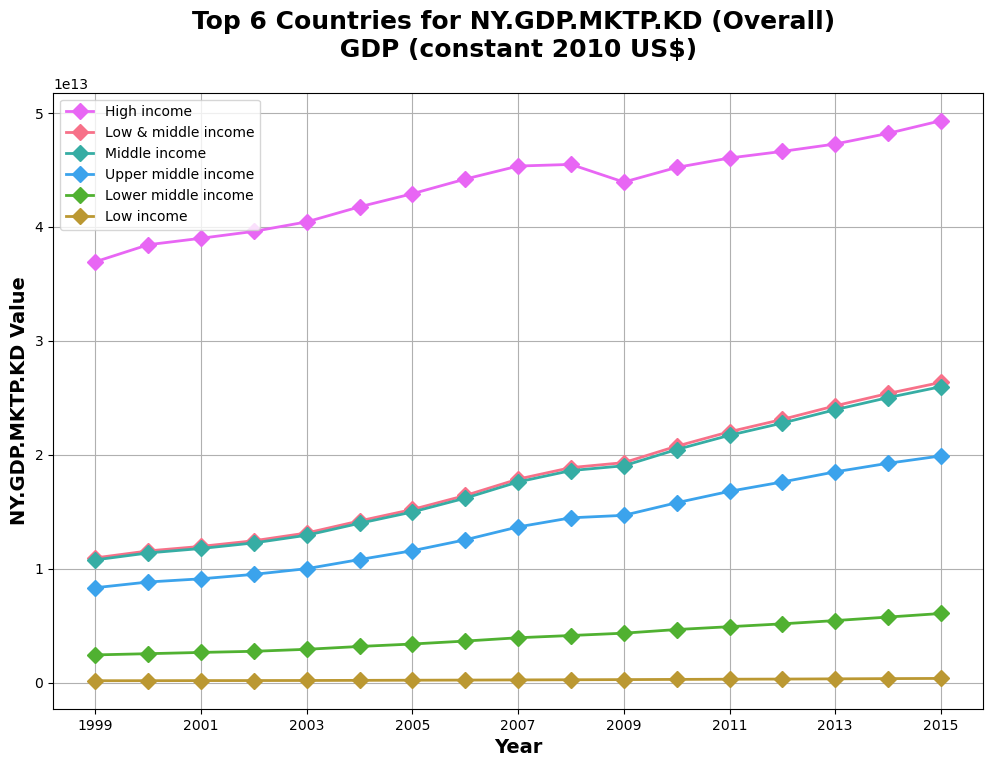

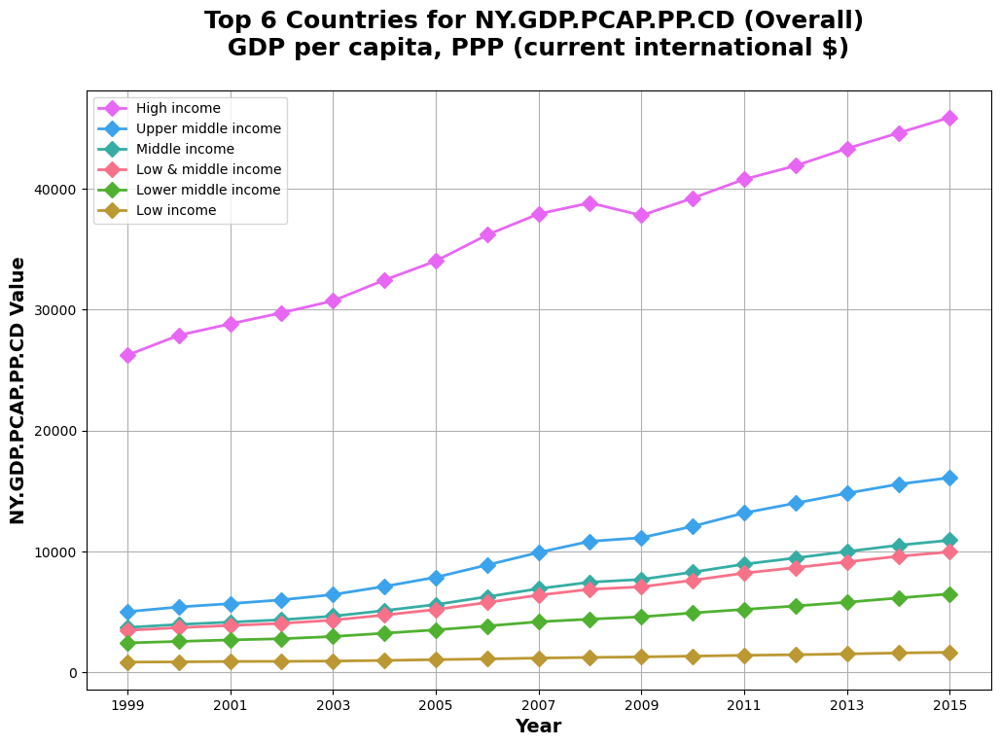

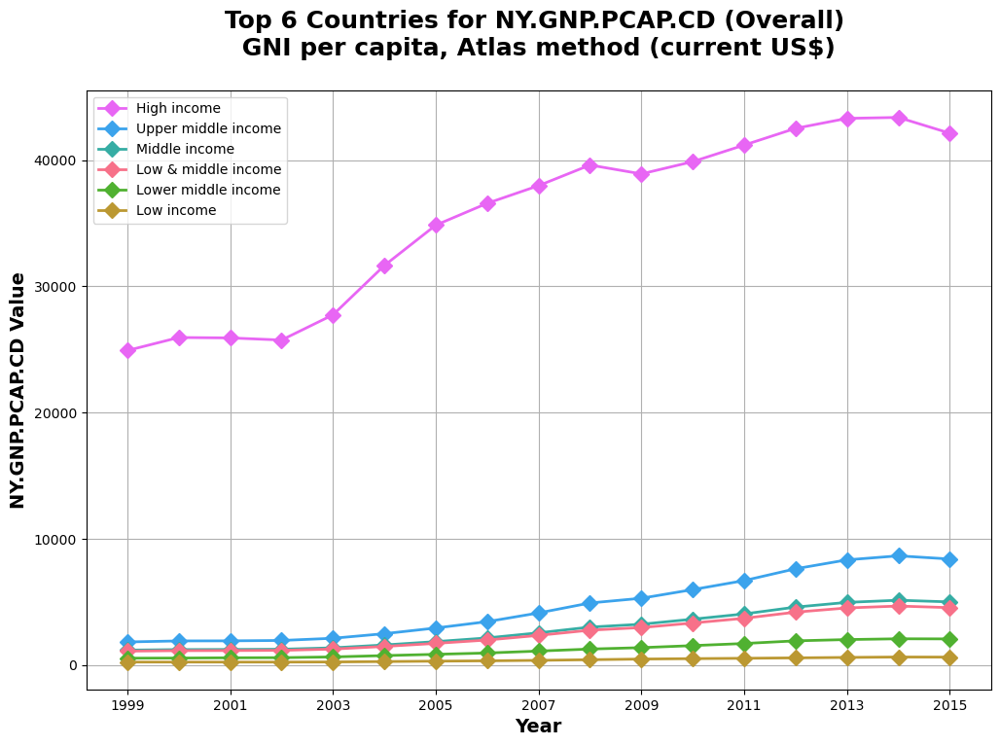

...

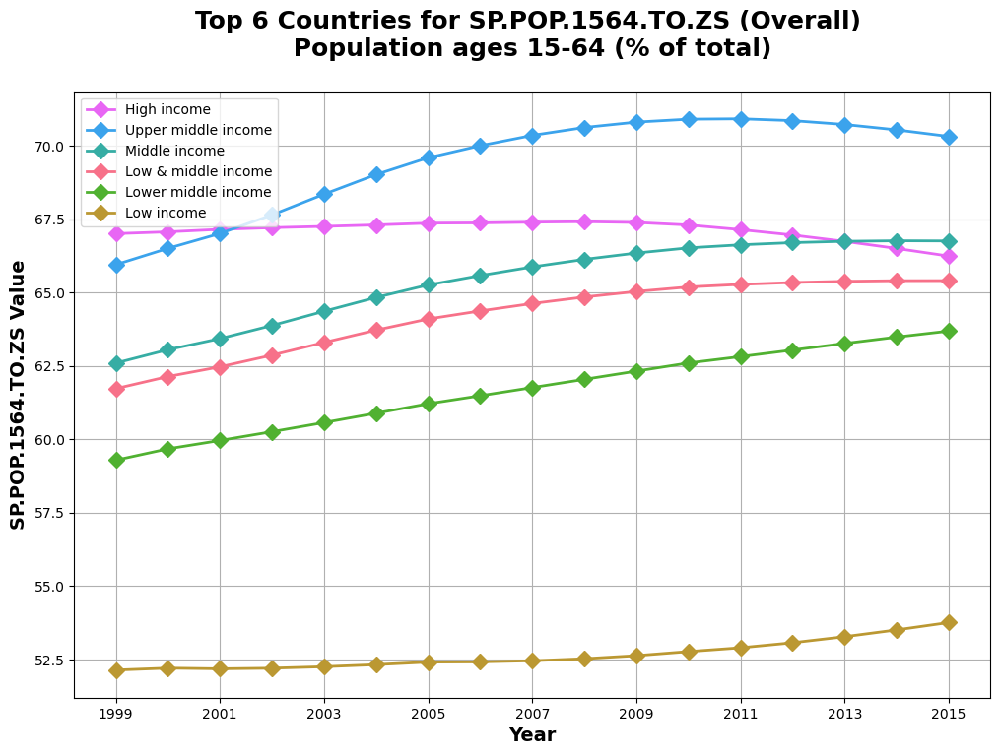

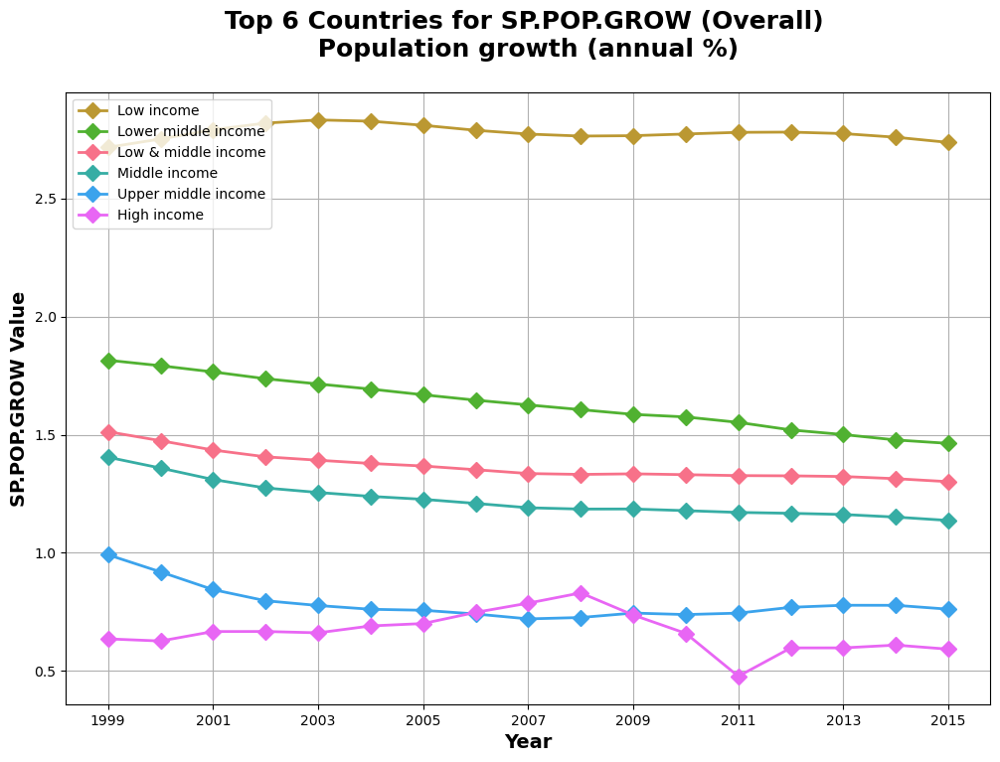

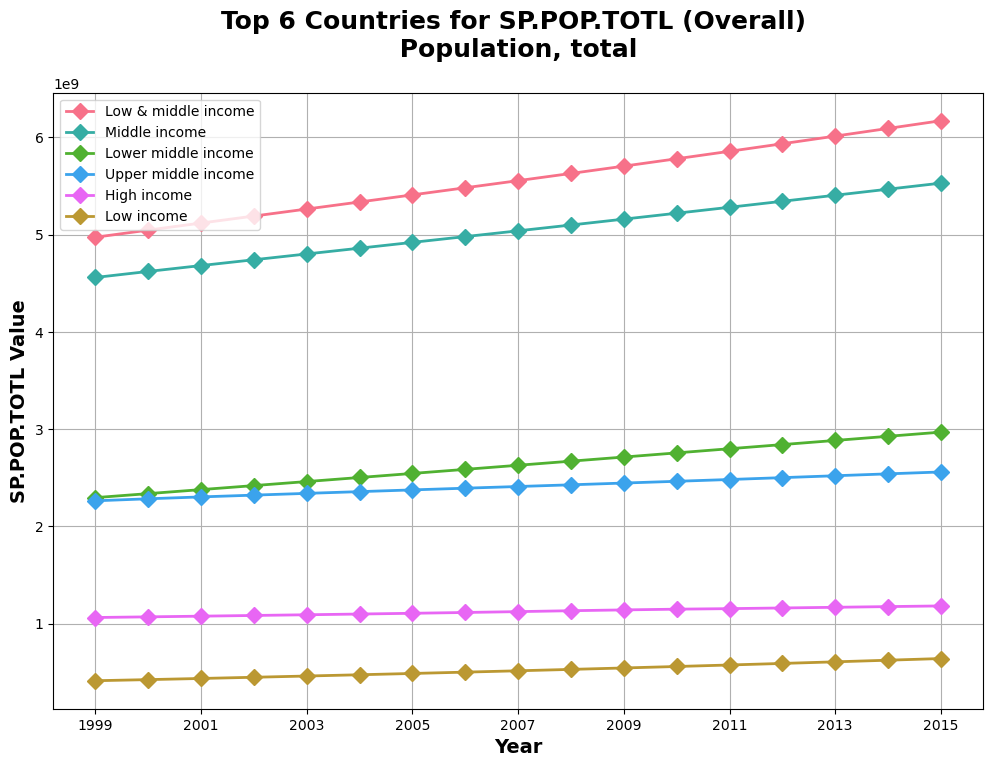

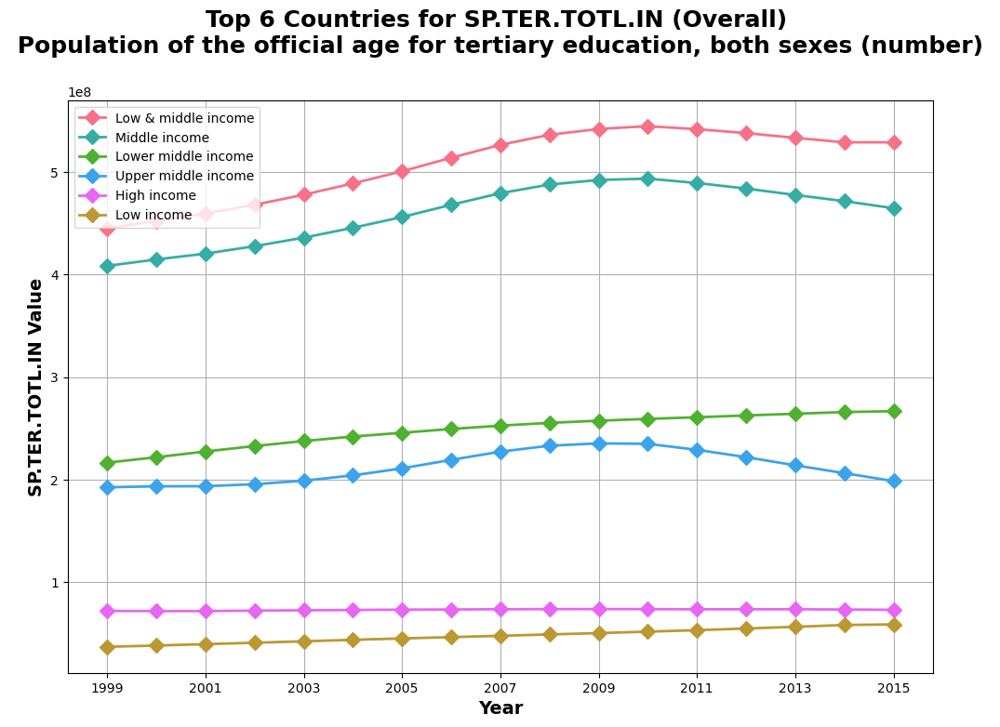

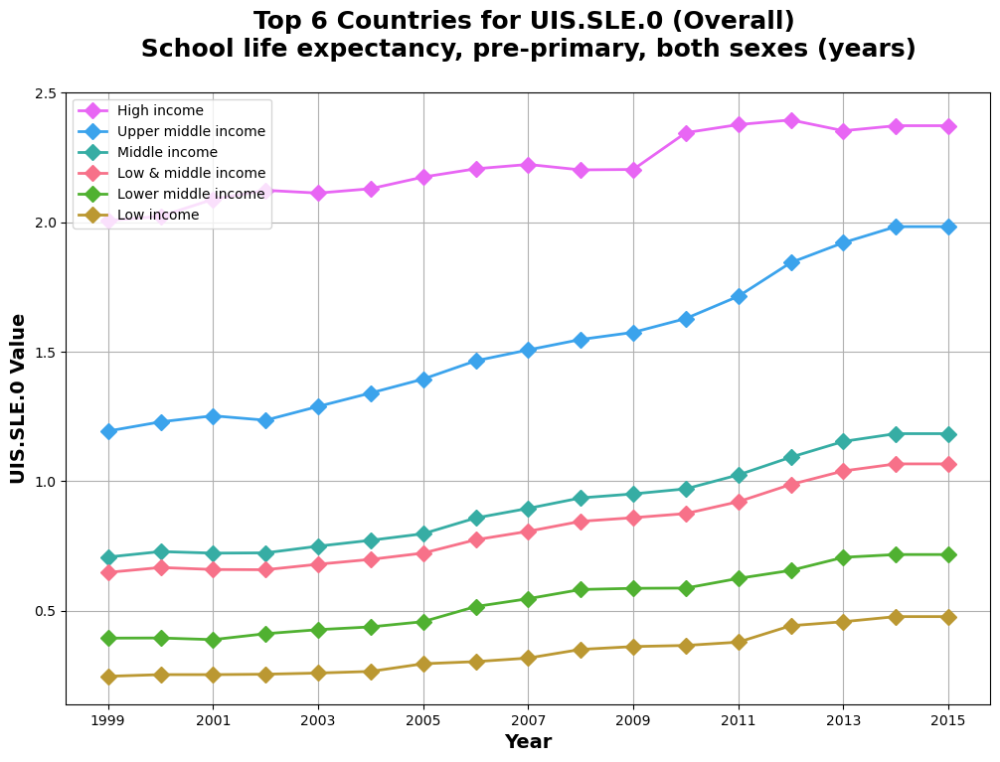

In [41]:
# ==================================================================================================
# CREATE LINE PLOTS FOR TOP N COUNTRIES OVERALL (1999-2015) FOR ALL INDICATORS
# INCOME GROUP
# ==================================================================================================

list_of_INCOME_Country_Name    = ['Low & middle income','Low income','Lower middle income','Middle income','Upper middle income', 'High income']
N_max = 6
current_dataset = df_pivoted_allYears_INCOME
df_min_max_indicator = df_min_max_indicator_INCOME

# Iterate over all indicators.
indicator_list = df_min_max_indicator_INCOME['INDICATOR'].tolist()
for current_Indicator in indicator_list:
    create_line_plot(current_dataset, N_max, current_Indicator, list_of_INCOME_Country_Name)


### IV.1.2. Analysis for the REGIONS Group

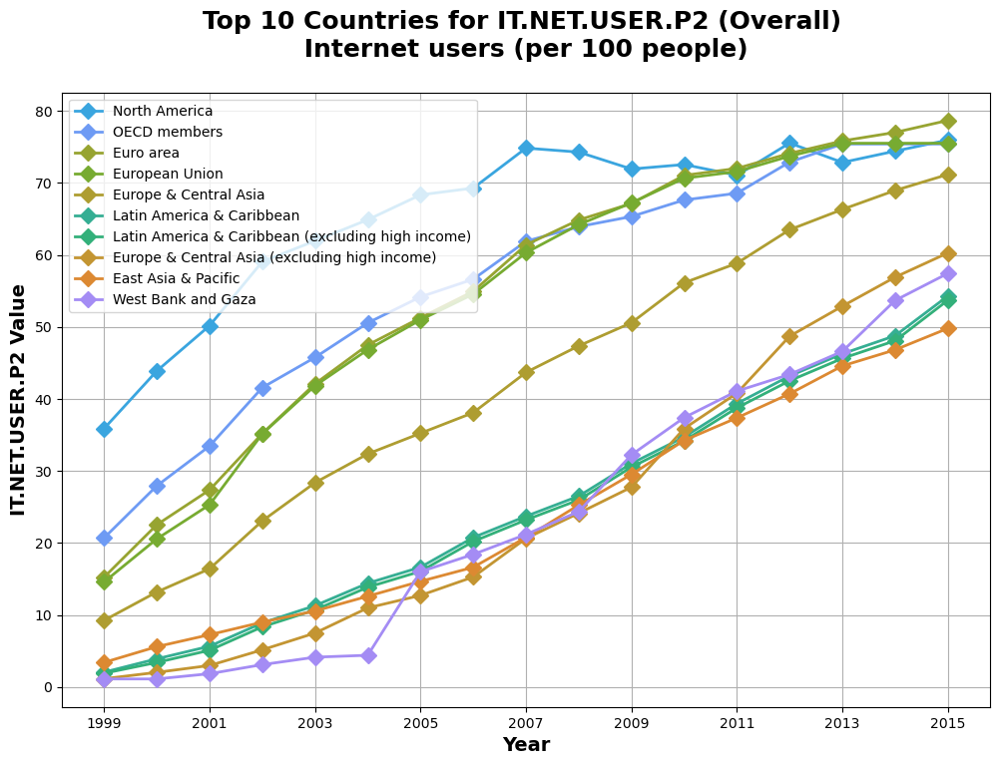

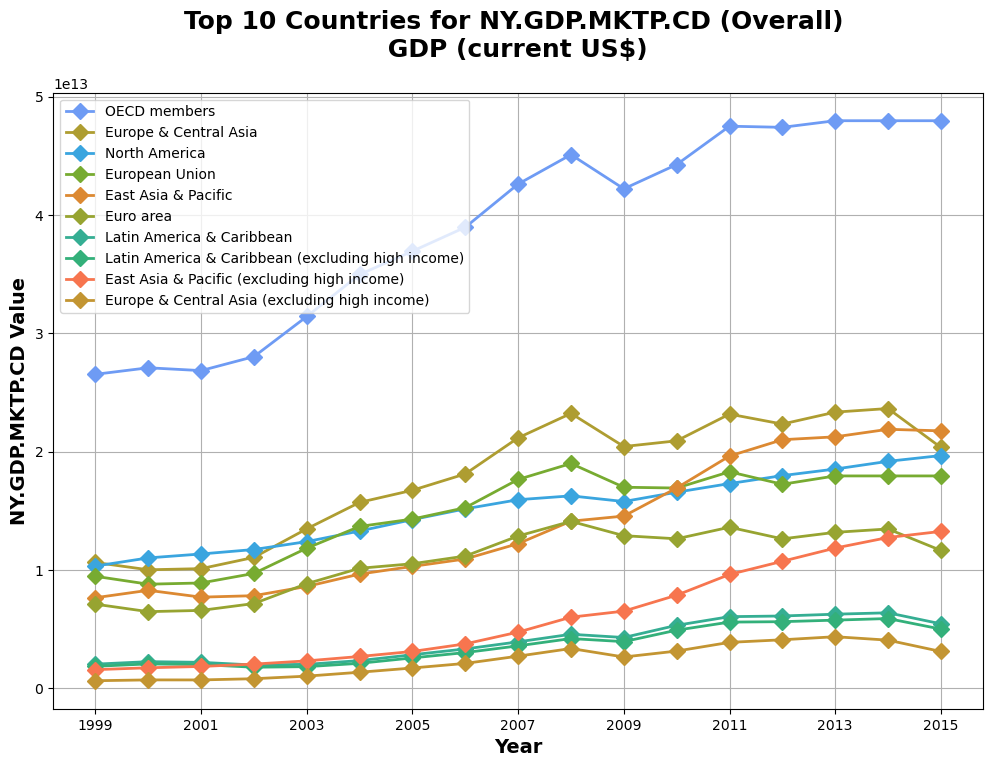

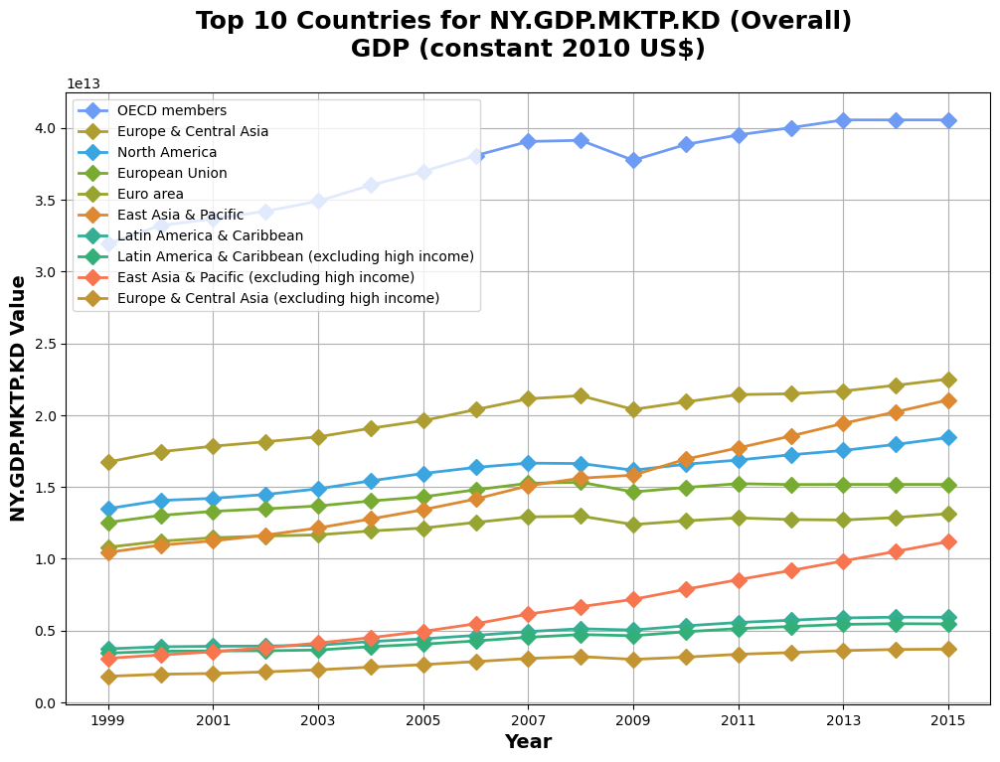

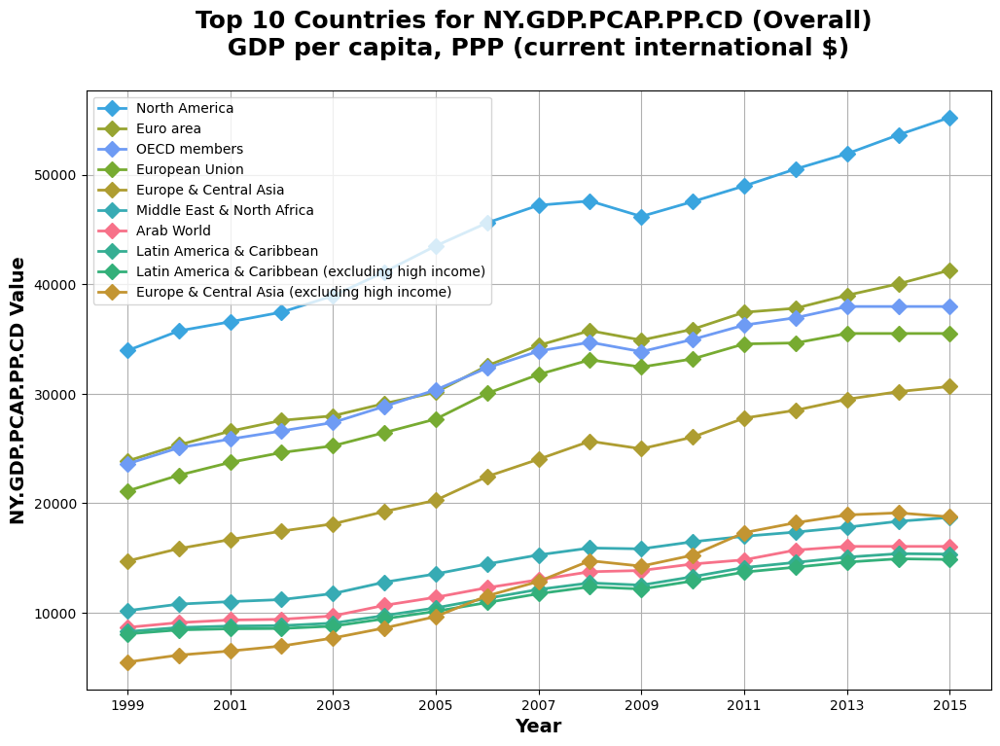

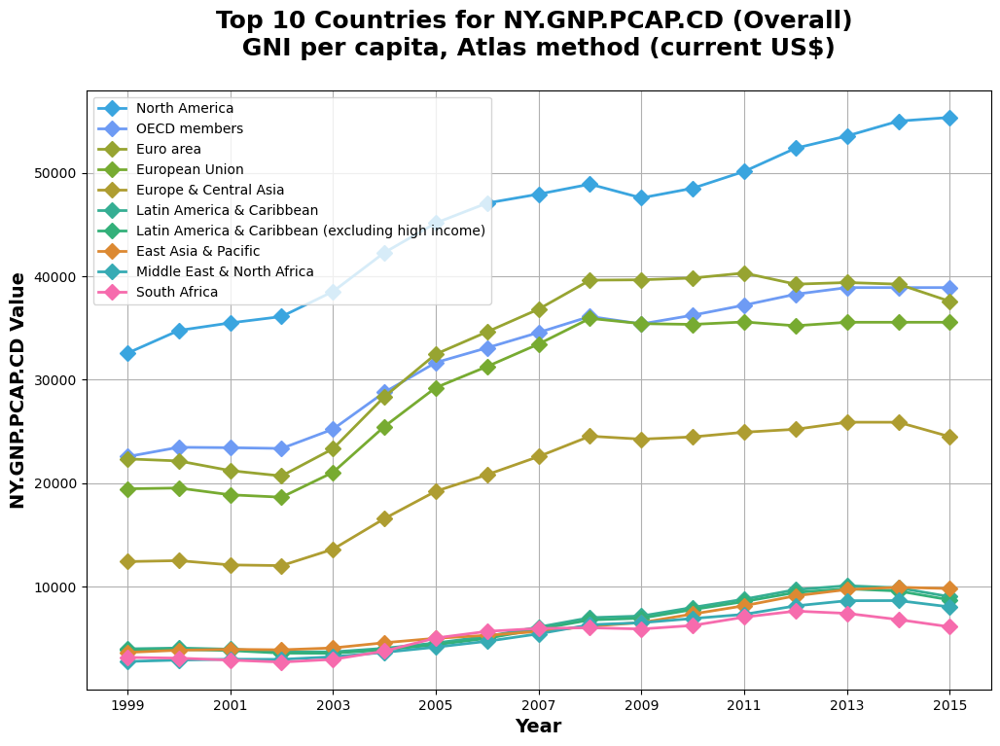

...

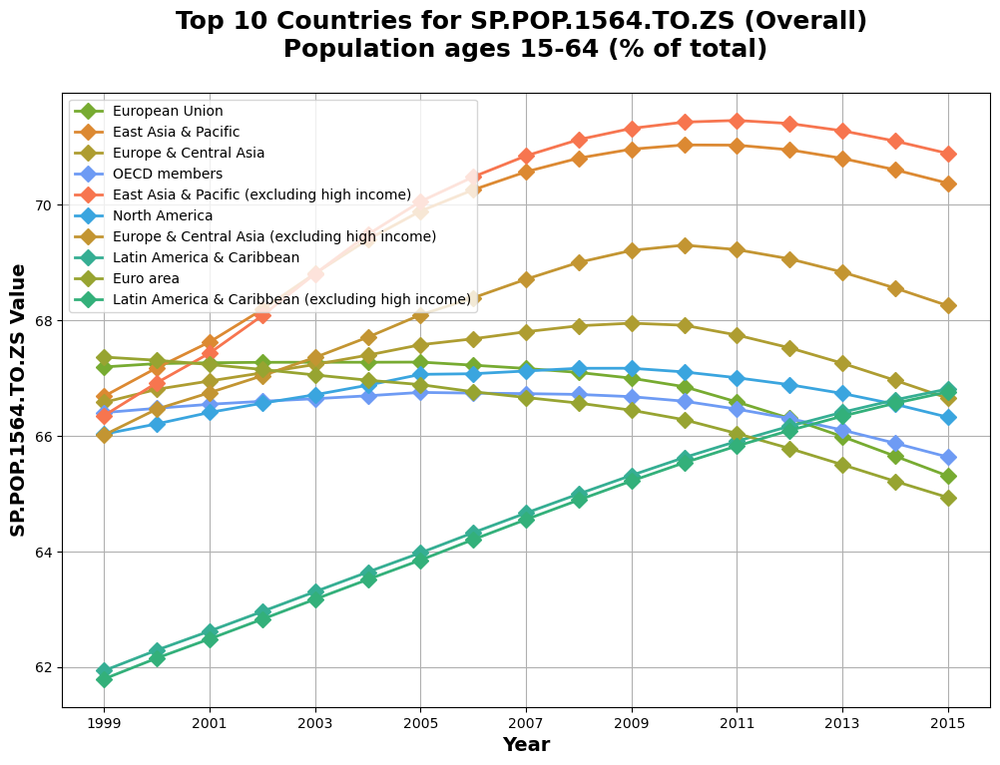

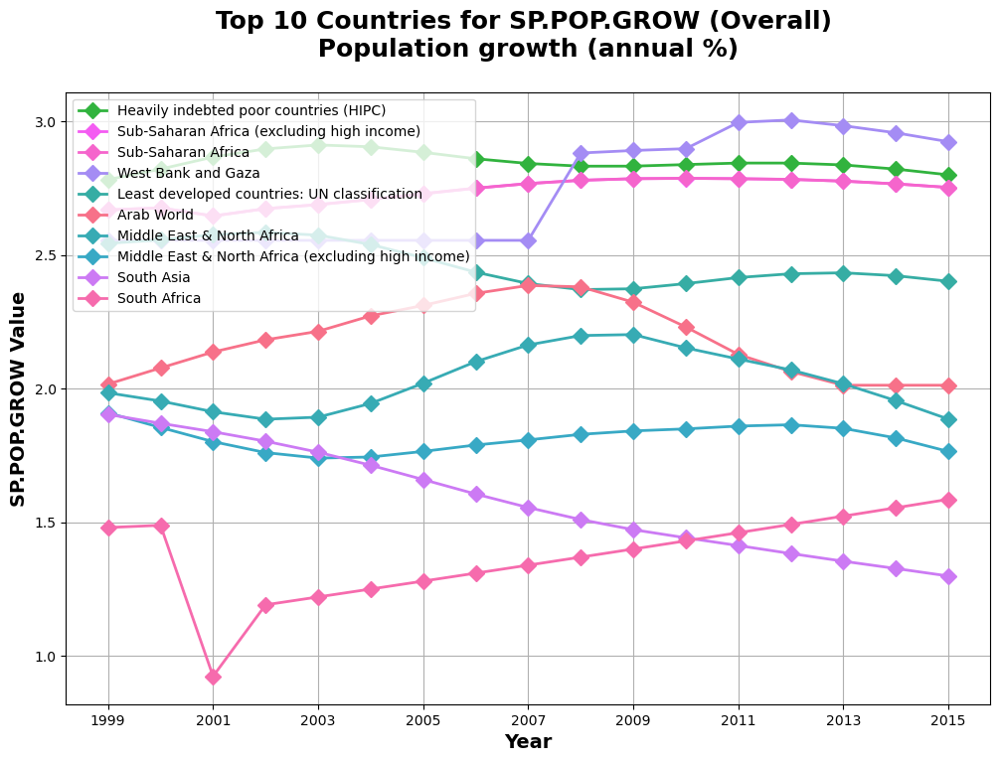

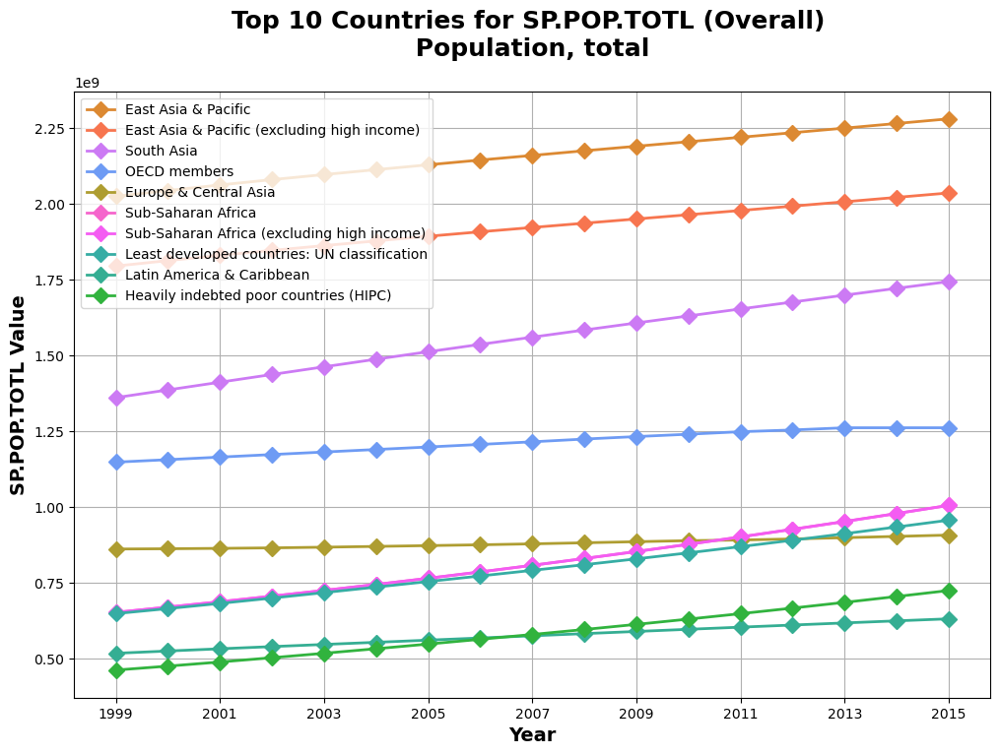

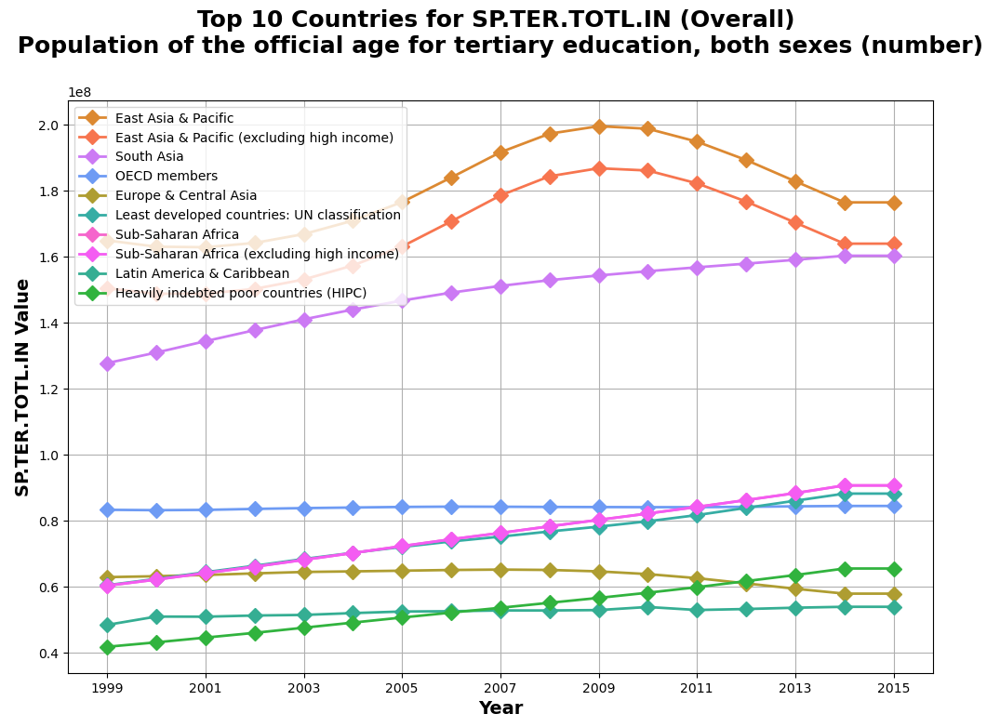

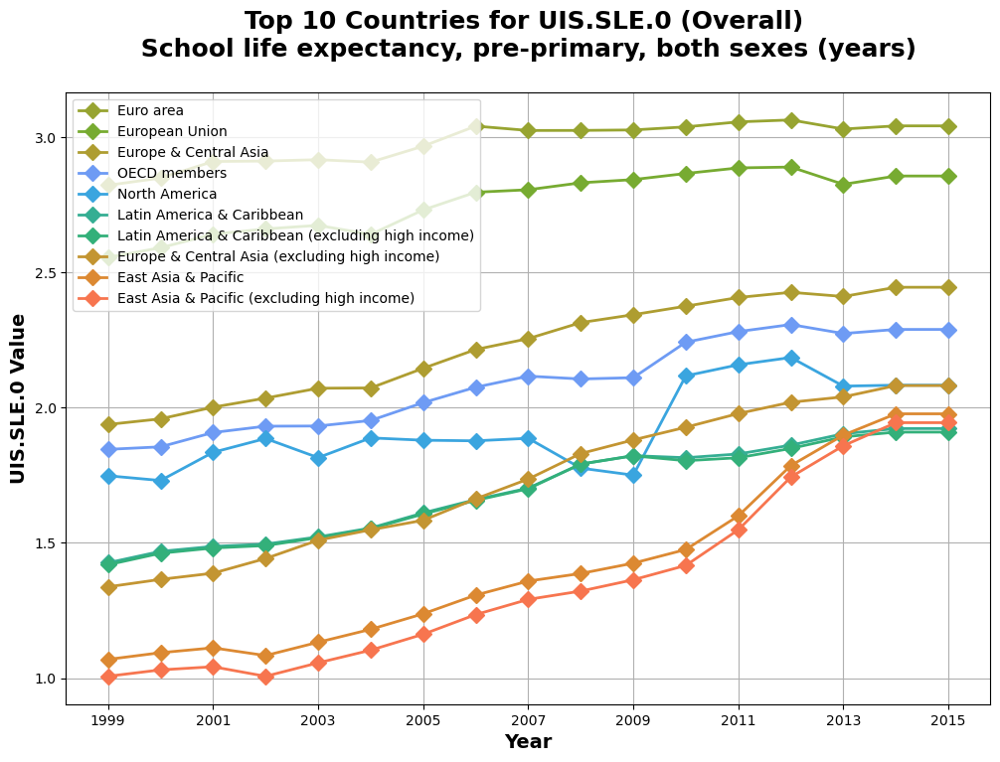

In [42]:
# ==================================================================================================
# CREATE LINE PLOTS FOR TOP N COUNTRIES OVERALL (1999-2015) FOR ALL INDICATORS
# REGIONS GROUP
# ==================================================================================================

list_of_REGIONS_Country_Name   = ['Arab World','East Asia & Pacific (excluding high income)','East Asia & Pacific','Europe & Central Asia (excluding high income)','Europe & Central Asia','Euro area','European Union','Heavily indebted poor countries (HIPC)','Latin America & Caribbean (excluding high income)','Latin America & Caribbean','Least developed countries: UN classification','Middle East & North Africa','Middle East & North Africa (excluding high income)','North America','OECD members','West Bank and Gaza','South Asia','Sub-Saharan Africa (excluding high income)','Sub-Saharan Africa','South Africa']
N_max = 10
current_dataset = df_pivoted_allYears_REGIONS
df_min_max_indicator = df_min_max_indicator_REGIONS

# Iterate over all indicators.
indicator_list = df_min_max_indicator_INCOME['INDICATOR'].tolist()
for current_Indicator in indicator_list:
    create_line_plot(current_dataset, N_max, current_Indicator, list_of_REGIONS_Country_Name)

### IV.1.3. Analysis for the COUNTRIES Group

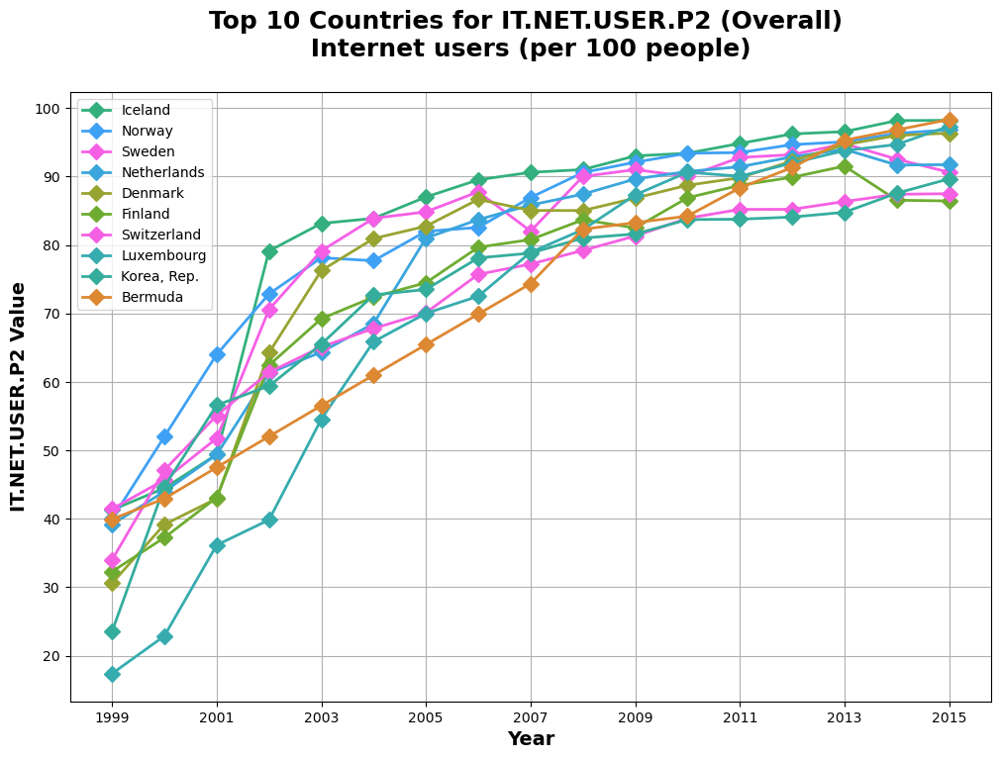

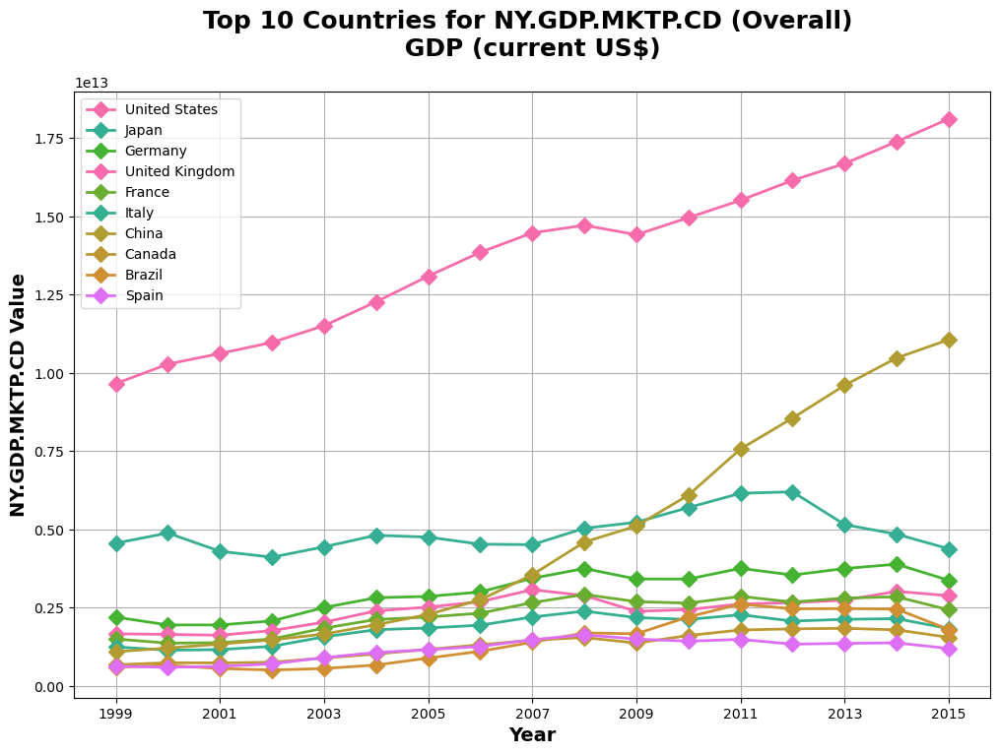

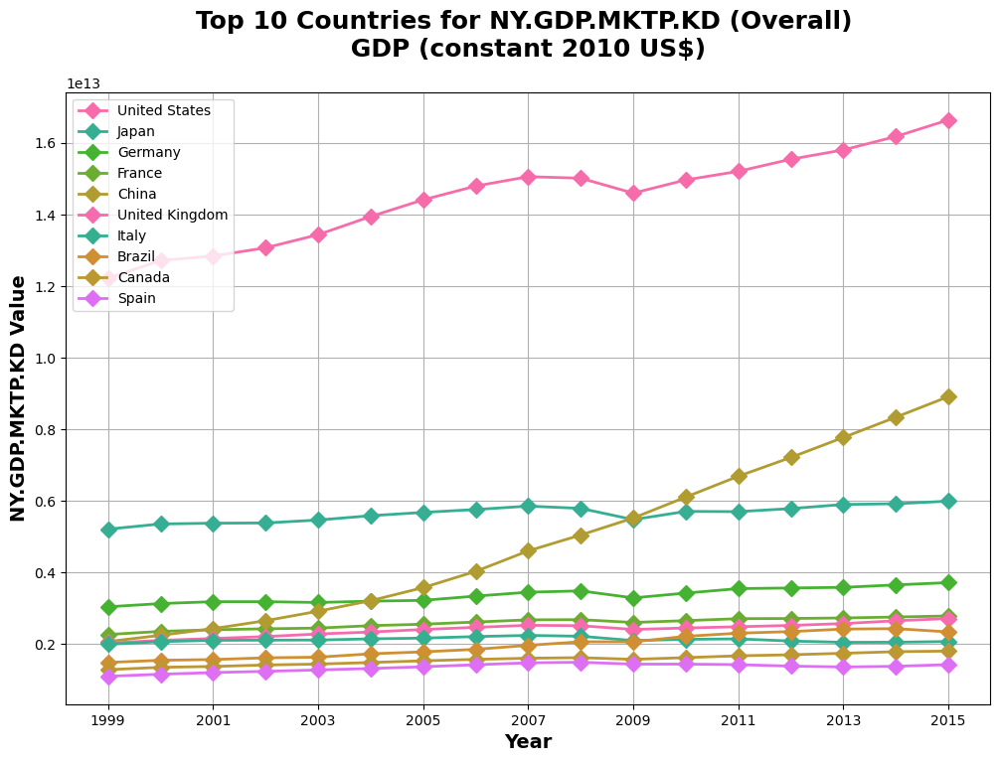

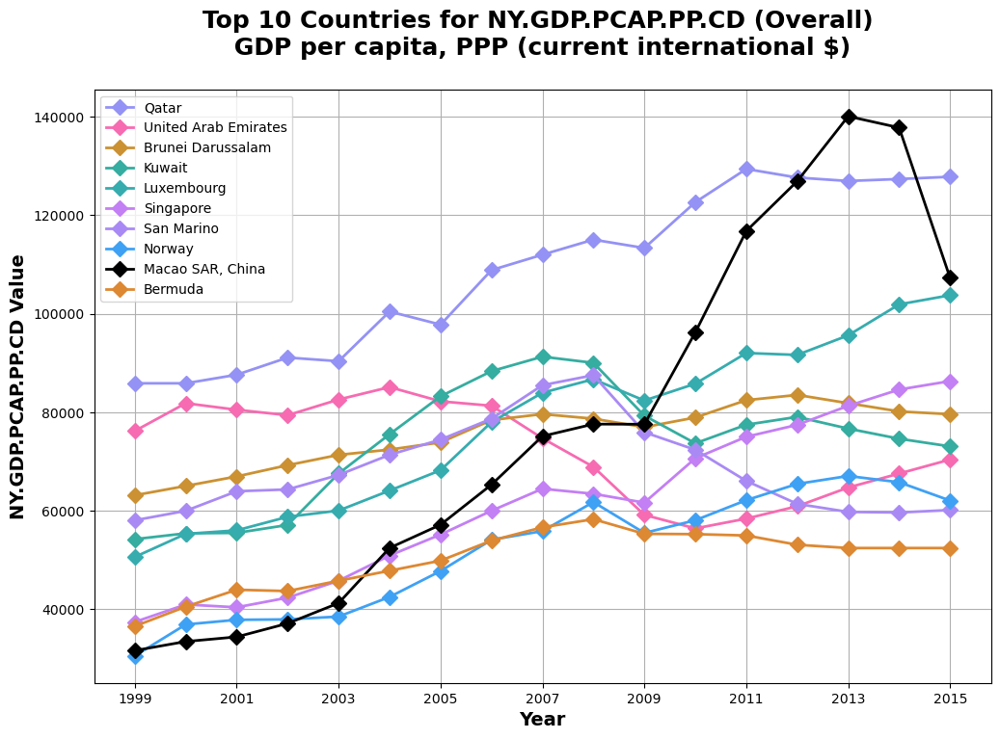

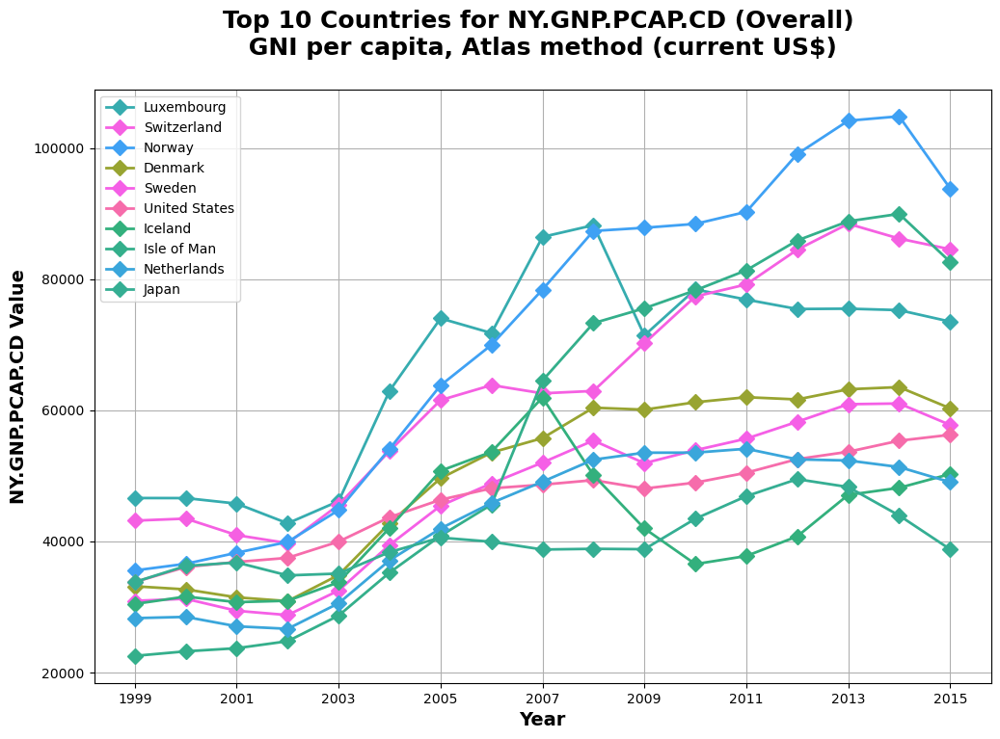

...

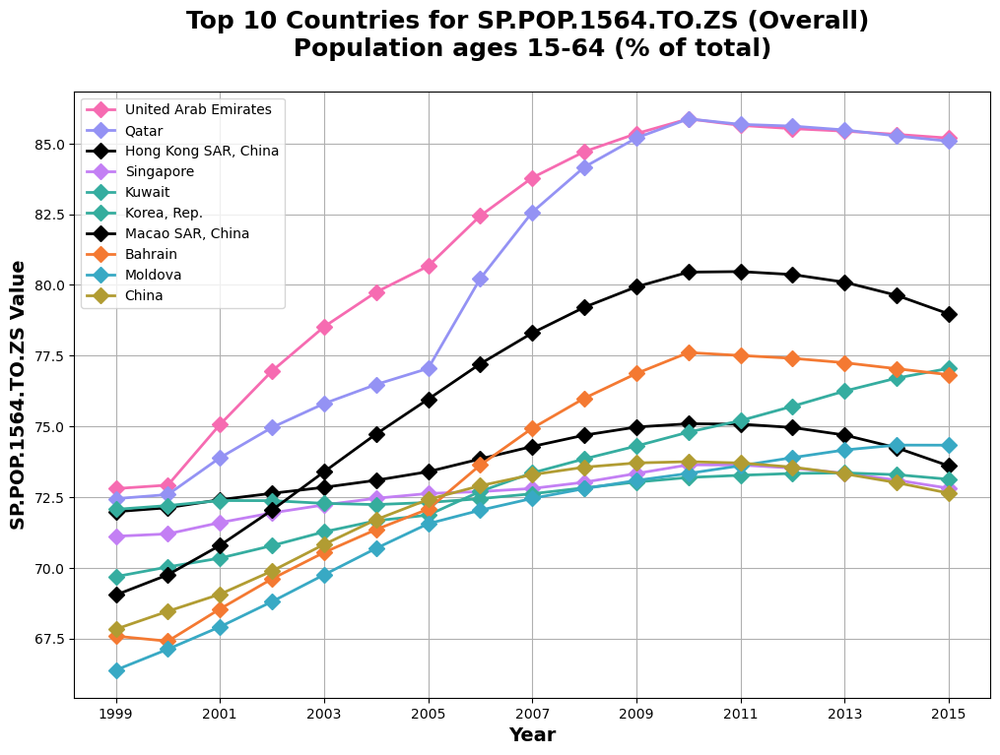

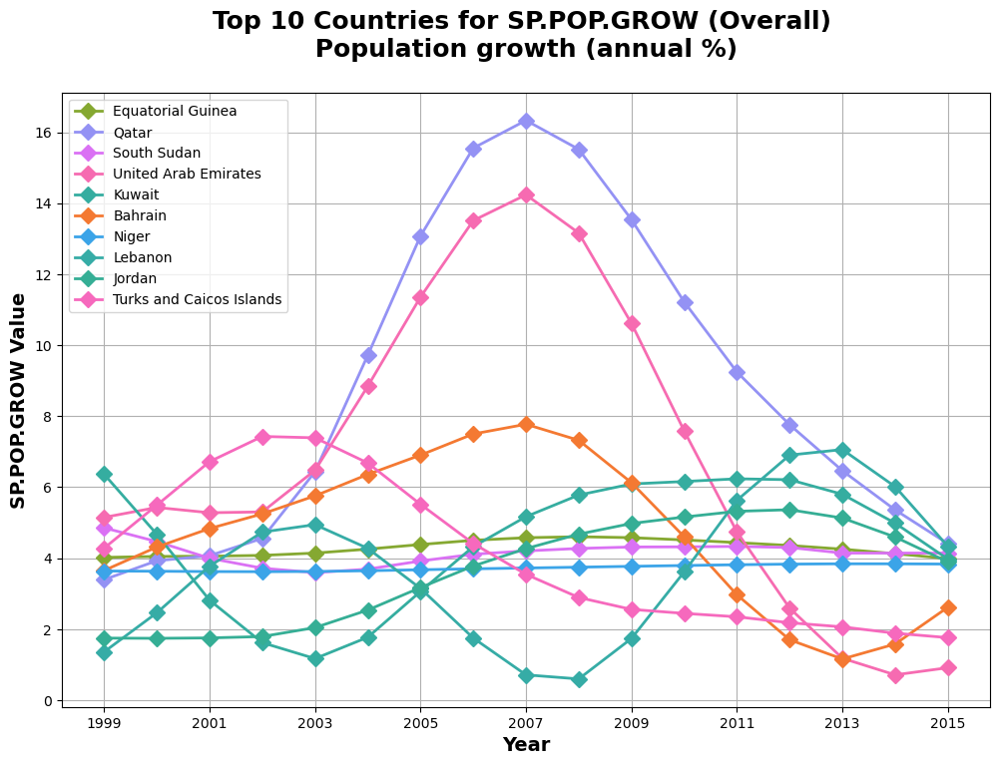

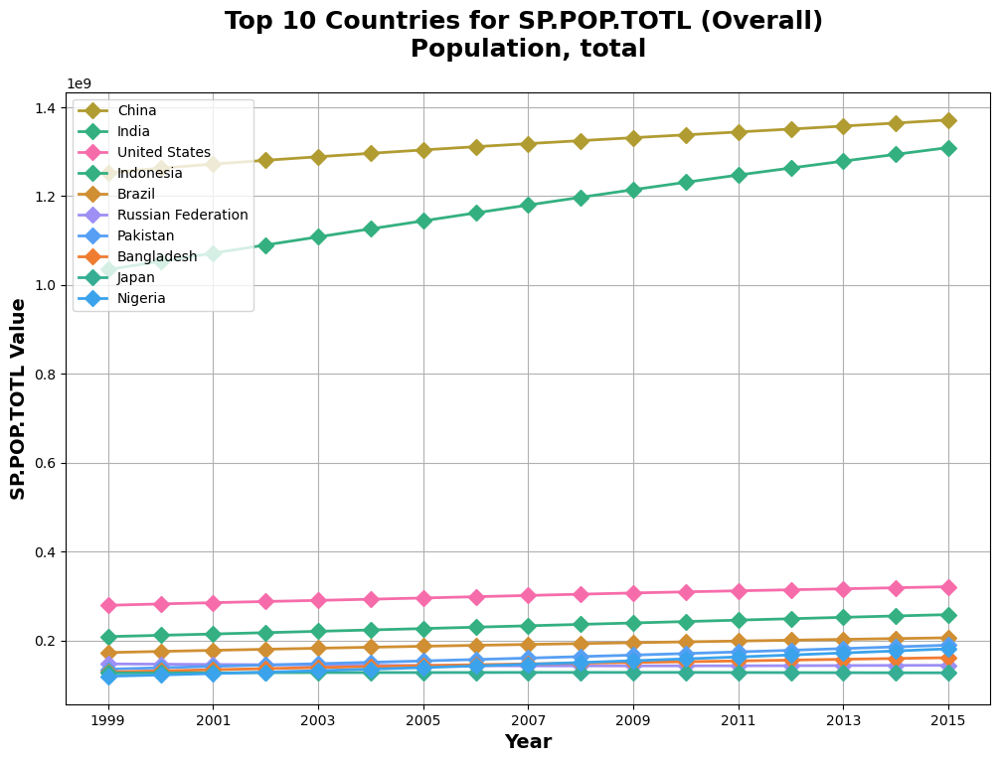

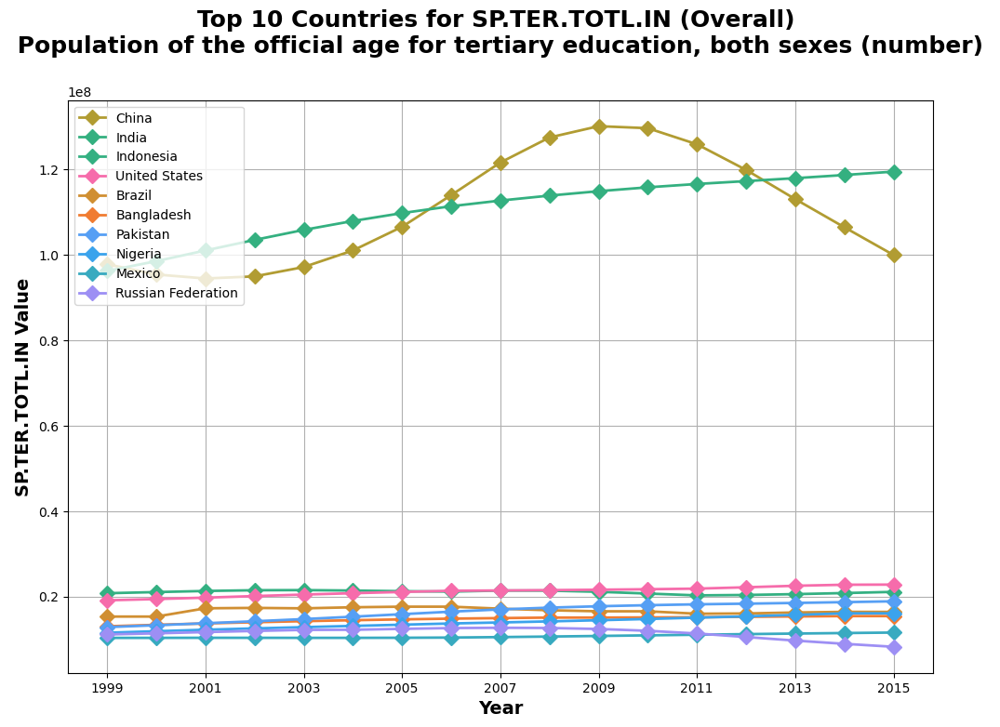

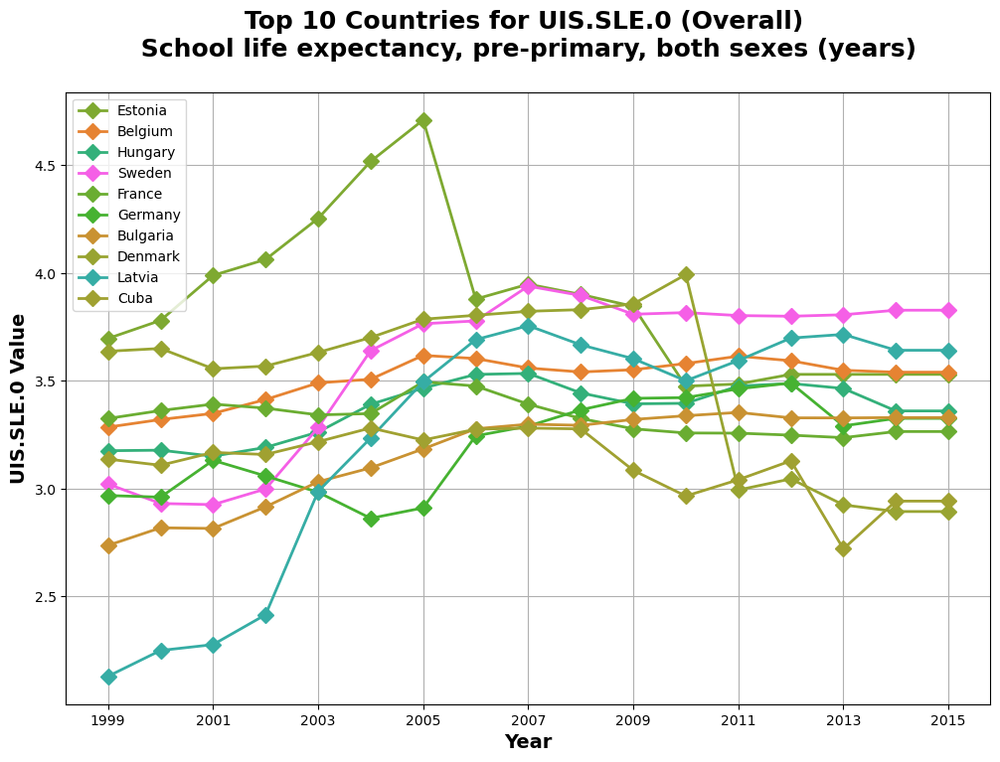

In [43]:
# ==================================================================================================
# CREATE LINE PLOTS FOR TOP N COUNTRIES OVERALL (1999-2015) FOR ALL INDICATORS
# COUNTRIES GROUP
# ==================================================================================================

list_of_COUNTRIES_Country_Name = ['Afghanistan','Albania','Algeria','American Samoa','Andorra','Angola','Antigua and Barbuda','Argentina','Armenia','Aruba',
                                  'Australia','Austria','Azerbaijan','Bahamas, The','Bahrain','Bangladesh','Barbados','Belarus','Belgium','Belize','Benin',
                                  'Bermuda','Bhutan','Bolivia','Bosnia and Herzegovina','Botswana','Brazil','British Virgin Islands','Brunei Darussalam',
                                  'Bulgaria','Burkina Faso','Burundi','Cabo Verde','Cambodia','Cameroon','Canada','Cayman Islands','Central African Republic',
                                  'Chad','Channel Islands','Chile','China','Colombia','Comoros','Congo, Dem. Rep.','Congo, Rep.','Costa Rica','Cote dIvoire',
                                  'Croatia','Cuba','Curacao','Cyprus','Czech Republic','Denmark','Djibouti','Dominica','Dominican Republic','Ecuador',
                                  'Egypt, Arab Rep.','El Salvador','Equatorial Guinea','Eritrea','Estonia','Ethiopia','Faroe Islands','Fiji','Finland',
                                  'France','French Polynesia','Gabon','Gambia, The','Georgia','Germany','Ghana','Gibraltar','Greece','Greenland','Grenada',
                                  'Guam','Guatemala','Guinea','Guinea-Bissau','Guyana','Haiti','Honduras','Hong Kong SAR, China','Hungary','Iceland','India',
                                  'Indonesia','Iran, Islamic Rep.','Iraq','Ireland','Isle of Man','Israel','Italy','Jamaica','Japan','Jordan','Kazakhstan',
                                  'Kenya','Kiribati','Korea, Dem. People’s Rep.','Korea, Rep.','Kosovo','Kuwait','Kyrgyz Republic','Lao PDR','Latvia',
                                  'Lebanon','Lesotho','Liberia','Libya','Liechtenstein','Lithuania','Luxembourg','Macao SAR, China','Macedonia, FYR',
                                  'Madagascar','Malawi','Malaysia','Maldives','Mali','Malta','Marshall Islands','Mauritania','Mauritius','Mexico',
                                  'Micronesia, Fed. Sts.','Moldova','Monaco','Mongolia','Montenegro','Morocco','Mozambique','Myanmar','Namibia','Nauru',
                                  'Nepal','Netherlands','New Caledonia','New Zealand','Nicaragua','Niger','Nigeria','Northern Mariana Islands','Norway',
                                  'Oman','Pakistan','Palau','Panama','Papua New Guinea','Paraguay','Peru','Philippines','Poland','Portugal','Puerto Rico',
                                  'Qatar','Romania','Russian Federation','Rwanda','Samoa','San Marino','Sao Tome and Principe','Saudi Arabia','Senegal',
                                  'Serbia','Seychelles','Sierra Leone','Singapore','Sint Maarten (Dutch part)','Slovak Republic','Slovenia','Solomon Islands',
                                  'Somalia','South Sudan','Spain','Sri Lanka','St. Kitts and Nevis','St. Lucia','St. Martin (French part)',
                                  'St. Vincent and the Grenadines','Sudan','Suriname','Swaziland','Sweden','Switzerland','Syrian Arab Republic',
                                  'Tajikistan','Tanzania','Thailand','Timor-Leste','Togo','Tonga','Trinidad and Tobago','Tunisia','Turkey','Turkmenistan',
                                  'Turks and Caicos Islands','Tuvalu','Uganda','Ukraine','United Arab Emirates','United Kingdom','United States','Uruguay',
                                  'Uzbekistan','Vanuatu','Venezuela, RB','Vietnam','Virgin Islands (U.S.)','Yemen, Rep.','Zambia','Zimbabwe']

list_of_COUNTRIES_Country_Name.remove('Hong Kong SAR, China')
list_of_COUNTRIES_Country_Name.remove('Macao SAR, China')
N_max = 10
current_dataset = df_pivoted_allYears_COUNTRIES
df_min_max_indicator = df_min_max_indicator_COUNTRIES

# Assuming df_pivoted_allYears is your DataFrame
# Assuming df_min_max_indicator_INCOME is your DataFrame with indicator names and details
# Adjust the parameters accordingly
# create_line_plot(current_dataset, N_max, current_Indicator, list_of_INCOME_Country_Name)

# Iterate over all indicators.
indicator_list = df_min_max_indicator_INCOME['INDICATOR'].tolist()
for current_Indicator in indicator_list:
    create_line_plot(current_dataset, N_max, current_Indicator, list_of_COUNTRIES_Country_Name)

## IV.2. Bivariate Analysis <a class="anchor" id="section_5_2"></a>

In [44]:
import random 
from matplotlib.patches import Rectangle


def create_bivariate_scatter_plot(df_pivoted_allYears, N_max, indicator1, indicator2, list_of_X_Country_Code):
    """
    Generate a scatter plot for the top N_max countries overall for two specific indicators over the years from 1999 to 2015.

    Parameters:
    - df_pivoted_allYears (DataFrame): DataFrame containing indicator values for each country and year.
    - N_max (int): Maximum number of countries to display.
    - indicator1 (str): First indicator code for which the plot is generated.
    - indicator2 (str): Second indicator code for which the plot is generated.
    - list_of_X_Country_Code (list): List of country codes for which individual points will be plotted (NEEDED FOR THE COLOR MAPPING).
    """
    
    # top_countries_by_year for indicator1
    top_countries_by_year_indicator1 = {}
    for year in range(1999, 2016):
        top_countries_by_year_indicator1[year] = df_pivoted_allYears[str(year)][indicator1].nlargest(N_max).index.tolist()

    # top_countries_by_year for indicator2
    top_countries_by_year_indicator2 = {}
    for year in range(1999, 2016):
        top_countries_by_year_indicator2[year] = df_pivoted_allYears[str(year)][indicator2].nlargest(N_max).index.tolist()

    # Combine top countries from both indicators
    all_top_countries = list(set([country for countries in top_countries_by_year_indicator1.values() for country in countries] +
                                 [country for countries in top_countries_by_year_indicator2.values() for country in countries]))

    # Use Counter to count occurrences
    country_counter = Counter(all_top_countries)

    # Get the overall top N_max most represented countries based on the sum across all years
    overall_top_countries = country_counter.most_common(N_max)

    # Extract only the country codes from the result
    overall_top_country_codes = [country[0] for country in overall_top_countries]

    # Create a parameter for years from 1999 to 2015
    selected_years = [str(year) for year in range(1999, 2016)]

    # Use the combined_df created in the bar plot function
    combined_df_indicator1 = pd.DataFrame(index=overall_top_country_codes, columns=selected_years)
    combined_df_indicator2 = pd.DataFrame(index=overall_top_country_codes, columns=selected_years)

    # Populate the DataFrames with the indicator values for each country and year
    for year in selected_years:
        combined_df_indicator1[year] = df_pivoted_allYears[year][indicator1].loc[overall_top_country_codes].values
        combined_df_indicator2[year] = df_pivoted_allYears[year][indicator2].loc[overall_top_country_codes].values

    # Create a scatter plot
    plt.figure(figsize=(12, 8))

    # Define custom colors for each country
    colors = sns.color_palette("husl", len(list_of_X_Country_Code))

    markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'H']

    # Create a dictionary to map countries to colors
    country_color_map = dict(zip(list_of_X_Country_Code, colors))

    # Plot each country as a point in the scatter plot
    for i, country_code in enumerate(overall_top_country_codes):
        random_marker = random.choice(markers) # Randomly select a marker from the markers list
        data_indicator1 = combined_df_indicator1.loc[country_code]
        data_indicator2 = combined_df_indicator2.loc[country_code]
        country_color = country_color_map.get(country_code, 'black')  # Default to black if not in the list
        plt.scatter(data_indicator1, data_indicator2, label=f"{country_code}", marker=random_marker, color=country_color, s=80, alpha=0.8)


    # Add a transparent rectangle in the top right section
    ax = plt.gca()
    width = 0.5 * (ax.get_xlim()[1] - ax.get_xlim()[0])
    height = 0.5 * (ax.get_ylim()[1] - ax.get_ylim()[0])
    rect_x = 1 * ax.get_xlim()[1] - width
    rect_y = 1 * ax.get_ylim()[1] - height
    rect = Rectangle((rect_x, rect_y), width, height, linewidth=1, edgecolor='black', facecolor=(69/255, 175/255, 173/255), alpha=0.2)
    ax.add_patch(rect)
    
    # Add labels, title, legend, and other plot customizations
    indicator1_name = df_min_max_indicator_INCOME.loc[df_min_max_indicator_INCOME['INDICATOR'] == indicator1, 'INDICATOR NAME'].iloc[0] if indicator1 in df_min_max_indicator_INCOME['INDICATOR'].values else None
    indicator2_name = df_min_max_indicator_INCOME.loc[df_min_max_indicator_INCOME['INDICATOR'] == indicator2, 'INDICATOR NAME'].iloc[0] if indicator2 in df_min_max_indicator_INCOME['INDICATOR'].values else None

    plt.title(f"Top {N_max} Countries: {indicator1} vs {indicator2} (Overall)\n{indicator1_name} vs {indicator2_name}",fontweight='bold',fontsize=18)
    plt.xlabel(f"{indicator1} Value", fontweight='bold',fontsize=14)
    plt.ylabel(f"{indicator2} Value", fontweight='bold',fontsize=14)
    plt.grid(True)
    plt.legend()

    # Show the plot
    plt.show()




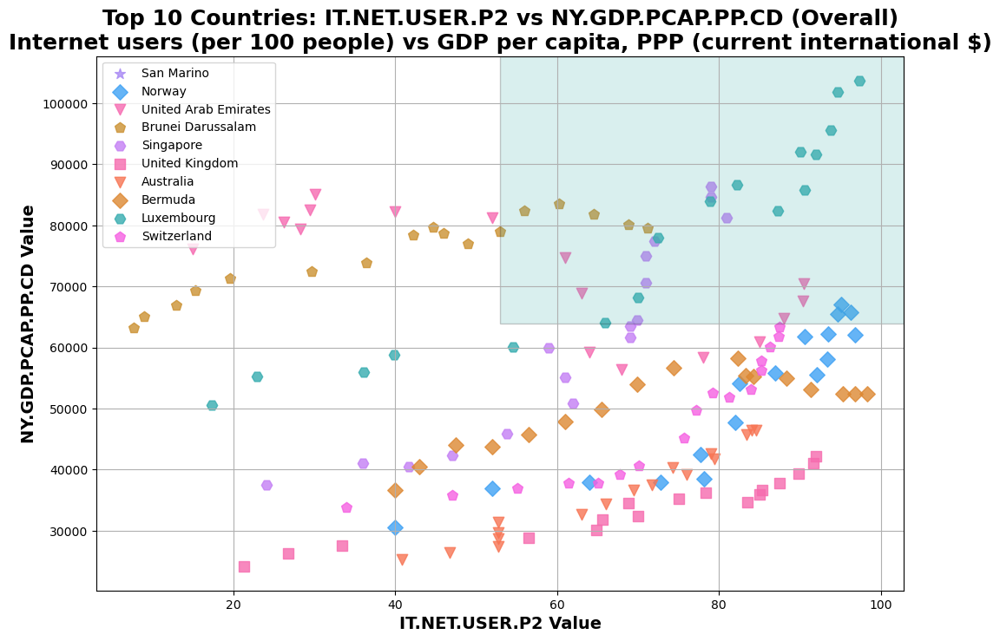

In [45]:
desiredIndicator1 = 'IT.NET.USER.P2'
desiredIndicator2= 'NY.GDP.PCAP.PP.CD'
create_bivariate_scatter_plot(df_pivoted_allYears_COUNTRIES, 10, desiredIndicator1, desiredIndicator2, list_of_COUNTRIES_Country_Name)

# Internet Users and GDP per Capita (PPP):
    # IT.NET.USER.P2 (Internet users per 100 people)
    # NY.GDP.PCAP.PP.CD (GDP per capita, PPP, current international $)
    # Interpretation: This combination considers the digital connectivity of the population (important for online education) and the 
    # economic capacity, indicating the potential purchasing power for online courses.

#Note : We want the countries in the top Right section.




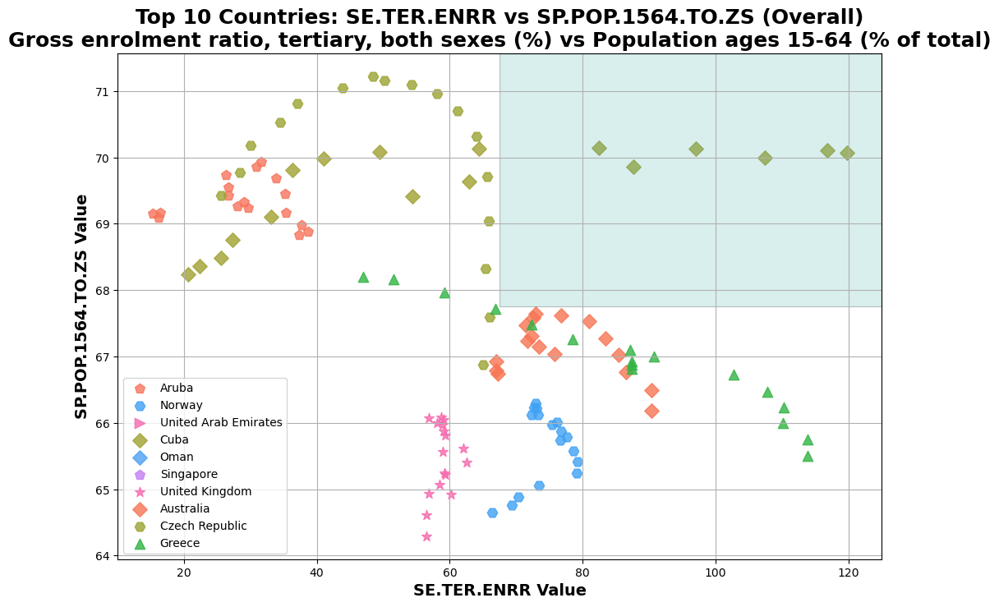

In [46]:
desiredIndicator1 = 'SE.TER.ENRR'
desiredIndicator2= 'SP.POP.1564.TO.ZS'
create_bivariate_scatter_plot(df_pivoted_allYears_COUNTRIES, 10, desiredIndicator1, desiredIndicator2, list_of_COUNTRIES_Country_Name)

# SE.TER.ENRR (Gross enrolment ratio, tertiary, both sexes %)
# SP.POP.1564.TO.ZS (Population ages 15-64 % of total)
# Interpretation: A high tertiary enrolment ratio suggests demand for higher education, and a significant working-age population indicates a potential market for both high school and university-level education.
#Internet Users and Gross Enrolment Ratio in Primary Education:

#Note : We want the countries in the top Right section (In this case, 1. Macao, 2. Hong King SAR (China), 3. Korea




## IV.3. Correlation Between Parameters <a class="anchor" id="section_5_3"></a>

In [47]:
df_pivoted_allYears_COUNTRIES['1999']

Indicator Code,IT.NET.USER.P2,NY.GDP.MKTP.CD,NY.GDP.MKTP.KD,NY.GDP.PCAP.PP.CD,NY.GNP.PCAP.CD,SE.PRE.ENRL,SE.PRM.ENRL.TC.ZS,SE.PRM.ENRR,SE.SEC.ENRR,SE.TER.ENRR,SH.DYN.MORT,SP.POP.0014.TO.ZS,SP.POP.1564.TO.ZS,SP.POP.GROW,SP.POP.TOTL,SP.TER.TOTL.IN,UIS.SLE.0
Country Name,,,,,,,,,,,,,,,,,
Afghanistan,4.72e-03,2.46e+09,8.01e+09,875.52,NaN,NaN,NaN,27.04,13.05,NaN,133.4,48.46,49.27,2.82,1.94e+07,1.70e+06,NaN
Albania,8.14e-02,3.41e+09,6.77e+09,3690.69,1010.0,8.17e+04,NaN,106.31,71.91,14.81,27.4,30.78,62.28,-0.63,3.11e+06,2.60e+05,1.27
Algeria,2.00e-01,4.86e+10,1.06e+11,7725.88,1530.0,NaN,28.19,102.38,65.28,13.65,40.3,35.41,60.40,1.41,3.08e+07,3.34e+06,NaN
American Samoa,NaN,5.14e+08,6.23e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.54,5.68e+04,NaN,NaN
Andorra,7.64e+00,1.24e+09,2.58e+09,NaN,NaN,2.44e+03,12.68,NaN,NaN,NaN,4.8,NaN,NaN,0.35,6.44e+04,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vietnam,1.29e-01,2.87e+10,5.73e+10,1948.96,370.0,2.18e+06,30.43,111.11,NaN,10.59,31.4,32.51,61.14,1.50,7.66e+07,7.65e+06,1.19
Virgin Islands (U.S.),1.11e+01,3.27e+09,3.98e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.45,65.25,0.06,1.09e+05,NaN,NaN
"Yemen, Rep.",5.66e-02,7.64e+09,1.92e+10,2923.21,370.0,NaN,NaN,NaN,NaN,NaN,99.6,49.06,48.07,2.81,1.74e+07,1.57e+06,NaN


In [48]:
# Find the min & max of each correlation matrix. (It is for getting a consistent scale for all years!!!). 

min_corr_value = float('inf')  # Initialize with a large value
max_corr_value = float('-inf')  # Initialize with a small value


for year, df in df_pivoted_allYears_COUNTRIES.items():
    correlation_matrix = df.corr()
    min_value = correlation_matrix.min().min()  # Get the minimum correlation value for the current year
    if min_value < min_corr_value:
        min_corr_value = min_value
        max_value = correlation_matrix.max().max()  # Get the maximum correlation value for the current year
    if max_value > max_corr_value:
        max_corr_value = max_value

print("Minimum correlation value across all years:", min_corr_value)
print("Maximum correlation value across all years:", max_corr_value)

Minimum correlation value across all years: -0.950250137914886
Maximum correlation value across all years: 1.0


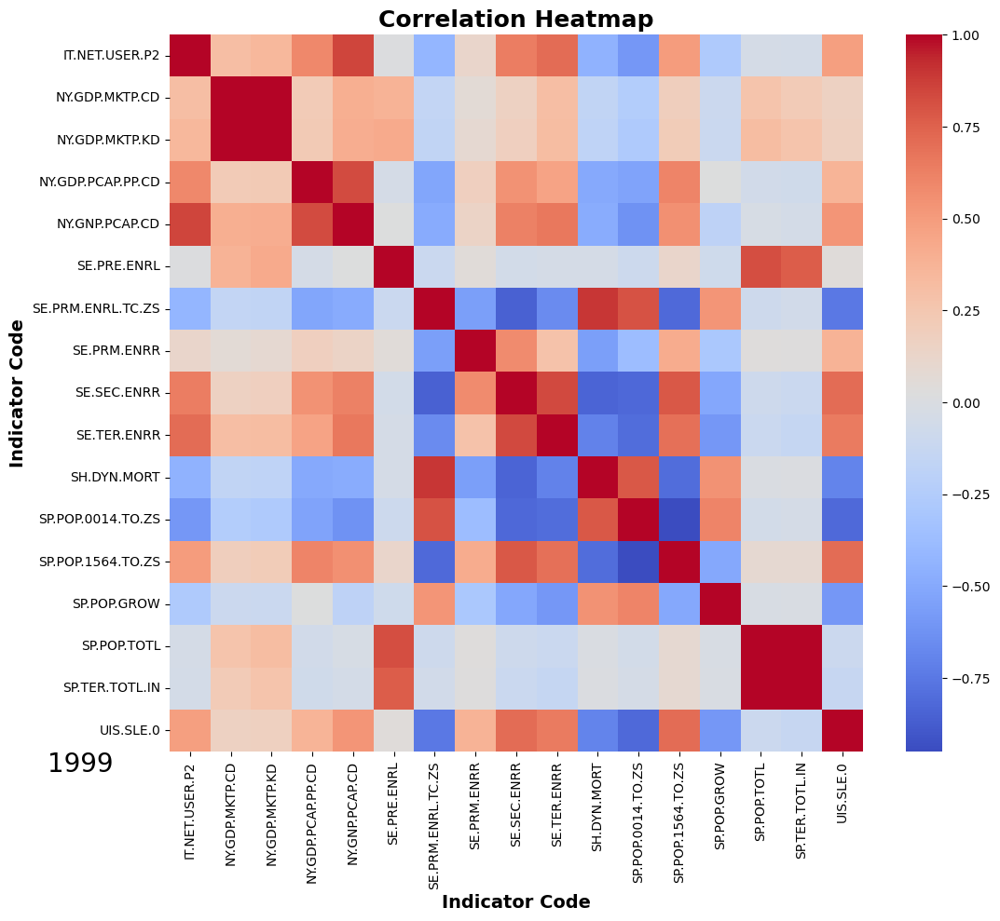

High Correlation: NY.GDP.MKTP.CD - NY.GDP.MKTP.KD = 0.99
High Correlation: SP.POP.0014.TO.ZS - SP.POP.1564.TO.ZS = -0.95
High Correlation: SP.POP.TOTL - SP.TER.TOTL.IN = 0.99


In [49]:
# ==================================================================================================
# Correlation between parameters
# ==================================================================================================
selectedYear = '1999'
correlation_matrix = df_pivoted_allYears_COUNTRIES[selectedYear].corr()

# Set a larger figure size
plt.figure(figsize=(12, 10))
heatmap  = sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", vmin=min_corr_value, vmax=max_corr_value)

# Increase fontsize for x-axis and y-axis titles
heatmap.set_xlabel(heatmap.get_xlabel(), fontsize=14, weight='bold')
heatmap.set_ylabel(heatmap.get_ylabel(), fontsize=14, weight='bold')

plt.title('Correlation Heatmap', fontsize=18, weight='bold')

# Add the year text to the bottom left corner
plt.text(-3, 17, selectedYear, fontsize=20, color='black', ha='left', va='top')

plt.show()


# Find pairs with correlation greater than 0.9 or less than -0.9
high_correlation_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        correlation = correlation_matrix.iloc[i, j]
        if abs(correlation) > 0.9:
            pair = (correlation_matrix.columns[i], correlation_matrix.columns[j], correlation)
            high_correlation_pairs.append(pair)

# Display the high correlation pairs
for pair in high_correlation_pairs:
    print(f"High Correlation: {pair[0]} - {pair[1]} = {pair[2]:.2f}")

In [50]:
import os
import imageio

# ==================================================================================================
# GIF CREATION - Correlation between parameters
# ==================================================================================================
# Output directory for saving images
output_directory = r'C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET2_Analyser_des_donnees_de_systemes_educatifs\DATA\CORRELATION_MATRIX'

# Create the directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# List to store image filenames
image_files = []

# Iterate over the years
for year in range(1999, 2016):
    selectedYear = str(year)

    # Set a larger figure size
    plt.figure(figsize=(12, 10))

    correlation_matrix = df_pivoted_allYears_COUNTRIES[selectedYear].corr()
    # sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")





    # Set a larger figure size
    heatmap  = sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", vmin=min_corr_value, vmax=max_corr_value)
    
    # Increase fontsize for x-axis and y-axis labels
    # Increase fontsize for x-axis and y-axis titles
    heatmap.set_xlabel(heatmap.get_xlabel(), fontsize=14, weight='bold')
    heatmap.set_ylabel(heatmap.get_ylabel(), fontsize=14, weight='bold')
    
    plt.title('Correlation Heatmap', fontsize=18, weight='bold')
    
    

    # Add the year text to the bottom left corner
    plt.text(-3, 18, selectedYear, fontsize=20, color='black', ha='left', va='top')

    # Save the plot
    image_filename = os.path.join(output_directory, f'correlation_matrix_{selectedYear}.png')
    plt.savefig(image_filename, dpi=300)

    # Close the plot to avoid overlapping in the GIF
    plt.close()

    # Append the image filename to the list
    image_files.append(image_filename)

# Create a GIF from the saved images
gif_filename = os.path.join(output_directory, 'correlation_matrix_animation.gif')
imageio.mimsave(gif_filename, [imageio.imread(image) for image in image_files], duration=2, loop=0)

# Display the saved GIF filename
print(f'GIF saved to: {gif_filename}')

C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\3355707539.py:57: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.mimsave(gif_filename, [imageio.imread(image) for image in image_files], duration=2, loop=0)


GIF saved to: C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET2_Analyser_des_donnees_de_systemes_educatifs\DATA\CORRELATION_MATRIX\correlation_matrix_animation.gif


In [51]:
# ==================================================================================================
# Removing redundant parameters: NY.GDP.MKTP.KD, SP.POP.0014.TO.ZS AND SP.POP.TOTL 
# ==================================================================================================

In [52]:
indicators_to_remove = ['NY.GDP.MKTP.KD', 'SP.POP.0014.TO.ZS', 'SP.POP.TOTL']

# Iterate over each year's DataFrame and drop the specified indicators
for year, df in df_pivoted_allYears_INCOME.items():
    df_pivoted_allYears_INCOME[year] = df.drop(columns=indicators_to_remove, errors='ignore')
# Iterate over each year's DataFrame and drop the specified indicators
for year, df in df_pivoted_allYears_REGIONS.items():
    df_pivoted_allYears_REGIONS[year] = df.drop(columns=indicators_to_remove, errors='ignore')
# Iterate over each year's DataFrame and drop the specified indicators
for year, df in df_pivoted_allYears_COUNTRIES.items():
    df_pivoted_allYears_COUNTRIES[year] = df.drop(columns=indicators_to_remove, errors='ignore')

# V. Scoring (Values) <a class="anchor" id="chapter6"></a>

In [53]:
def analyze_expansion_opportunities(df_all_years, show_heatmap_data, N_max):
    # Step 1: Normalize Indicators for Every Year
    normalized_dfs = {}
    for year, df_one_year in df_all_years.items():
        normalized_df = (df_one_year - df_one_year.min()) / (df_one_year.max() - df_one_year.min())
        normalized_dfs[year] = normalized_df
        normalized_dfs[year]['SH.DYN.MORT'] = 1 - normalized_dfs[year]['SH.DYN.MORT'] # A low score indicate a positive impact. 
        
    # Step 2: Weight Indicators for Every Year
    weighted_dfs = {}
    indicator_list = df_min_max_indicator_INCOME['INDICATOR'].tolist()
    indicator_equal_weights = {indicator: 1 / len(indicator_list) for indicator in indicator_list}
    for year, normalized_df in normalized_dfs.items():
        # Multiply each column by the corresponding weight
        weighted_df = normalized_df * pd.Series(indicator_equal_weights)
        weighted_dfs[year] = weighted_df

    # Step 3: Calculate Scores for Every Year
    scores = {}
    for year, weighted_df in weighted_dfs.items():
        # Sum the products of normalized values and weights for each indicator
        score = weighted_df.sum(axis=1)
        scores[year] = score

    # Step 4: Rank and Select
    top_countries_per_year = {}
    for year, score in scores.items():
        # Rank countries based on scores (ascending=False for descending order)
        ranked_countries = score.rank(ascending=False)
        
        # Select the top N countries (adjust N as needed)
        top_n_countries = ranked_countries.head(N_max)
        
        top_countries_per_year[year] = top_n_countries

    # Combine the results for all years and get the scores for each country
    overall_top_countries_with_scores = pd.concat([scores[year].loc[top_countries_per_year[year].index] for year in top_countries_per_year.keys()], axis=1)

    # Add a column for the average score across all years
    overall_top_countries_with_scores['Average Score'] = overall_top_countries_with_scores.mean(axis=1)

    # Sort the DataFrame based on the average score in descending order
    overall_top_countries_with_scores_sorted = overall_top_countries_with_scores.sort_values(by='Average Score', ascending=False)

    # Replace the column indices with indicator names
    overall_top_countries_with_scores_sorted.columns = [f'{year}' for year in range(1999, 2016)] + ['Average Score']

    # Display the resulting DataFrame
    if show_heatmap_data==True:
        print(overall_top_countries_with_scores_sorted)
    else:
        print(overall_top_countries_with_scores_sorted['Average Score'])


    # Exclude the 'Average Score' column for the heatmap
    heatmap_data = overall_top_countries_with_scores_sorted.iloc[:, :-1]

    # Set up the figure and axis
    plt.figure(figsize=(12, 8))
    ax = sns.heatmap(heatmap_data, cmap='coolwarm', annot=False, fmt=".2f", linewidths=.5, cbar_kws={'label': 'Indicator Score'})

    # Increase font size for better readability
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)
    plt.title('Average Indicator Scores for Top Countries (1999-2015)', fontsize=18, weight='bold')
    plt.xlabel('Year', fontsize=14, weight='bold')
    plt.ylabel('Country Name', fontsize=14, weight='bold')

    # Add a color bar
    cbar = ax.collections[0].colorbar
    cbar.set_label('Average Indicator Score', fontsize=14, weight='bold')

    # Show the plot
    plt.show()

    return overall_top_countries_with_scores_sorted



Country Name
High income            0.56
Upper middle income    0.39
Middle income          0.37
Low & middle income    0.36
Lower middle income    0.24
Low income             0.12
Name: Average Score, dtype: float64


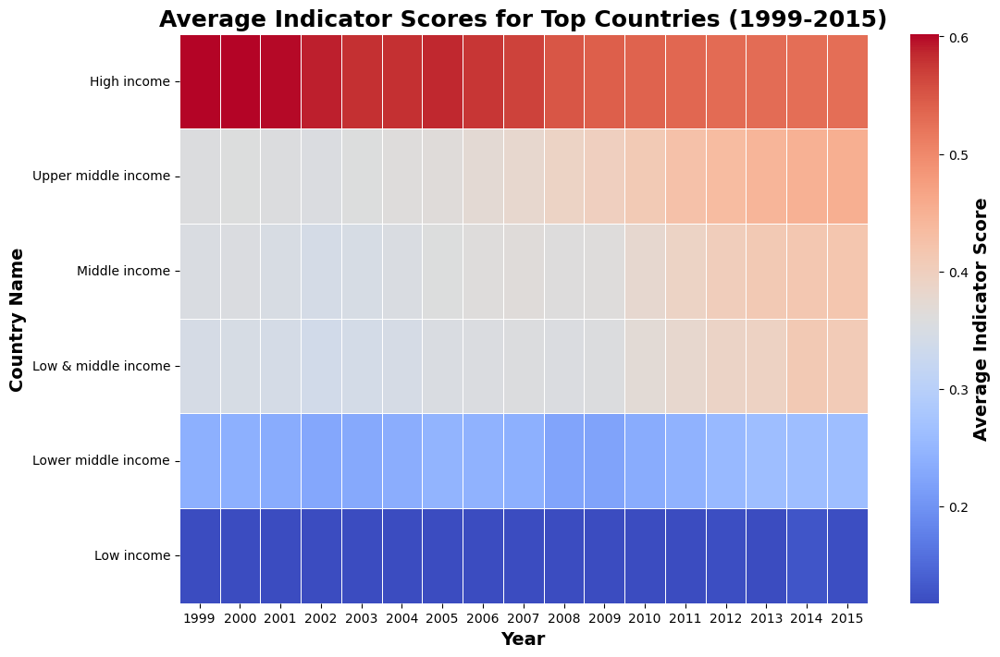

In [54]:
# result = analyze_expansion_opportunities(df_pivoted_allYears_INCOME, False, N_max)
results_INCOME = analyze_expansion_opportunities(df_pivoted_allYears_INCOME, False, len(list_of_INCOME_Country_Name))





Country Name
OECD members                                          0.55
North America                                         0.51
Euro area                                             0.47
European Union                                        0.47
Europe & Central Asia                                 0.44
East Asia & Pacific                                   0.42
East Asia & Pacific (excluding high income)           0.38
Latin America & Caribbean                             0.38
Latin America & Caribbean (excluding high income)     0.37
Europe & Central Asia (excluding high income)         0.32
Middle East & North Africa                            0.28
South Asia                                            0.27
Middle East & North Africa (excluding high income)    0.26
West Bank and Gaza                                    0.24
Arab World                                            0.23
South Africa                                          0.22
Least developed countries: UN classificatio

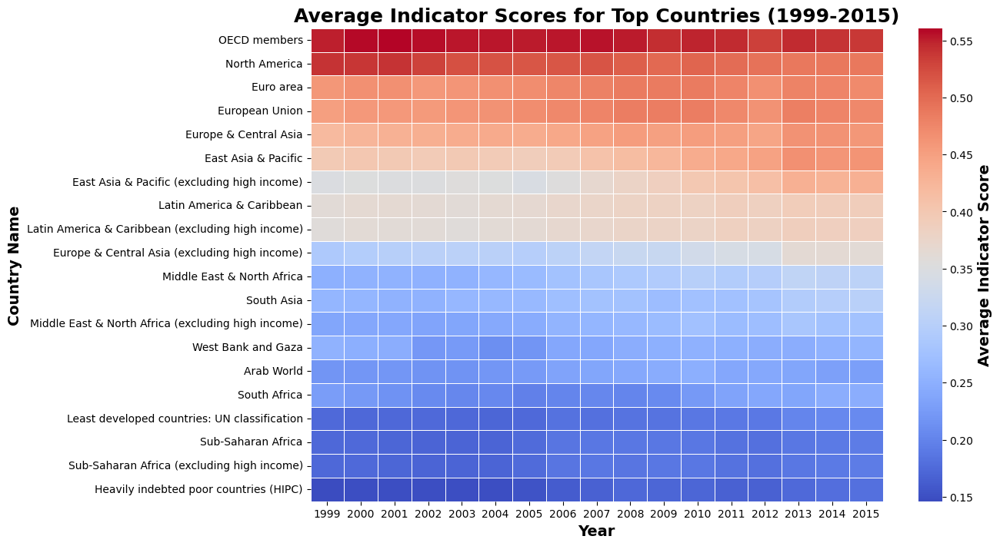

In [55]:
# result = analyze_expansion_opportunities(df_pivoted_allYears_REGIONS, True, N_max)
results_REGIONS = analyze_expansion_opportunities(df_pivoted_allYears_REGIONS, False, len(list_of_REGIONS_Country_Name))


Country Name
United States               4.59e-01
Sweden                      4.02e-01
Denmark                     3.99e-01
Finland                     3.86e-01
Japan                       3.86e-01
                              ...   
St. Martin (French part)    1.51e-02
Northern Mariana Islands    1.17e-02
Somalia                     1.13e-02
Kosovo                      3.24e-03
Nauru                       0.00e+00
Name: Average Score, Length: 213, dtype: float64


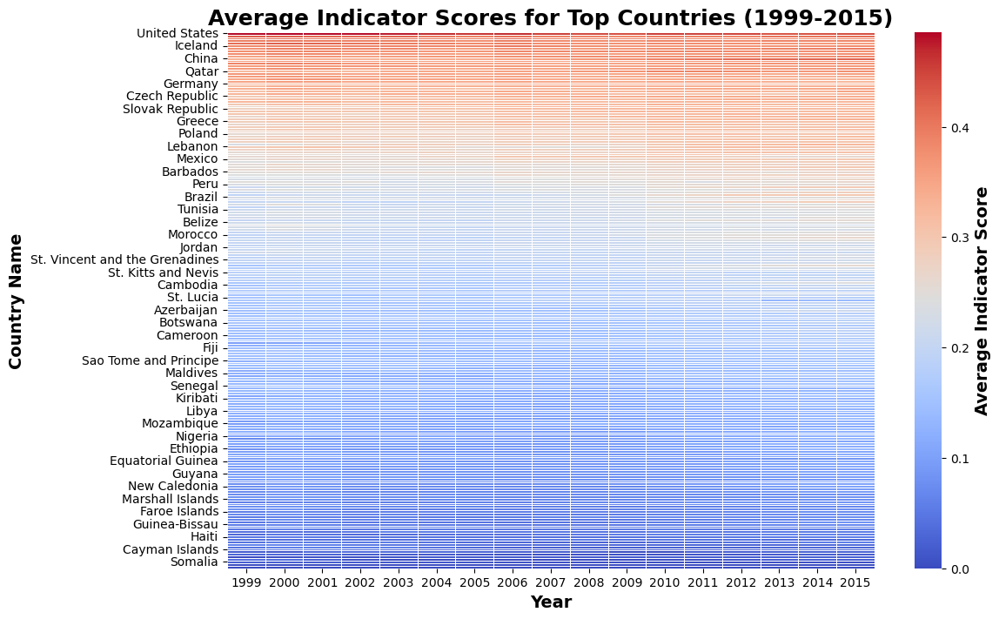

In [56]:
# result = analyze_expansion_opportunities(df_pivoted_allYears_COUNTRIES, True, N_max)
results_COUNTRIES = analyze_expansion_opportunities(df_pivoted_allYears_COUNTRIES, False, len(list_of_COUNTRIES_Country_Name))

<div class="alert alert-block alert-info">
We can see that the average indicator score is variating a lot based on the year.
For the REGIONS, we can see a big positive progression of some regions like 1. East Asia & Pacific (excluding high income), 2. Latin America & 3. Caribbean, Latin America & Caribbean (excluding high income). 

--> It suggest that these regions may be profitable regions in the future. 

In the contrary, the average indicator score for the selected regions 1. OECD members and 2. North America tend to decrease with time. 

CONCLUSION : IT MAY BE PROFITABLE to check the growth rate of the region and to re-score based on that OR simply to do regression on the existing score.  
This conclusion is similar for INCOME and COUNTRIES group as well.
</div>

In [57]:
# Get the TOP X of each dictionnary of dataframe (FOR INCOME, REGIONS & COUNTRIES)

# df_pivoted_allYears_INCOME_TOP3 = {year: df.loc[['High income', 'Low & middle income', 'Middle income']] for year, df in df_pivoted_allYears_INCOME.items()}
# df_pivoted_allYears_REGIONS_TOP5 = {year: df.loc[['OECD members', 'North America', 'Euro area', 'European Union', 'Europe & Central Asia']] for year, df in df_pivoted_allYears_REGIONS.items()}
# df_pivoted_allYears_COUNTRIES_TOP5 = {year: df.loc[['United States', 'Sweden', 'Denmark', 'Japan', 'Finland']] for year, df in df_pivoted_allYears_COUNTRIES.items()}


## V.1 Verification of Some Hypothesis <a class="anchor" id="section_6_1"></a>

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN befo

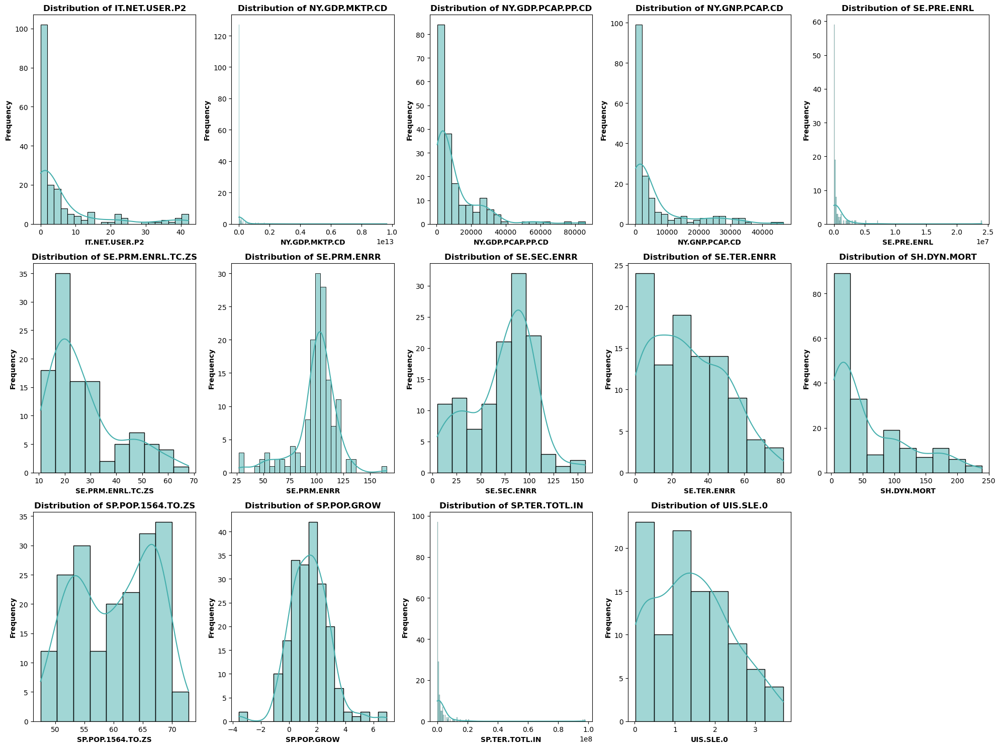

In [58]:
# ==================================================================================================
# Verification of the normalization method
# ==================================================================================================
# If the KDE suggests a roughly normal distribution, z-score normalization might be suitable.
# If the distribution is skewed, min-max scaling might be preferable. 

# Check distribution of all columns so we know if the normalization method used (min-max) is good. 
df_one_year = df_pivoted_allYears_COUNTRIES['1999']

num_cols = len(df_one_year.columns)
num_rows = (num_cols - 1) // 5 + 1

fig, axes = plt.subplots(nrows=num_rows, ncols=5, figsize=(20, 15))
axes = axes.flatten()

for i, indicator in enumerate(df_one_year.columns):
    sns.histplot(df_one_year[indicator], kde=True, ax=axes[i], color=(69/255, 175/255, 173/255))
    axes[i].set_title(f'Distribution of {indicator}', weight='bold')
    axes[i].set_xlabel(indicator, weight='bold')
    axes[i].set_ylabel('Frequency', weight='bold')
    # axes[i].set(xlabel=indicator, ylabel='Frequency')

[fig.delaxes(ax) for ax in axes[num_cols:]]  # Remove any empty subplots

plt.tight_layout()
plt.show()

# ==================================================================================================

## V.2 Are The Countries I choosed Still Good Countries in the Future ? <a class="anchor" id="section_6_2"></a>

In [59]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

def polynomial_interpolation(X, y, degree):
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(X)
    
    model = LinearRegression()
    model.fit(X_poly, y)
    
    return model, poly_features


def interpolate_and_predict(results_INCOME, R2_threshold=0.9):
    # Create an empty DataFrame to store predicted values
    predicted_values = pd.DataFrame(index=results_INCOME.index, columns=np.arange(2016, 2031))
    country_r2_scores = {}  # Dictionary to store country-wise R² scores

    
    for country in results_INCOME.index:
        print(f"\nInterpolating for {country}...")
        
        X = np.array(results_INCOME.columns[:-1]).astype(float).reshape(-1, 1)
        y = results_INCOME.loc[country, results_INCOME.columns[:-1]].values
        
        degree = 1  
        best_degree = 1
        best_r2 = 0
        r2_scores = {}  # Dictionary to store R² scores for each degree
        
        while degree <= 10:
            print(f"Trying polynomial degree: {degree}")
            
            poly_features = PolynomialFeatures(degree=degree)
            X_poly = poly_features.fit_transform(X)
            
            model = LinearRegression()
            model.fit(X_poly, y)
            
            y_pred = model.predict(poly_features.transform(X))
            
            r2 = round(r2_score(y, y_pred), 2 )
            print(f"R² for degree {degree}: {r2}")
            
            r2_scores[degree] = r2  # Store R² score for this degree
            
            if r2 >= R2_threshold:
                print(f"R² is equal or greater than 0.9. Plotting polynomial interpolation...")
                
                # Select the degree with the maximum R² score
                best_degree = max(r2_scores, key=r2_scores.get)
                
                # Polynomial interpolation using the best degree
                model_poly, poly_features = polynomial_interpolation(X, y, best_degree)
                X_poly_new = poly_features.fit_transform(X.flatten().reshape(-1, 1))
                y_poly_pred = model_poly.predict(X_poly_new)
                    
                # Predict values for the years 2016 to 2030 using polynomial
                X_pred_poly = np.arange(2016, 2031)
                X_pred_poly_new = poly_features.fit_transform(X_pred_poly.reshape(-1, 1))
                y_pred_poly = model_poly.predict(X_pred_poly_new)
                
                # Print predicted values
                print(f'Predicted Polynomial values:')
                print(y_pred_poly)
    
                # Store predicted values in the DataFrame
                predicted_values.loc[country] = y_pred_poly
    
                    
                break  # exit the loop if R² is satisfactory
            
            degree += 1  # increase the degree
    
        print("R² scores for each degree:")
        print(r2_scores)
        best_degree_forR2_inf_09 = max(r2_scores, key=r2_scores.get)
        print("Best degree for maxizing R2 score:")
        print(best_degree_forR2_inf_09)

        # Store the country and its corresponding R² score
        country_r2_scores[country] =  r2_scores.get(best_degree_forR2_inf_09)
    
        # Plot using the best degree obtained
        if best_degree_forR2_inf_09 > 1:  # Check if the best degree is greater than 1
            print(f"Plotting polynomial interpolation using best degree {best_degree_forR2_inf_09}...")
            
            # Polynomial interpolation using the best degree
            model_poly2, poly_features2 = polynomial_interpolation(X, y, best_degree_forR2_inf_09)
            X_poly_new = poly_features2.fit_transform(X.flatten().reshape(-1, 1))
            y_poly_pred = model_poly2.predict(X_poly_new)
            
            # Predict values for the years 2016 to 2030 using polynomial
            X_pred_poly = np.arange(2016, 2031)
            X_pred_poly_new = poly_features2.fit_transform(X_pred_poly.reshape(-1, 1))
            y_pred_poly = model_poly2.predict(X_pred_poly_new)
            
            # Plot combined graph
            plt.plot(X.flatten(), y, 'o', label='Original Data')
            plt.plot(X.flatten(), y_poly_pred, label=f'Polynomial Interpolation (Degree {best_degree_forR2_inf_09})', color='red')
            plt.plot(X_pred_poly, y_pred_poly, label=f'Polynomial Prediction (2016 to 2030) - R²: {r2_scores[best_degree_forR2_inf_09]:.2f}', color='blue', linestyle='dashed')
            plt.xlabel('Year')
            plt.ylabel('Average Score')
            plt.title(f'Polynomial Interpolation and Prediction for {country}')
            plt.legend()
            plt.show()
            
            # Print predicted values
            print(f'Predicted Polynomial values:')
            print(y_pred_poly)
            # Store predicted values in the DataFrame
            predicted_values.loc[country] = y_pred_poly

    predicted_values['Average Score'] = predicted_values.mean(axis=1)
    print("\nInterpolation completed.")
    return predicted_values, country_r2_scores


Interpolating for High income...
Trying polynomial degree: 1
R² for degree 1: 0.95
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.51339439 0.50790816 0.50242192 0.49693568 0.49144944 0.4859632
 0.48047696 0.47499072 0.46950448 0.46401824 0.458532   0.45304577
 0.44755953 0.44207329 0.43658705]
R² scores for each degree:
{1: 0.95}
Best degree for maxizing R2 score:
1

Interpolating for Upper middle income...
Trying polynomial degree: 1
R² for degree 1: 0.92
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.45523674 0.46220296 0.46916918 0.4761354  0.48310162 0.49006784
 0.49703406 0.50400028 0.5109665  0.51793272 0.52489894 0.53186516
 0.53883138 0.54579759 0.55276381]
R² scores for each degree:
{1: 0.92}
Best degree for maxizing R2 score:
1

Interpolating for Middle income...
Trying polynomial degree: 1
R² for degree 1: 0.83
Trying polynomial degree: 2
R² for degree 2: 0.96
R² is

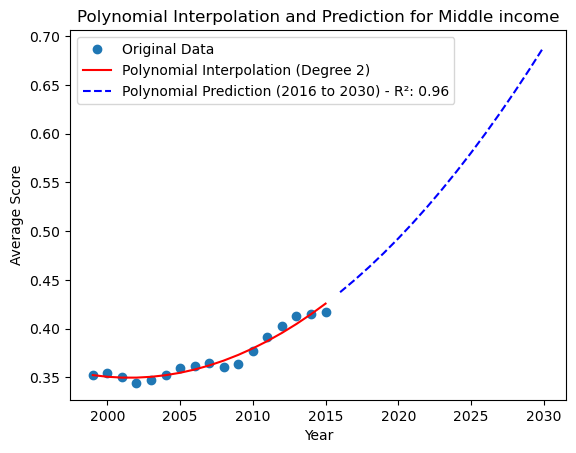

Predicted Polynomial values:
[0.43741221 0.44994705 0.46331871 0.4775272  0.49257251 0.50845465
 0.52517361 0.5427294  0.56112201 0.58035145 0.60041771 0.6213208
 0.64306071 0.66563744 0.689051  ]

Interpolating for Low & middle income...
Trying polynomial degree: 1
R² for degree 1: 0.83
Trying polynomial degree: 2
R² for degree 2: 0.97
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.42504669 0.43687876 0.44951204 0.46294652 0.47718221 0.49221911
 0.5080572  0.52469651 0.54213702 0.56037873 0.57942165 0.59926577
 0.6199111  0.64135764 0.66360537]
R² scores for each degree:
{1: 0.83, 2: 0.97}
Best degree for maxizing R2 score:
2
Plotting polynomial interpolation using best degree 2...


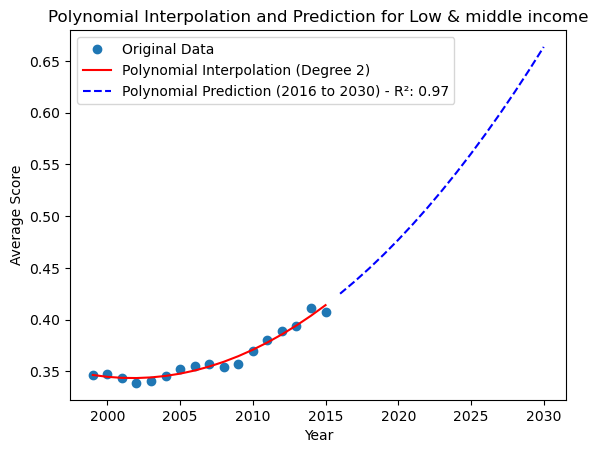

Predicted Polynomial values:
[0.42504669 0.43687876 0.44951204 0.46294652 0.47718221 0.49221911
 0.5080572  0.52469651 0.54213702 0.56037873 0.57942165 0.59926577
 0.6199111  0.64135764 0.66360537]

Interpolating for Lower middle income...
Trying polynomial degree: 1
R² for degree 1: 0.36
Trying polynomial degree: 2
R² for degree 2: 0.63
Trying polynomial degree: 3
R² for degree 3: 0.64
Trying polynomial degree: 4
R² for degree 4: 0.64
Trying polynomial degree: 5
R² for degree 5: 0.64
Trying polynomial degree: 6
R² for degree 6: 0.64
Trying polynomial degree: 7
R² for degree 7: 0.64
Trying polynomial degree: 8
R² for degree 8: 0.64
Trying polynomial degree: 9
R² for degree 9: 0.64
Trying polynomial degree: 10
R² for degree 10: 0.64
R² scores for each degree:
{1: 0.36, 2: 0.63, 3: 0.64, 4: 0.64, 5: 0.64, 6: 0.64, 7: 0.64, 8: 0.64, 9: 0.64, 10: 0.64}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


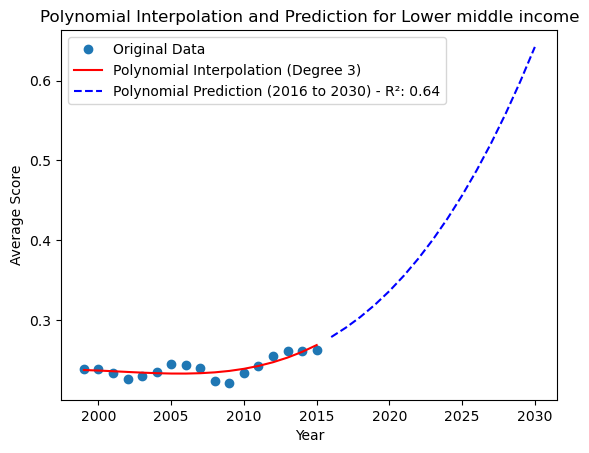

Predicted Polynomial values:
[0.2789282  0.29060133 0.30401767 0.31929029 0.33653222 0.35585652
 0.37737624 0.40120443 0.42745414 0.45623842 0.48767033 0.52186291
 0.55892921 0.59898229 0.6421352 ]

Interpolating for Low income...
Trying polynomial degree: 1
R² for degree 1: 0.32
Trying polynomial degree: 2
R² for degree 2: 0.5
Trying polynomial degree: 3
R² for degree 3: 0.52
Trying polynomial degree: 4
R² for degree 4: 0.52
Trying polynomial degree: 5
R² for degree 5: 0.52
Trying polynomial degree: 6
R² for degree 6: 0.52
Trying polynomial degree: 7
R² for degree 7: 0.52
Trying polynomial degree: 8
R² for degree 8: 0.52
Trying polynomial degree: 9
R² for degree 9: 0.52
Trying polynomial degree: 10
R² for degree 10: 0.52
R² scores for each degree:
{1: 0.32, 2: 0.5, 3: 0.52, 4: 0.52, 5: 0.52, 6: 0.52, 7: 0.52, 8: 0.52, 9: 0.52, 10: 0.52}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


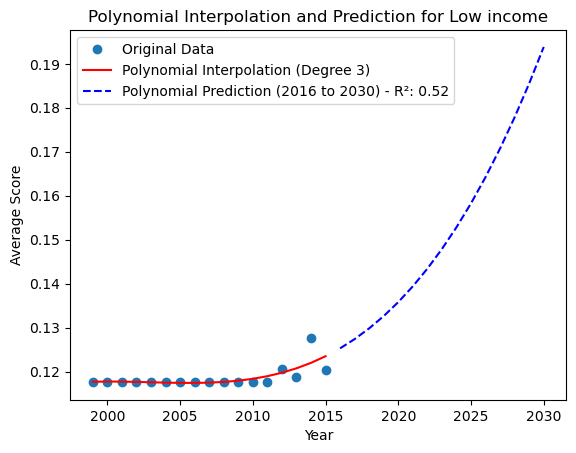

Predicted Polynomial values:
[0.12528181 0.12738613 0.12982505 0.13262232 0.1358017  0.13938695
 0.1434018  0.14787004 0.1528154  0.15826164 0.16423252 0.17075179
 0.17784321 0.18553053 0.19383752]

Interpolation completed.


In [60]:
predicted_results_INCOME, country_r2_scores_INCOME = interpolate_and_predict(results_INCOME, 0.9)

In [61]:
country_r2_scores_INCOME
# Get mean value of country_r2_scores_INCOME
mean_value = np.mean(list(country_r2_scores_INCOME.values()))
print("Mean value:", mean_value)

Mean value: 0.8266666666666665



Interpolating for OECD members...
Trying polynomial degree: 1
R² for degree 1: 0.68
Trying polynomial degree: 2
R² for degree 2: 0.73
Trying polynomial degree: 3
R² for degree 3: 0.75
Trying polynomial degree: 4
R² for degree 4: 0.75
Trying polynomial degree: 5
R² for degree 5: 0.75
Trying polynomial degree: 6
R² for degree 6: 0.75
Trying polynomial degree: 7
R² for degree 7: 0.75
Trying polynomial degree: 8
R² for degree 8: 0.75
Trying polynomial degree: 9
R² for degree 9: 0.75
Trying polynomial degree: 10
R² for degree 10: 0.75
R² scores for each degree:
{1: 0.68, 2: 0.73, 3: 0.75, 4: 0.75, 5: 0.75, 6: 0.75, 7: 0.75, 8: 0.75, 9: 0.75, 10: 0.75}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


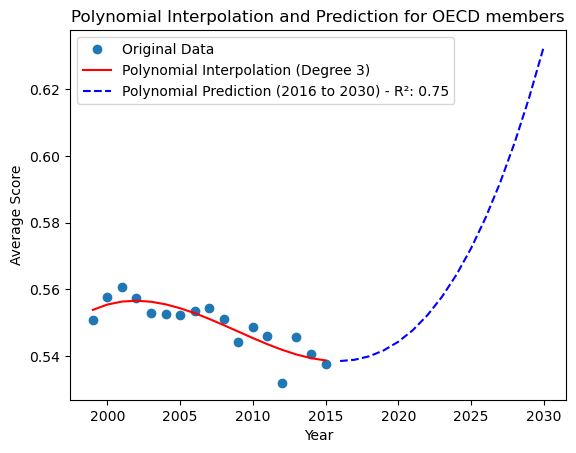

Predicted Polynomial values:
[0.5384488  0.5388342  0.53987325 0.54164658 0.54423481 0.54771855
 0.55217843 0.55769507 0.56434908 0.57222109 0.58139171 0.59194156
 0.60395127 0.61750145 0.63267273]

Interpolating for North America...
Trying polynomial degree: 1
R² for degree 1: 0.96
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.48110938 0.47760329 0.4740972  0.47059111 0.46708502 0.46357893
 0.46007284 0.45656675 0.45306066 0.44955457 0.44604849 0.4425424
 0.43903631 0.43553022 0.43202413]
R² scores for each degree:
{1: 0.96}
Best degree for maxizing R2 score:
1

Interpolating for Euro area...
Trying polynomial degree: 1
R² for degree 1: 0.39
Trying polynomial degree: 2
R² for degree 2: 0.57
Trying polynomial degree: 3
R² for degree 3: 0.66
Trying polynomial degree: 4
R² for degree 4: 0.66
Trying polynomial degree: 5
R² for degree 5: 0.66
Trying polynomial degree: 6
R² for degree 6: 0.66
Trying polynomial degree: 7
R² for degree 7

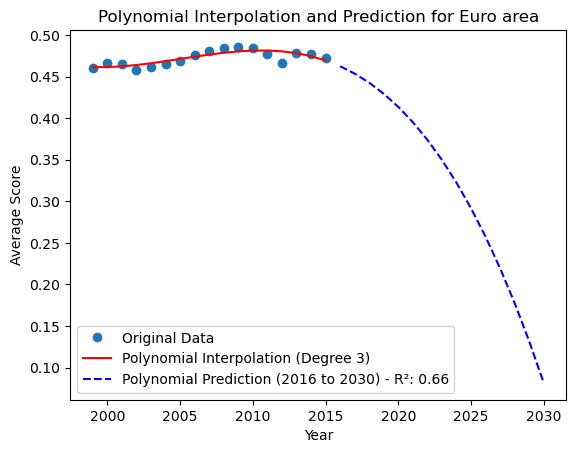

Predicted Polynomial values:
[0.46254315 0.45366343 0.4426704  0.42938723 0.41363709 0.39524315
 0.37402858 0.34981655 0.32243023 0.2916928  0.25742742 0.21945727
 0.17760551 0.13169531 0.08154986]

Interpolating for European Union...
Trying polynomial degree: 1
R² for degree 1: 0.58
Trying polynomial degree: 2
R² for degree 2: 0.76
Trying polynomial degree: 3
R² for degree 3: 0.78
Trying polynomial degree: 4
R² for degree 4: 0.78
Trying polynomial degree: 5
R² for degree 5: 0.78
Trying polynomial degree: 6
R² for degree 6: 0.78
Trying polynomial degree: 7
R² for degree 7: 0.78
Trying polynomial degree: 8
R² for degree 8: 0.78
Trying polynomial degree: 9
R² for degree 9: 0.78
Trying polynomial degree: 10
R² for degree 10: 0.78
R² scores for each degree:
{1: 0.58, 2: 0.76, 3: 0.78, 4: 0.78, 5: 0.78, 6: 0.78, 7: 0.78, 8: 0.78, 9: 0.78, 10: 0.78}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


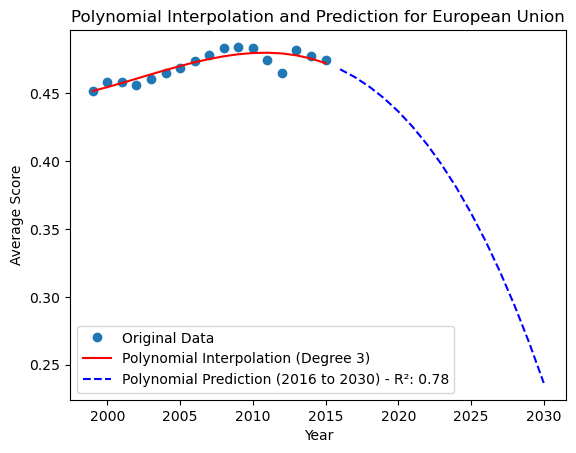

Predicted Polynomial values:
[0.46776803 0.46204169 0.45501165 0.44658902 0.43668495 0.42521055
 0.41207696 0.39719531 0.38047673 0.36183235 0.34117329 0.31841069
 0.29345568 0.26621939 0.23661294]

Interpolating for Europe & Central Asia...
Trying polynomial degree: 1
R² for degree 1: 0.88
Trying polynomial degree: 2
R² for degree 2: 0.9
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.46190385 0.46287702 0.46369598 0.46436074 0.4648713  0.46522767
 0.46542983 0.4654778  0.46537156 0.46511113 0.4646965  0.46412766
 0.46340463 0.4625274  0.46149597]
R² scores for each degree:
{1: 0.88, 2: 0.9}
Best degree for maxizing R2 score:
2
Plotting polynomial interpolation using best degree 2...


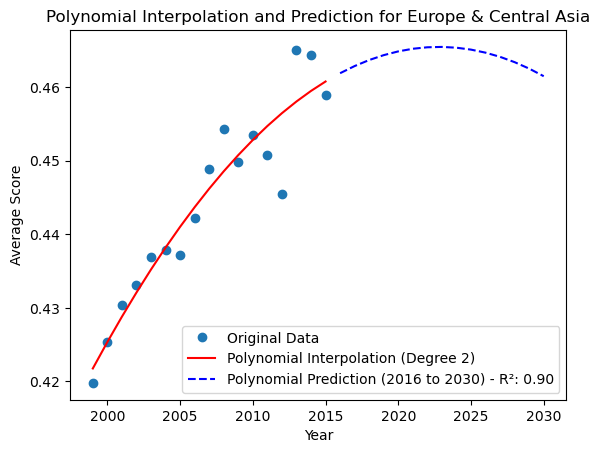

Predicted Polynomial values:
[0.46190385 0.46287702 0.46369598 0.46436074 0.4648713  0.46522767
 0.46542983 0.4654778  0.46537156 0.46511113 0.4646965  0.46412766
 0.46340463 0.4625274  0.46149597]

Interpolating for East Asia & Pacific...
Trying polynomial degree: 1
R² for degree 1: 0.83
Trying polynomial degree: 2
R² for degree 2: 0.94
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.48797287 0.50093362 0.51473693 0.52938281 0.54487125 0.56120226
 0.57837584 0.59639199 0.61525071 0.63495199 0.65549584 0.67688225
 0.69911124 0.72218279 0.74609691]
R² scores for each degree:
{1: 0.83, 2: 0.94}
Best degree for maxizing R2 score:
2
Plotting polynomial interpolation using best degree 2...


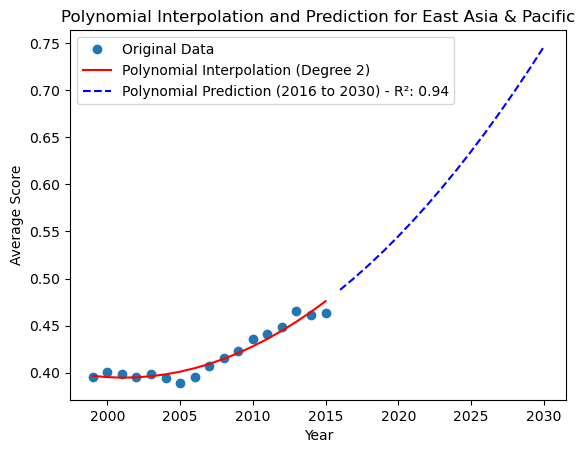

Predicted Polynomial values:
[0.48797287 0.50093362 0.51473693 0.52938281 0.54487125 0.56120226
 0.57837584 0.59639199 0.61525071 0.63495199 0.65549584 0.67688225
 0.69911124 0.72218279 0.74609691]

Interpolating for East Asia & Pacific (excluding high income)...
Trying polynomial degree: 1
R² for degree 1: 0.88
Trying polynomial degree: 2
R² for degree 2: 0.96
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.45678764 0.47051386 0.48505895 0.50042293 0.51660578 0.5336075
 0.5514281  0.57006758 0.58952593 0.60980316 0.63089927 0.65281425
 0.67554811 0.69910084 0.72347245]
R² scores for each degree:
{1: 0.88, 2: 0.96}
Best degree for maxizing R2 score:
2
Plotting polynomial interpolation using best degree 2...


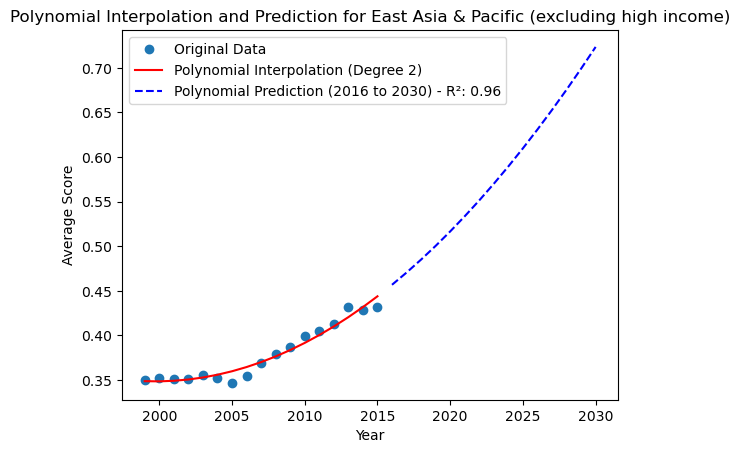

Predicted Polynomial values:
[0.45678764 0.47051386 0.48505895 0.50042293 0.51660578 0.5336075
 0.5514281  0.57006758 0.58952593 0.60980316 0.63089927 0.65281425
 0.67554811 0.69910084 0.72347245]

Interpolating for Latin America & Caribbean...
Trying polynomial degree: 1
R² for degree 1: 0.92
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.39478369 0.39690995 0.39903621 0.40116247 0.40328873 0.405415
 0.40754126 0.40966752 0.41179378 0.41392004 0.4160463  0.41817256
 0.42029882 0.42242508 0.42455134]
R² scores for each degree:
{1: 0.92}
Best degree for maxizing R2 score:
1

Interpolating for Latin America & Caribbean (excluding high income)...
Trying polynomial degree: 1
R² for degree 1: 0.92
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.39199754 0.39417385 0.39635016 0.39852647 0.40070277 0.40287908
 0.40505539 0.4072317  0.40940801 0.41158432 0.41376063 0.41593694
 0.4181132

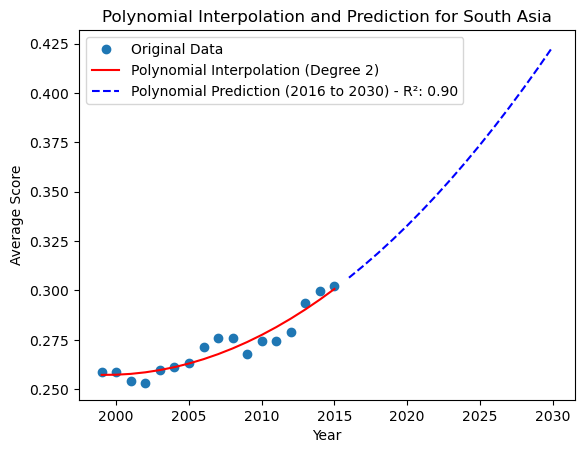

Predicted Polynomial values:
[0.3064583  0.31251791 0.31892925 0.3256923  0.33280707 0.34027355
 0.34809176 0.35626168 0.36478332 0.37365667 0.38288175 0.39245854
 0.40238705 0.41266728 0.42329923]

Interpolating for Middle East & North Africa (excluding high income)...
Trying polynomial degree: 1
R² for degree 1: 0.92
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.28510272 0.28823688 0.29137105 0.29450521 0.29763937 0.30077353
 0.3039077  0.30704186 0.31017602 0.31331018 0.31644435 0.31957851
 0.32271267 0.32584683 0.328981  ]
R² scores for each degree:
{1: 0.92}
Best degree for maxizing R2 score:
1

Interpolating for West Bank and Gaza...
Trying polynomial degree: 1
R² for degree 1: 0.18
Trying polynomial degree: 2
R² for degree 2: 0.4
Trying polynomial degree: 3
R² for degree 3: 0.71
Trying polynomial degree: 4
R² for degree 4: 0.71
Trying polynomial degree: 5
R² for degree 5: 0.71
Trying polynomial degree: 6
R² for degree 6: 0.

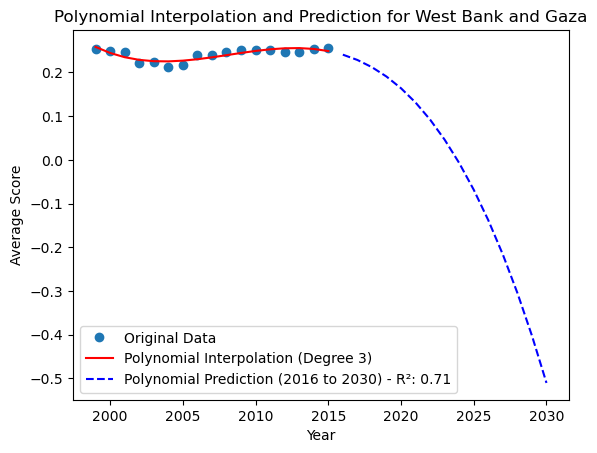

Predicted Polynomial values:
[ 0.24055106  0.22842058  0.21190072  0.19049295  0.16369876  0.13101962
  0.09195703  0.04601245 -0.00731263 -0.06851673 -0.13809836 -0.21655606
 -0.30438834 -0.40209371 -0.5101707 ]

Interpolating for Arab World...
Trying polynomial degree: 1
R² for degree 1: 0.51
Trying polynomial degree: 2
R² for degree 2: 0.68
Trying polynomial degree: 3
R² for degree 3: 0.9
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[ 0.21448403  0.19978229  0.18140391  0.15902086  0.13230513  0.10092869
  0.0645635   0.02288156 -0.02444516 -0.07774469 -0.13734506 -0.20357427
 -0.27676037 -0.35723136 -0.44531528]
R² scores for each degree:
{1: 0.51, 2: 0.68, 3: 0.9}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


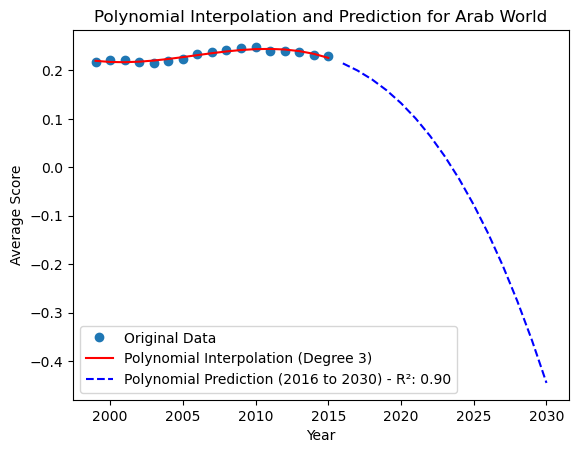

Predicted Polynomial values:
[ 0.21448403  0.19978229  0.18140391  0.15902086  0.13230513  0.10092869
  0.0645635   0.02288156 -0.02444516 -0.07774469 -0.13734506 -0.20357427
 -0.27676037 -0.35723136 -0.44531528]

Interpolating for South Africa...
Trying polynomial degree: 1
R² for degree 1: 0.34
Trying polynomial degree: 2
R² for degree 2: 0.89
Trying polynomial degree: 3
R² for degree 3: 0.93
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.25580282 0.25958484 0.26211718 0.26316002 0.26247353 0.25981789
 0.25495329 0.2476399  0.2376379  0.22470747 0.20860879 0.18910204
 0.16594739 0.13890503 0.10773514]
R² scores for each degree:
{1: 0.34, 2: 0.89, 3: 0.93}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


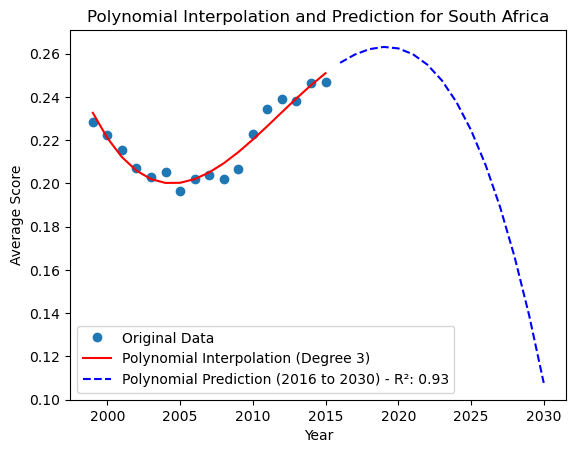

Predicted Polynomial values:
[0.25580282 0.25958484 0.26211718 0.26316002 0.26247353 0.25981789
 0.25495329 0.2476399  0.2376379  0.22470747 0.20860879 0.18910204
 0.16594739 0.13890503 0.10773514]

Interpolating for Least developed countries: UN classification...
Trying polynomial degree: 1
R² for degree 1: 0.85
Trying polynomial degree: 2
R² for degree 2: 0.96
R² is equal or greater than 0.9. Plotting polynomial interpolation...
Predicted Polynomial values:
[0.21313238 0.21862674 0.22447196 0.23066805 0.23721501 0.24411283
 0.25136152 0.25896108 0.2669115  0.27521279 0.28386495 0.29286797
 0.30222186 0.31192662 0.32198224]
R² scores for each degree:
{1: 0.85, 2: 0.96}
Best degree for maxizing R2 score:
2
Plotting polynomial interpolation using best degree 2...


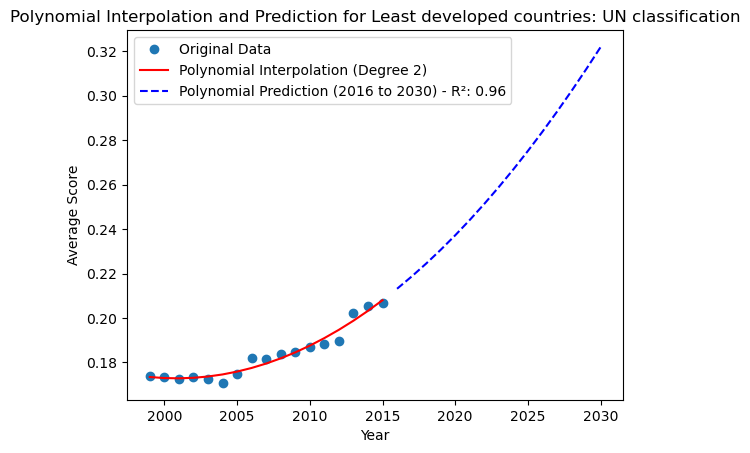

Predicted Polynomial values:
[0.21313238 0.21862674 0.22447196 0.23066805 0.23721501 0.24411283
 0.25136152 0.25896108 0.2669115  0.27521279 0.28386495 0.29286797
 0.30222186 0.31192662 0.32198224]

Interpolating for Sub-Saharan Africa...
Trying polynomial degree: 1
R² for degree 1: 0.73
Trying polynomial degree: 2
R² for degree 2: 0.73
Trying polynomial degree: 3
R² for degree 3: 0.75
Trying polynomial degree: 4
R² for degree 4: 0.75
Trying polynomial degree: 5
R² for degree 5: 0.75
Trying polynomial degree: 6
R² for degree 6: 0.75
Trying polynomial degree: 7
R² for degree 7: 0.75
Trying polynomial degree: 8
R² for degree 8: 0.75
Trying polynomial degree: 9
R² for degree 9: 0.75
Trying polynomial degree: 10
R² for degree 10: 0.75
R² scores for each degree:
{1: 0.73, 2: 0.73, 3: 0.75, 4: 0.75, 5: 0.75, 6: 0.75, 7: 0.75, 8: 0.75, 9: 0.75, 10: 0.75}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


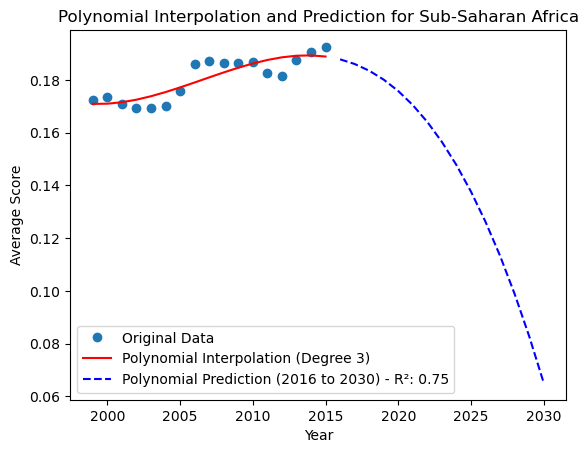

Predicted Polynomial values:
[0.18786428 0.18609775 0.18355198 0.18015236 0.1758243  0.17049319
 0.16408442 0.15652338 0.14773549 0.13764613 0.12618069 0.11326458
 0.09882319 0.08278192 0.06506616]

Interpolating for Sub-Saharan Africa (excluding high income)...
Trying polynomial degree: 1
R² for degree 1: 0.73
Trying polynomial degree: 2
R² for degree 2: 0.73
Trying polynomial degree: 3
R² for degree 3: 0.75
Trying polynomial degree: 4
R² for degree 4: 0.75
Trying polynomial degree: 5
R² for degree 5: 0.75
Trying polynomial degree: 6
R² for degree 6: 0.75
Trying polynomial degree: 7
R² for degree 7: 0.75
Trying polynomial degree: 8
R² for degree 8: 0.75
Trying polynomial degree: 9
R² for degree 9: 0.75
Trying polynomial degree: 10
R² for degree 10: 0.75
R² scores for each degree:
{1: 0.73, 2: 0.73, 3: 0.75, 4: 0.75, 5: 0.75, 6: 0.75, 7: 0.75, 8: 0.75, 9: 0.75, 10: 0.75}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


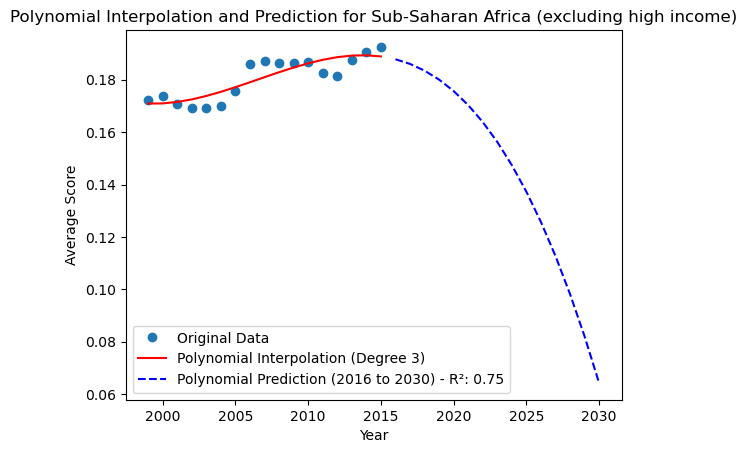

Predicted Polynomial values:
[0.18781531 0.18603261 0.18346662 0.18004239 0.17568498 0.17031946
 0.16387087 0.15626427 0.14742472 0.13727728 0.125747   0.11275895
 0.09823817 0.08210974 0.06429869]

Interpolating for Heavily indebted poor countries (HIPC)...
Trying polynomial degree: 1
R² for degree 1: 0.87
Trying polynomial degree: 2
R² for degree 2: 0.87
Trying polynomial degree: 3
R² for degree 3: 0.88
Trying polynomial degree: 4
R² for degree 4: 0.88
Trying polynomial degree: 5
R² for degree 5: 0.88
Trying polynomial degree: 6
R² for degree 6: 0.88
Trying polynomial degree: 7
R² for degree 7: 0.88
Trying polynomial degree: 8
R² for degree 8: 0.88
Trying polynomial degree: 9
R² for degree 9: 0.88
Trying polynomial degree: 10
R² for degree 10: 0.88
R² scores for each degree:
{1: 0.87, 2: 0.87, 3: 0.88, 4: 0.88, 5: 0.88, 6: 0.88, 7: 0.88, 8: 0.88, 9: 0.88, 10: 0.88}
Best degree for maxizing R2 score:
3
Plotting polynomial interpolation using best degree 3...


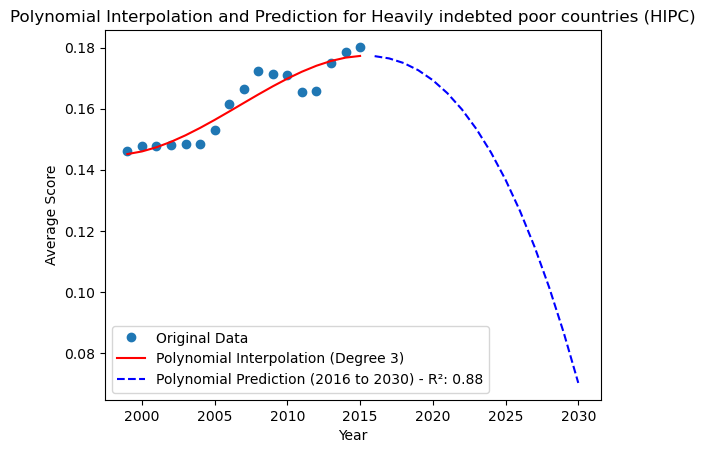

Predicted Polynomial values:
[0.17724714 0.1764956  0.17498002 0.17262608 0.16935945 0.16510583
 0.15979088 0.15334029 0.14567973 0.13673489 0.12643144 0.11469505
 0.10145142 0.08662621 0.0701451 ]

Interpolation completed.


In [62]:
predicted_results_REGIONS, country_r2_scores_REGIONS = interpolate_and_predict(results_REGIONS, 0.9)

In [63]:
country_r2_scores_REGIONS
# Get mean value of country_r2_scores_REGIONS
mean_value = np.mean(list(country_r2_scores_REGIONS.values()))
print("Mean value:", mean_value)

Mean value: 0.867


In [ ]:
predicted_results_COUNTRIES, country_r2_scores_COUNTRIES = interpolate_and_predict(results_COUNTRIES, 0.9)

In [65]:
# Get mean value of country_r2_scores_COUNTRIES
mean_value = np.mean(list(country_r2_scores_COUNTRIES.values()))
print("Mean value:", mean_value)

Mean value: 0.8163849765258215


In [66]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

def plot_countryGroup_trends_V2(results_INCOME, predicted_results_inside, stringGroupName, N_max):
    # Create a copy of the original DataFrame
    results_INCOME_copy = results_INCOME.copy()
    
    # Drop the 'Average Score' column if it exists
    results_INCOME_copy = results_INCOME_copy.drop(columns=['Average Score'], errors='ignore')
    
    # Transpose the DataFrame
    results_transposed = results_INCOME_copy.T
    
    # Exclude the 'Average Score' row
    results_transposed = results_transposed.drop('Average Score', errors='ignore')
    
    # Extract years as numpy array
    years = results_transposed.index.values.reshape(-1, 1)

    # Create a copy with average score column inside
    predicted_results_inside_with_AS = predicted_results_inside
    predicted_results_inside = predicted_results_inside
    # Concatenate the original and predicted DataFrames along the columns
    combined_data = pd.concat([results_INCOME_copy, predicted_results_inside], axis=1)
    
    # Transpose the combined DataFrame for better visualization
    combined_transposed = combined_data
    combined_transposed = combined_transposed.drop(columns=['Average Score'])
    
    #Select top 5 countries for original data (1999 to 2015)
    top_countries_original = results_INCOME_copy.mean(axis=1).sort_values(ascending=False).head(N_max).index
    
    # Select top 5 countries for predicted data (2020 to 2100)
    top_countries_predicted = predicted_results_inside.mean(axis=1).sort_values(ascending=False).head(N_max).index
    
    # Plot the combined data on the same graph
    plt.figure(figsize=(12, 8))
    
    # Assign unique colors to each country
    country_colors = {country: f'C{i % 10}' for i, country in enumerate(combined_transposed.index)}

    plt.plot([], [], ' ', label='\n Original DATA (1999-2015)') 

    cnt_i = 0
    # Plot original data (1999 to 2015)
    for i, country in enumerate(combined_transposed.index):
        if country in top_countries_original:
            plt.plot(combined_transposed.columns[:len(results_INCOME_copy.columns)].astype(str), 
                     combined_transposed.loc[country][:len(results_INCOME_copy.columns)], 
                     marker='o', label=f'{country}', linestyle='-', color=country_colors[country])
            cnt_i = cnt_i+1

    # Add a dummy entry with no line for separation
    plt.plot([], [], ' ', label='   ')  # Adjust the number of spaces for the desired separation

    plt.plot([], [], ' ', label='\n Predicted DATA (2016-2030)')

    # Plot predicted data (2020 to 2100) with different markers
    for i, country in enumerate(combined_transposed.index):
        if country in top_countries_predicted:
            plt.plot(combined_transposed.columns[len(results_INCOME_copy.columns):].astype(str), 
                     combined_transposed.loc[country][len(results_INCOME_copy.columns):], 
                     marker='s', label=f'{country}', linestyle='dashed', color=country_colors[country])
        

    

    plt.title(f'TOP {N_max} - {stringGroupName} Trends Over the Years', fontsize=16, fontweight='bold')
    plt.xlabel('Year', fontsize=14, fontweight='bold')
    plt.ylabel(f'{stringGroupName} Average Score', fontsize=14, fontweight='bold')

    legend = plt.legend(title=f'{stringGroupName} Group', bbox_to_anchor=(1, 1), loc='upper left', fontsize=10, title_fontsize=18)
    legend.get_title().set_fontweight('bold')
    # legend.get_texts()[0].set_text('\nOriginal DATA')
    legend.get_texts()[0].set_fontweight('bold')
    legend.get_texts()[cnt_i+2].set_fontweight('bold')


    # Set x-axis ticks to every 3 years
    plt.xticks(combined_transposed.columns[::3].astype(str), rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)
    
    plt.grid()
    
    plt.show()





    return predicted_results_inside_with_AS


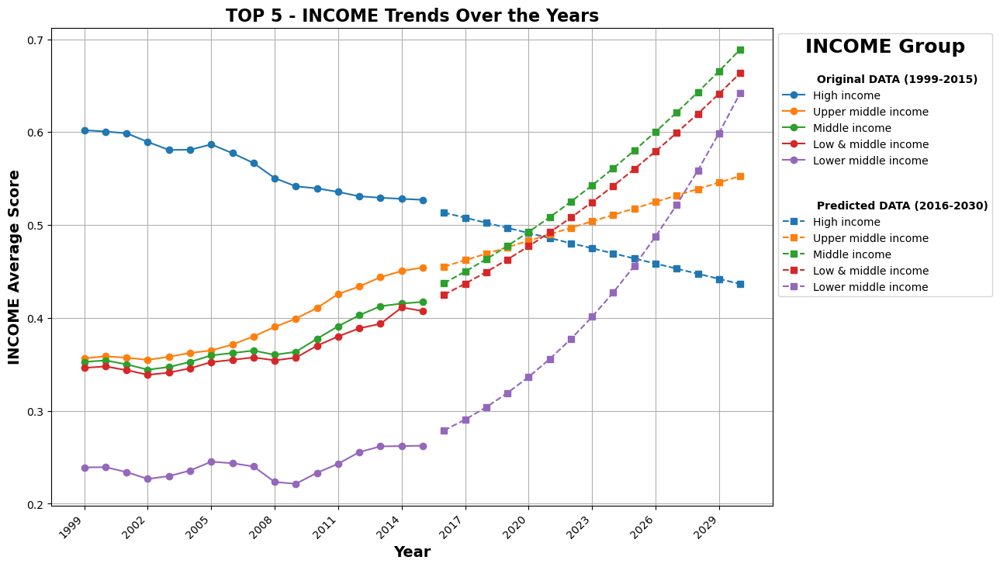

,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,Average Score
Country Name,,,,,,,,,,,,,,,,
High income,0.51,0.51,0.5,0.5,0.49,0.49,0.48,0.47,0.47,0.46,0.46,0.45,0.45,0.44,0.44,0.47
Upper middle income,0.46,0.46,0.47,0.48,0.48,0.49,0.5,0.5,0.51,0.52,0.52,0.53,0.54,0.55,0.55,0.5
Middle income,0.44,0.45,0.46,0.48,0.49,0.51,0.53,0.54,0.56,0.58,0.6,0.62,0.64,0.67,0.69,0.55
Low & middle income,0.43,0.44,0.45,0.46,0.48,0.49,0.51,0.52,0.54,0.56,0.58,0.6,0.62,0.64,0.66,0.53
Lower middle income,0.28,0.29,0.3,0.32,0.34,0.36,0.38,0.4,0.43,0.46,0.49,0.52,0.56,0.6,0.64,0.42
Low income,0.13,0.13,0.13,0.13,0.14,0.14,0.14,0.15,0.15,0.16,0.16,0.17,0.18,0.19,0.19,0.15


In [67]:
predicted_results_INCOME = plot_countryGroup_trends_V2(results_INCOME, predicted_results_INCOME, "INCOME", 5)
predicted_results_INCOME

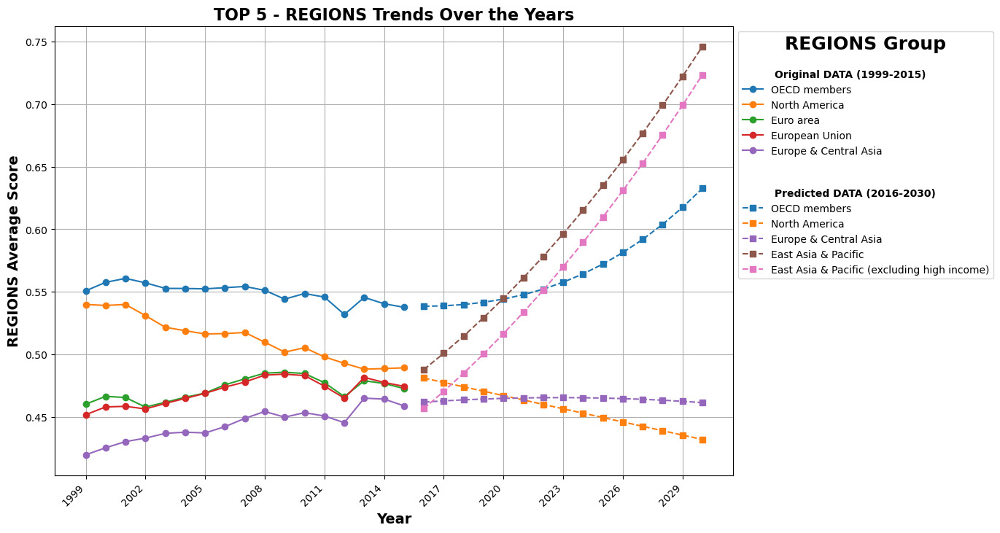

,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,Average Score
Country Name,,,,,,,,,,,,,,,,
OECD members,0.54,0.54,0.54,0.54,0.54,0.55,0.55,0.56,0.56,0.57,0.58,0.59,0.6,0.62,0.63,0.57
North America,0.48,0.48,0.47,0.47,0.47,0.46,0.46,0.46,0.45,0.45,0.45,0.44,0.44,0.44,0.43,0.46
Euro area,0.46,0.45,0.44,0.43,0.41,0.4,0.37,0.35,0.32,0.29,0.26,0.22,0.18,0.13,0.08,0.32
European Union,0.47,0.46,0.46,0.45,0.44,0.43,0.41,0.4,0.38,0.36,0.34,0.32,0.29,0.27,0.24,0.38
Europe & Central Asia,0.46,0.46,0.46,0.46,0.46,0.47,0.47,0.47,0.47,0.47,0.46,0.46,0.46,0.46,0.46,0.46
East Asia & Pacific,0.49,0.5,0.51,0.53,0.54,0.56,0.58,0.6,0.62,0.63,0.66,0.68,0.7,0.72,0.75,0.6
East Asia & Pacific (excluding high income),0.46,0.47,0.49,0.5,0.52,0.53,0.55,0.57,0.59,0.61,0.63,0.65,0.68,0.7,0.72,0.58
Latin America & Caribbean,0.39,0.4,0.4,0.4,0.4,0.41,0.41,0.41,0.41,0.41,0.42,0.42,0.42,0.42,0.42,0.41
Latin America & Caribbean (excluding high income),0.39,0.39,0.4,0.4,0.4,0.4,0.41,0.41,0.41,0.41,0.41,0.42,0.42,0.42,0.42,0.41


In [68]:
predicted_results_REGIONS = plot_countryGroup_trends_V2(results_REGIONS, predicted_results_REGIONS, "REGIONS", 5)
predicted_results_REGIONS

In [69]:
# We remove these two because we already have china. We are interested in countries and not regions inside a country !
predicted_results_COUNTRIES.drop(index='Macao SAR, China', inplace=True)
results_COUNTRIES.drop(index='Macao SAR, China', inplace=True)

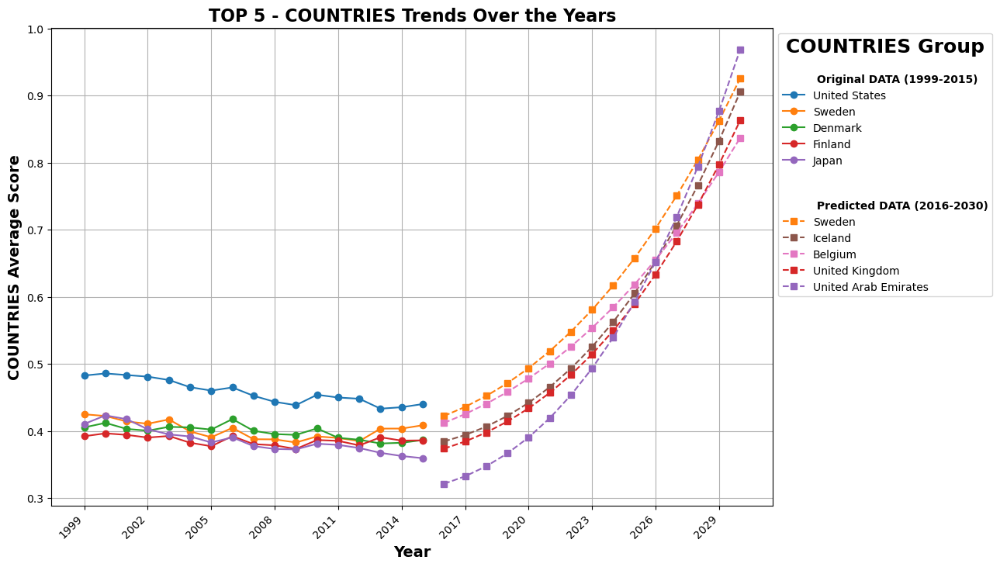

,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,Average Score
Country Name,,,,,,,,,,,,,,,,
United States,0.44,0.44,0.45,0.45,0.46,0.47,0.48,0.49,0.51,0.52,0.54,0.56,0.58,0.61,0.63,0.51
Sweden,0.42,0.44,0.45,0.47,0.49,0.52,0.55,0.58,0.62,0.66,0.7,0.75,0.8,0.86,0.93,0.62
Denmark,0.38,0.37,0.37,0.36,0.36,0.35,0.35,0.34,0.34,0.33,0.32,0.32,0.31,0.3,0.3,0.34
Finland,0.39,0.4,0.4,0.41,0.41,0.42,0.43,0.44,0.45,0.46,0.47,0.48,0.5,0.51,0.53,0.45
Japan,0.36,0.35,0.35,0.34,0.34,0.33,0.32,0.31,0.3,0.29,0.28,0.26,0.24,0.23,0.21,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
St. Martin (French part),0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.05,0.04
Northern Mariana Islands,0.03,0.03,0.03,0.03,0.03,0.03,0.02,0.01,0.0,-0.01,-0.02,-0.04,-0.06,-0.09,-0.11,-0.01
Somalia,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.02,0.02,0.02,0.03,0.03,0.03,0.04,0.02


In [70]:
predicted_results_COUNTRIES = plot_countryGroup_trends_V2(results_COUNTRIES, predicted_results_COUNTRIES, "COUNTRIES", 5)
predicted_results_COUNTRIES

# VI. Some Extra Visualisation <a class="anchor" id="chapter7"></a>

In [71]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.lines import Line2D

def plot_countries_scores(results_GROUP, N_max, year_string):
    # Dictionary for country name replacements
    index_replacements = {
        "United States": "United States of America",
        "Bahamas The": "The Bahamas",
        "Cabo Verde": "Cape Verde",
        "Central African Republic": "Central African Rep.",
        "Congo Dem. Rep.": "Democratic Republic of the Congo",
        "Congo Rep.": "Congo",
        "Gambia The": "Gambia",
        "Iran Islamic Rep.": "Iran",
        "Korea Dem. People’s Rep.": "North Korea",
        "Korea Rep.": "South Korea",
        "Kosovo": "Republic of Kosovo",
        "Macedonia FYR": "North Macedonia",
        "Russian Federation": "Russia",
        "South Sudan": "Republic of South Sudan",
        "Timor-Leste": "East Timor",
        "Yemen Rep.": "South Yemen",
        # Add more replacements as needed
    }

        # Rename index with replacements
    test_copy = results_GROUP.rename(index=index_replacements)

    # Filter world GeoDataFrame based on selected countries
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    world_to_plot = world[world['name'].isin(test_copy.index)]

    # Merge with average scores
    world_to_plot_df = world_to_plot.merge(test_copy[['Average Score']], left_on='name', right_index=True, how='right')
    world_to_plot_df_sorted = world_to_plot_df.sort_values(by='Average Score', ascending=False)

     # Plot the map
    fig, ax = plt.subplots(1, 1, figsize=(35, 15))
    world_to_plot_df_sorted.plot(column='Average Score', cmap=plt.cm.get_cmap('Oranges'), linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
    ax.set_title(f'Selected Countries with Emphasized TOP{N_max} ({year_string})', fontsize=24, fontweight='bold')
    ax.set_xlabel('Longitude', fontsize=18, fontweight='bold')
    ax.set_ylabel('Latitude', fontsize=18, fontweight='bold')

# Emphasize top N countries
    top_N_countries = world_to_plot_df_sorted.head(N_max)
    top_N_countries.plot(ax=ax, color='black',edgecolor='red', linewidth=2.5)

    # Add custom legend for top N countries
    legend_elements = []
    for i, (_, country) in enumerate(top_N_countries.iterrows(), 1):
        label = f"TOP{i}: {country['name']}"
        legend_elements.append(Line2D([0], [0], marker='o', color='black', label=label, markersize=10))

    legend_Emphasized = ax.legend(handles=legend_elements, loc='lower left', title='Emphasized Countries', fontsize=13, title_fontsize=18)
    legend_Emphasized.get_title().set_fontweight('bold')



    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=plt.cm.get_cmap('Oranges'), norm=plt.Normalize(vmin=world_to_plot_df_sorted['Average Score'].min(), vmax=world_to_plot_df_sorted['Average Score'].max()))
    sm._A = []
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical')
    cbar.set_label('Average Score', fontweight='bold', fontsize = '18')  # Set the colorbar title to bold
    cbar.ax.xaxis.set_label_position('top')  # Set the position of the colorbar title to be on top
    cbar.ax.xaxis.set_ticks_position('top')  # Set the position of the colorbar ticks to be on top

    ax.set_xlabel('Longitude', fontsize=18, fontweight='bold')
    ax.set_ylabel('Latitude', fontsize=18, fontweight='bold')

    plt.show()


C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:33: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  world_to_plot_df_sorted.plot(column='Average Score', cmap=plt.cm.get_cmap('Oranges'), linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:64: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colorma

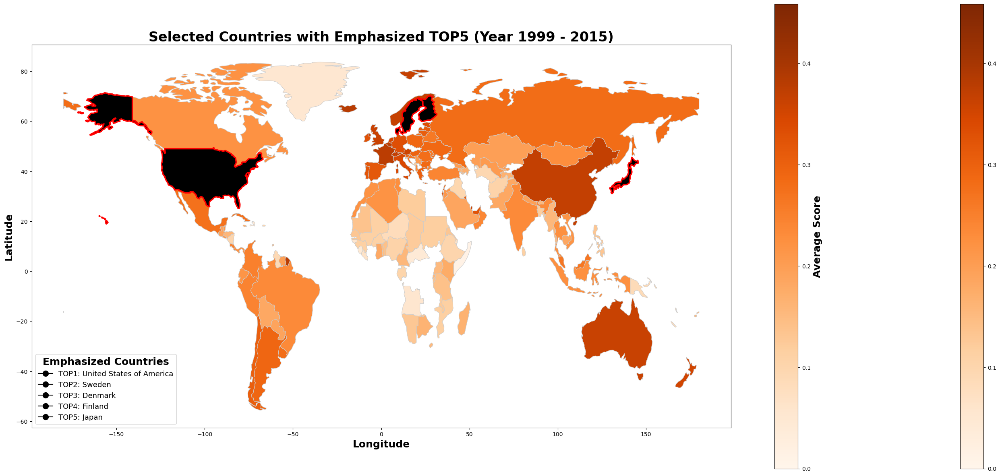

In [72]:
# Plot the geograph
plot_countries_scores(results_COUNTRIES, 5, 'Year 1999 - 2015')

In [73]:
results_COUNTRIES

,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,Average Score
Country Name,,,,,,,,,,,,,,,,,,
United States,4.83e-01,4.86e-01,4.84e-01,4.81e-01,4.76e-01,4.65e-01,4.60e-01,4.65e-01,4.53e-01,4.44e-01,4.39e-01,4.54e-01,4.50e-01,4.48e-01,4.33e-01,4.36e-01,4.40e-01,4.59e-01
Sweden,4.25e-01,4.22e-01,4.14e-01,4.11e-01,4.17e-01,3.99e-01,3.91e-01,4.05e-01,3.88e-01,3.88e-01,3.83e-01,3.92e-01,3.90e-01,3.85e-01,4.04e-01,4.04e-01,4.09e-01,4.02e-01
Denmark,4.05e-01,4.12e-01,4.03e-01,4.01e-01,4.06e-01,4.05e-01,4.02e-01,4.18e-01,4.00e-01,3.95e-01,3.94e-01,4.04e-01,3.90e-01,3.87e-01,3.81e-01,3.83e-01,3.87e-01,3.99e-01
Finland,3.92e-01,3.97e-01,3.94e-01,3.90e-01,3.93e-01,3.83e-01,3.77e-01,3.92e-01,3.81e-01,3.79e-01,3.73e-01,3.87e-01,3.85e-01,3.79e-01,3.91e-01,3.86e-01,3.86e-01,3.86e-01
Japan,4.11e-01,4.23e-01,4.18e-01,4.03e-01,3.95e-01,3.92e-01,3.83e-01,3.91e-01,3.78e-01,3.73e-01,3.73e-01,3.81e-01,3.79e-01,3.75e-01,3.68e-01,3.63e-01,3.60e-01,3.86e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
St. Martin (French part),1.32e-04,5.42e-03,9.13e-03,5.93e-03,1.04e-02,1.52e-02,1.61e-02,1.59e-02,1.57e-02,1.60e-02,1.68e-02,1.91e-02,1.92e-02,1.94e-02,2.34e-02,2.50e-02,2.44e-02,1.51e-02
Northern Mariana Islands,3.91e-02,3.71e-02,2.35e-02,7.76e-03,6.24e-06,5.70e-06,4.67e-06,4.11e-06,3.70e-06,3.63e-06,7.88e-04,4.30e-03,7.18e-03,1.20e-02,2.11e-02,2.39e-02,2.19e-02,1.17e-02
Somalia,2.35e-02,2.21e-02,1.99e-02,1.78e-02,1.58e-02,1.46e-02,1.27e-02,1.06e-02,8.60e-03,7.26e-03,6.09e-03,4.59e-03,4.81e-03,5.33e-03,5.90e-03,6.39e-03,6.79e-03,1.13e-02


C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:33: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  world_to_plot_df_sorted.plot(column='Average Score', cmap=plt.cm.get_cmap('Oranges'), linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:64: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colorma

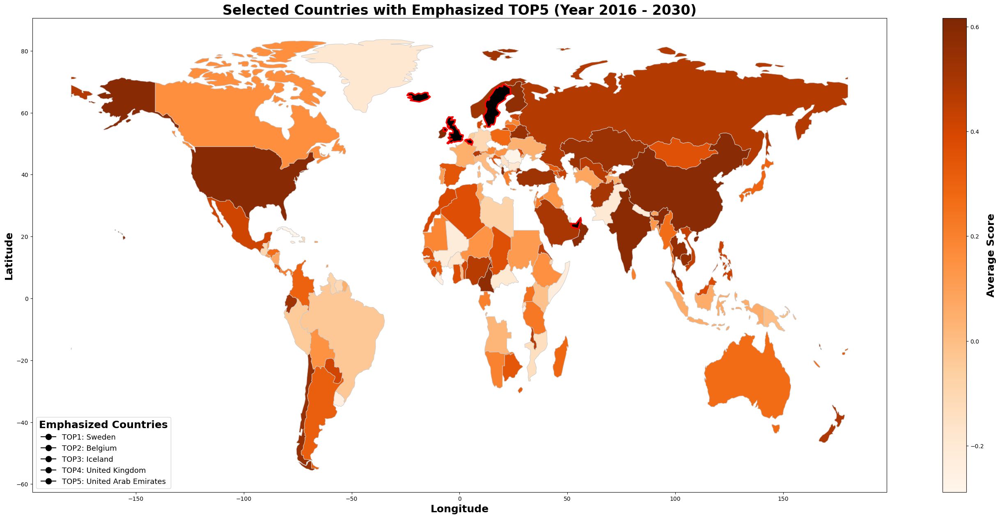

In [74]:
predicted_results_sorted_COUNTRIES = predicted_results_COUNTRIES.sort_values(by='Average Score', ascending=False)
plot_countries_scores(predicted_results_sorted_COUNTRIES, 5, 'Year 2016 - 2030')

In [75]:
def calculate_average_scores(df1, df2):
    # Sort the dataframe by their index
    df1 = df1.sort_index()
    df2 = df2.sort_index()
    
    # Calculate the average of 'Average Score' columns
    average_scores = (df1['Average Score'] + df2['Average Score']) / 2
    # Create a new dataframe with the average scores
    df3 = pd.DataFrame(average_scores, columns=['Average Score'])
    
    #Sort the dataframe by the 'Average Score' column
    df3 = df3.sort_values(by='Average Score', ascending=False)
    
    return df3

df3 = calculate_average_scores(results_COUNTRIES, predicted_results_sorted_COUNTRIES)
df3.head(20)

,Average Score
Country Name,
Sweden,0.51
United States,0.48
Belgium,0.48
Iceland,0.48
United Kingdom,0.46
United Arab Emirates,0.44
Ireland,0.43
China,0.42
Finland,0.42


C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:33: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  world_to_plot_df_sorted.plot(column='Average Score', cmap=plt.cm.get_cmap('Oranges'), linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
C:\Users\Olivi\AppData\Local\Temp\ipykernel_15216\23632570.py:64: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colorma

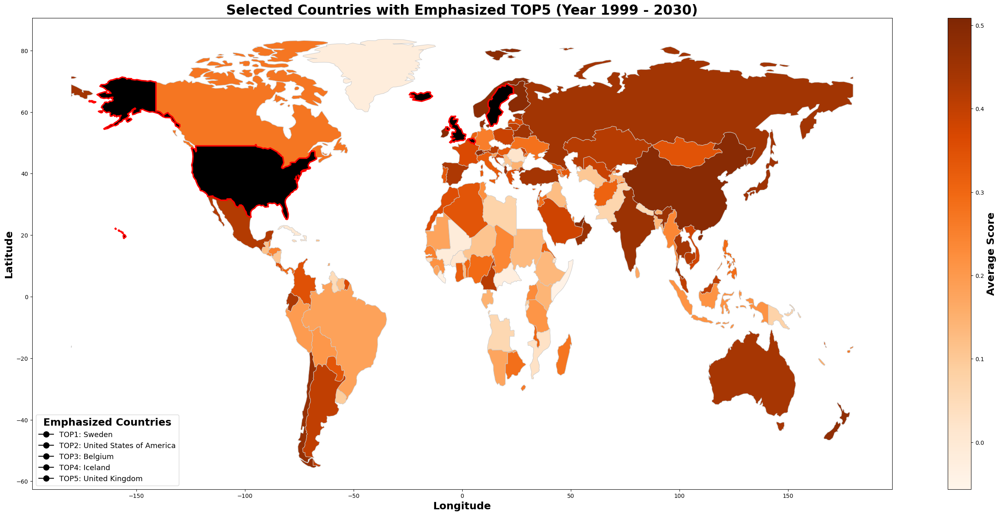

In [76]:
predicted_results_sorted_COUNTRIES = df3.sort_values(by='Average Score', ascending=False)
plot_countries_scores(predicted_results_sorted_COUNTRIES, 5, 'Year 1999 - 2030')